# Analysis for 3000-4500 mz

C3O4 99.9796584808 {'C': 3, 'O': 4}
H52O3 100.39164553864 {'H': 52, 'O': 3}
C1H40O3 100.2977451514 {'C': 1, 'H': 40, 'O': 3}


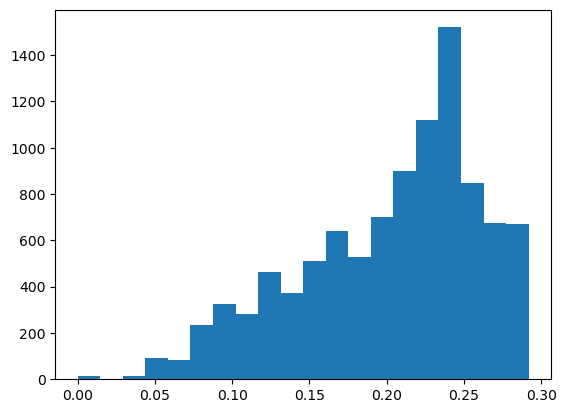

In [1]:
import os 
from glob import glob
from pprint import pprint
from pyteomics import mzxml
import masserstein
from masserstein import Spectrum
import pandas as pd
from copy import deepcopy
import numpy as np
from tqdm import tqdm 
from collections import Counter, OrderedDict
from masserstein.model_selection import get_composition
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.lines import Line2D
from matplotlib.patches import Rectangle, Polygon
import seaborn as sns
import functools
from itertools import cycle, combinations_with_replacement, combinations
import plotly.graph_objects as go
from typing import Dict, List, Tuple
from warnings import warn
import IsoSpecPy as iso

In [2]:
import polymers
Counter.__mul__ = lambda self, x: sum([self]*x, Counter())
Spectrum._normalize = polymers._normalize
Spectrum._gaussian_smoothing = polymers._gaussian_smoothing

from deconv_simplex import dualdeconv4_with_costs
from deconv_simplex import estimate_proportions

In [3]:
import pulp as pl
print(pl.listSolvers(onlyAvailable=True))
gurobi_solver = pl.GUROBI()
gurobi_solver

Set parameter Username
['GLPK_CMD', 'GUROBI', 'GUROBI_CMD', 'PULP_CBC_CMD']


In [155]:
bt = ("BT", Counter(C=36, H=60, S=2))
bt_16 = ("BT", Counter(C=40, H=68, S=2))
tt = ("TT", Counter(C=6, H=2, S=2))
dtt = ("DTT", Counter(C=8, H=2, S=3))

end_groups = dict(
  Stannyl = Counter(C=3, H=9, Sn=1),
  Br = Counter(Br=1),
  H = Counter(H=1),
  Methyl = Counter(C=1, H=3),
  Phenyl = Counter(C=6, H=5),
  # Orthothyl = Counter(C=7, H=7),
)

#we assume there will be only one adduct
adducts = dict(
    H = Counter(H=1),
    Na = Counter(Na=1),
    K = Counter(K=1),
)

endgroup_alt_names = {'Stannyl':'SnMe3',
                      'Br':'Br',
                      'H':'H',
                      'Methyl':'Me',
                      'Phenyl':'Ph',
                     }

# Expert annotations

In [156]:
expert_annotations = {}

annot = []
cores = ['5BT+2TT',
         '5BT+3TT',
         '5BT+4TT',
         '5BT+5TT',
         '5BT+6TT',
         '6BT+3TT',
         '6BT+4TT',
         '6BT+5TT',
         '6BT+6TT',
         '6BT+7TT',
         '7BT+4TT',
        ]
cores2 = ['5BT+4TT',
          '6BT+5TT',
          
         ]
cores3 = ['5BT+5TT',
          '6BT+6TT',
         ]

ends = ['2H',
        'H+Methyl',
        'Br+H',
        'Br+Methyl',
       ]
ends2 = ['2H',
         'H+Methyl',
         '2Methyl',
         'Br+H',
         'Br+Methyl',
         '2Br',
        ]
ends3 = ['2H',
         'H+Methyl',
         'Br+H',
         'Br+Methyl',
         '2Br',
        ]

for core in cores:
    if core in cores2:
        for end in ends2:
            annot.append(core+'+'+end)
    elif core in cores3:
        for end in ends3:
            annot.append(core+'+'+end)
    else:
        if core == '7BT+4TT':
            for end in ends[:2]:
                annot.append(core+'+'+end)
        elif core == '6BT+3TT':
            for end in ends[:3]:
                annot.append(core+'+'+end)
        else:
            for end in ends:
                annot.append(core+'+'+end)
                
expert_annotations['P1'] = annot

annot = []
cores = ['4BT+6TT', 
         '5BT+2TT', 
         '5BT+3TT', 
         '5BT+4TT', 
         '5BT+5TT', 
         '5BT+6TT',
         '5BT+7TT',
         '6BT+3TT',
         '6BT+4TT',
         '6BT+5TT',
         '6BT+6TT',
         '6BT+7TT',
         '6BT+8TT',
        ]
ends = ['2H', 
        'H+Methyl', 
        '2Methyl', 
        'H+Phenyl', 
        'Br+H', 
        'Methyl+Phenyl', 
        'Br+Methyl',
       ]
for core in cores:
    if core == '6BT+8TT':
        for end in ends[:3]:
            annot.append(core+'+'+end)
    else:
        for end in ends:
            annot.append(core+'+'+end)

expert_annotations['P2'] = annot

annot = []    
cores = ['4BT+6TT',
         '4BT+7TT',
         '4BT+8TT',
         '5BT+3TT',
         '5BT+4TT',
         '5BT+5TT',
         '5BT+6TT',
         '5BT+7TT',
         '5BT+8TT',
         '5BT+9TT',
         '6BT+4TT',
         '6BT+5TT',
         '6BT+6TT',
         '6BT+7TT',
         '6BT+8TT', #only first 3 ends
        ]  

ends = ['2H', 
        'H+Methyl', 
        '2Methyl',
        'H+Phenyl',
        'Methyl+Phenyl', 
       ]

for core in cores:
    if core == '6BT+8TT':
        for end in ends[:3]:
            annot.append(core+'+'+end)
    else:
        for end in ends:
            annot.append(core+'+'+end)

expert_annotations['P3'] = annot

expert_annotations['P4'] = annot

def jaccard(mass, expert):
    intersection = len(set(mass).intersection(expert))
    union = (len(mass) + len(expert)) - intersection
    return intersection / union

def jaccard_normalized(mass, expert):
    intersection = len(set(mass).intersection(expert))
    union = len(expert)
    return intersection / union

# Spectra 3000-4500

In [5]:
# loading, preprocessing and plotting empirical signal

pbttt_min_mz=3000
pbttt_max_mz=4500

spectra = []
names = []

folder_path = "./Data"

for path in glob(folder_path+"/**/*.mzXML", recursive=True):
    s = polymers.load_mzxml(path, huge_tree=True)
    print(s.confs[0], s.confs[-1])
    label = os.path.split(path)[-1]
    label = label[:-6]
    print(label)
    s = polymers.restrict(s, pbttt_min_mz-1, pbttt_max_mz+1)
    # baseline correction
    if label == "P3":
        s = polymers.correct_baseline(s, 3000)
    elif label == "P4": 
        s = polymers.correct_baseline(s, 1500)
    else:
        s = polymers.correct_baseline(s, 1000)
    
    s = s._gaussian_smoothing(sd=0.1)

    #centroid
    s = polymers.centroided(s, max_width=0.75, peak_height_fraction=0.5)
    #remove small peaks
    s = polymers.remove_low_signal(s, signal_proportion = 0.005)
    s.label = label

    spectra.append(s)
    names.append(s.label)

P1.mzXML         loaded: 507764 (100.00% non-zero) datapoints in ./Data\P1.mzXML
(1000.2460761165152, 11925.0) (8000.20306525992, 8823.0)
P1
P2.mzXML         loaded: 507693 (100.00% non-zero) datapoints in ./Data\P2.mzXML
(1012.9037785618325, 6780.0) (8036.14358852449, 4151.0)
P2
P3.mzXML         loaded: 507693 (100.00% non-zero) datapoints in ./Data\P3.mzXML
(1012.8759690597336, 7475.0) (8035.808078917192, 6675.0)
P3
P4.mzXML         loaded: 507693 (100.00% non-zero) datapoints in ./Data\P4.mzXML
(1012.8759690597336, 6364.0) (8035.808078917192, 6421.0)
P4


## Save centroided spectra

In [6]:
folder_path = "./Data"

for spectrum, name in zip(spectra, names):
    df = pd.DataFrame(spectrum.confs).T
    df.to_csv(f"{folder_path}/{name}_centroided.csv", index=False, header=False)

## Save reference spectra

In [7]:
folder_path = "./Data"
pbttt_min_mz=3000
pbttt_max_mz=4500

for bt_tt_max_count_difference in [2, 5, 10, 15]:
    expected_spectra = polymers.get_possible_compounds(heavier_monomer = bt, 
                                                lighter_monomer = tt, 
                                                end_groups = end_groups,
                                                min_mz = pbttt_min_mz, 
                                                max_mz = pbttt_max_mz, 
                                                max_count_diff = bt_tt_max_count_difference, 
                                                verbose = False,
                   
    df = pd.DataFrame(np.array([[es.label for es in expected_spectra], [es.confs[0][0] for es in expected_spectra]]))                            )
    df.to_csv(f"{folder_path}/reference_spectra_max_diff_{bt_tt_max_count_difference}.csv", index=False, header=False)


 Found 163 expected spectra

 Found 359 expected spectra

 Found 570 expected spectra

 Found 730 expected spectra


## Save reference spectra - with top peak

In [157]:
folder_path = "./Data"
pbttt_min_mz=3000
pbttt_max_mz=4500

for bt_tt_max_count_difference in [5]:
    expected_spectra = polymers.get_possible_compounds(heavier_monomer = bt, 
                                                lighter_monomer = tt, 
                                                end_groups = end_groups,
                                                min_mz = pbttt_min_mz, 
                                                max_mz = pbttt_max_mz, 
                                                max_count_diff = bt_tt_max_count_difference, 
                                                verbose = False,
                                               )
    df = pd.DataFrame(np.array([[es.label for es in expected_spectra], [es.get_modal_peak()[0] for es in expected_spectra]]))
    
    # df.to_csv(f"{folder_path}/reference_spectra_max_diff_{bt_tt_max_count_difference}.csv", index=False, header=False)


 Found 359 expected spectra


In [160]:
pd.DataFrame(np.array([[es.label for es in expected_spectra], [es.get_modal_peak()[0] for es in expected_spectra]]))

,0,1,2,3,4,5,6,7,8,9,...,349,350,351,352,353,354,355,356,357,358
0,3BT+8TT+Stannyl+Phenyl,4BT+5TT+Methyl+Phenyl,3BT+8TT+Stannyl+Br,4BT+5TT+Br+Methyl,4BT+4TT+Stannyl+Phenyl,5BT+1TT+Methyl+Phenyl,4BT+4TT+Stannyl+Br,5BT+1TT+Br+Methyl,5BT+0TT+Stannyl+Phenyl,5BT+0TT+Stannyl+Br,...,7BT+3TT+Br+Phenyl,7BT+3TT+2Br,7BT+3TT+Stannyl+H,6BT+8TT+2Methyl,6BT+7TT+Stannyl+Methyl,7BT+4TT+2Methyl,5BT+10TT+2Stannyl,7BT+3TT+Stannyl+Methyl,6BT+6TT+2Stannyl,7BT+2TT+2Stannyl
1,3015.9343801421,3008.51949429466,3017.8135930807503,3010.3987072333102,3020.50885477554,3014.0973237633,3022.3880677141897,3015.9765367019504,3026.08668424418,3026.96254234763,...,4466.73906016077,4470.61622509942,4476.76204992212,4476.20966072824,4488.1990212091205,4479.79169434098,4493.613311656561,4490.77769998666,4498.18778629,4500.766465067541


In [159]:
pd.DataFrame(np.array([[es.label for es in expected_spectra], [es.confs[0][0] for es in expected_spectra]])) 

,0,1,2,3,4,5,6,7,8,9,...,349,350,351,352,353,354,355,356,357,358
0,3BT+8TT+Stannyl+Phenyl,4BT+5TT+Methyl+Phenyl,3BT+8TT+Stannyl+Br,4BT+5TT+Br+Methyl,4BT+4TT+Stannyl+Phenyl,5BT+1TT+Methyl+Phenyl,4BT+4TT+Stannyl+Br,5BT+1TT+Br+Methyl,5BT+0TT+Stannyl+Phenyl,5BT+0TT+Stannyl+Br,...,7BT+3TT+Br+Phenyl,7BT+3TT+2Br,7BT+3TT+Stannyl+H,6BT+8TT+2Methyl,6BT+7TT+Stannyl+Methyl,7BT+4TT+2Methyl,5BT+10TT+2Stannyl,7BT+3TT+Stannyl+Methyl,6BT+6TT+2Stannyl,7BT+2TT+2Stannyl
1,3006.9336470069,3007.5161394594597,3008.81285994555,3009.39535239811,3011.50812164034,3012.0906140929,3013.38733457899,3013.9698270315503,3016.08259627378,3017.9618092124297,...,4464.73235049037,4466.61156342902,4466.75796195172,4472.207155201941,4476.19913738282,4476.78162983538,4479.61356363026,4480.77361201626,4484.1880382637,4488.7625128971395


## End-group costs 

In [8]:
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500

cost_2Phenyl, reference_spectra = polymers.average_2Phenyl_cost(heavier_monomer=bt, 
                      lighter_monomer=tt, 
                      end_groups = end_groups, 
                      min_mz=pbttt_min_mz, 
                      max_mz=pbttt_max_mz, 
                      max_count_diff=bt_tt_max_count_difference,
                      verbose=False)

end_groups_costs = dict()
for end1, end2 in combinations_with_replacement(end_groups.keys(), 2):
#     print(end1, end2)
    if end1==end2:
        if end1=="Phenyl": end_groups_costs[f"2{end1}"] = round(cost_2Phenyl, 4)
        else: end_groups_costs[f"2{end1}"] = 0
    else:
        end_groups_costs[f"{end1}+{end2}"] = 0
print(end_groups_costs)

{'2Stannyl': 0, 'Stannyl+Br': 0, 'Stannyl+H': 0, 'Stannyl+Methyl': 0, 'Stannyl+Phenyl': 0, '2Br': 0, 'Br+H': 0, 'Br+Methyl': 0, 'Br+Phenyl': 0, '2H': 0, 'H+Methyl': 0, 'H+Phenyl': 0, '2Methyl': 0, 'Methyl+Phenyl': 0, '2Phenyl': 0.1905}


## Max difference = 2

In [12]:
%%time
# deconvoling over whole interval and saving results to df
other_results = {}

bt_tt_max_count_difference = 2
pbttt_min_mz=3000
pbttt_max_mz=4500

expected_spectra = polymers.get_possible_compounds(heavier_monomer = bt, 
                                            lighter_monomer = tt, end_groups = end_groups,
                                            min_mz = pbttt_min_mz, 
                                            max_mz = pbttt_max_mz, 
                                            max_count_diff = bt_tt_max_count_difference, 
                                            verbose = False,
                                           )
costs = polymers.generate_costs_by_end_group(expected_spectra, end_groups_costs=end_groups_costs)

res = []

for s in spectra:
    full_results = pd.DataFrame(index = [q.label for q in expected_spectra])
    result = estimate_proportions(s._normalize(), expected_spectra, costs, MTD = 0.6, MTD_th = 0.7, MDC = 1e-3, solver=gurobi_solver)
    full_results[s.label] = result['proportions']
    ###################################################
    other_results[s.label] = {'proportions': result['proportions'],
                              'noise': result['noise'], 
                              'noise_in_theoretical': result['noise_in_theoretical'], 
                              'proportion_of_noise_in_theoretical': result['proportion_of_noise_in_theoretical'], 
                              'global_mass_axis': result['global_mass_axis'],
                             }
    ###################################################
    res.append(full_results)
    #save results
    if not os.path.exists(f"Results/max_diff_{bt_tt_max_count_difference}"):
        os.makedirs(f"Results/max_diff_{bt_tt_max_count_difference}")
    full_results.to_csv(f"Results/max_diff_{bt_tt_max_count_difference}/{s.label}_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv")


 Found 163 expected spectra


Computing chunks: 100%|██████████████████████████████████████████████████████████████████████| 131/131 [00:00<?, ?it/s]
Splitting the experimental spectrum into chunks: 599it [00:00, ?it/s]
Deconvolving chunks:   5%|██▊                                                           | 1/22 [00:01<00:25,  1.24s/it]

Gurobi status= 2


Deconvolving chunks:   9%|█████▋                                                        | 2/22 [00:03<00:42,  2.11s/it]

Gurobi status= 2


Deconvolving chunks:  14%|████████▍                                                     | 3/22 [00:05<00:34,  1.82s/it]

Gurobi status= 2


Deconvolving chunks:  18%|███████████▎                                                  | 4/22 [00:06<00:27,  1.55s/it]

Gurobi status= 2


Deconvolving chunks:  23%|██████████████                                                | 5/22 [00:08<00:27,  1.60s/it]

Gurobi status= 2


Deconvolving chunks:  27%|████████████████▉                                             | 6/22 [00:11<00:36,  2.31s/it]

Gurobi status= 2


Deconvolving chunks:  32%|███████████████████▋                                          | 7/22 [00:13<00:31,  2.11s/it]

Gurobi status= 2


Deconvolving chunks:  36%|██████████████████████▌                                       | 8/22 [00:17<00:36,  2.58s/it]

Gurobi status= 2


Deconvolving chunks:  41%|█████████████████████████▎                                    | 9/22 [00:19<00:32,  2.49s/it]

Gurobi status= 2


Deconvolving chunks:  45%|███████████████████████████▋                                 | 10/22 [00:20<00:24,  2.07s/it]

Gurobi status= 2


Deconvolving chunks:  50%|██████████████████████████████▌                              | 11/22 [00:23<00:23,  2.18s/it]

Gurobi status= 2


Deconvolving chunks:  55%|█████████████████████████████████▎                           | 12/22 [00:24<00:18,  1.85s/it]

Gurobi status= 2


Deconvolving chunks:  59%|████████████████████████████████████                         | 13/22 [00:24<00:12,  1.36s/it]

Gurobi status= 2


Deconvolving chunks:  64%|██████████████████████████████████████▊                      | 14/22 [00:25<00:10,  1.31s/it]

Gurobi status= 2


Deconvolving chunks:  68%|█████████████████████████████████████████▌                   | 15/22 [00:25<00:06,  1.01it/s]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  77%|███████████████████████████████████████████████▏             | 17/22 [00:32<00:10,  2.19s/it]

Gurobi status= 2


Deconvolving chunks:  82%|█████████████████████████████████████████████████▉           | 18/22 [00:35<00:08,  2.19s/it]

Gurobi status= 2


Deconvolving chunks:  86%|████████████████████████████████████████████████████▋        | 19/22 [00:37<00:07,  2.37s/it]

Gurobi status= 2


Deconvolving chunks:  91%|███████████████████████████████████████████████████████▍     | 20/22 [00:39<00:04,  2.12s/it]

Gurobi status= 2


Deconvolving chunks:  95%|██████████████████████████████████████████████████████████▏  | 21/22 [00:39<00:01,  1.60s/it]

Gurobi status= 2


Deconvolving chunks: 100%|█████████████████████████████████████████████████████████████| 22/22 [00:41<00:00,  1.90s/it]


Gurobi status= 2


Computing chunks: 100%|██████████████████████████████████████████████████████████████████████| 163/163 [00:00<?, ?it/s]
Splitting the experimental spectrum into chunks: 1269it [00:00, ?it/s]
Deconvolving chunks:   5%|██▊                                                           | 1/22 [00:01<00:27,  1.33s/it]

Gurobi status= 2


Deconvolving chunks:   9%|█████▋                                                        | 2/22 [00:04<00:49,  2.49s/it]

Gurobi status= 2


Deconvolving chunks:  14%|████████▍                                                     | 3/22 [00:06<00:39,  2.08s/it]

Gurobi status= 2


Deconvolving chunks:  18%|███████████▎                                                  | 4/22 [00:09<00:46,  2.56s/it]

Gurobi status= 2


Deconvolving chunks:  23%|██████████████                                                | 5/22 [00:11<00:40,  2.39s/it]

Gurobi status= 2


Deconvolving chunks:  27%|████████████████▉                                             | 6/22 [00:14<00:43,  2.70s/it]

Gurobi status= 2


Deconvolving chunks:  32%|███████████████████▋                                          | 7/22 [00:16<00:35,  2.35s/it]

Gurobi status= 2


Deconvolving chunks:  36%|██████████████████████▌                                       | 8/22 [00:19<00:37,  2.68s/it]

Gurobi status= 2


Deconvolving chunks:  41%|█████████████████████████▎                                    | 9/22 [00:21<00:31,  2.46s/it]

Gurobi status= 2


Deconvolving chunks:  45%|███████████████████████████▋                                 | 10/22 [00:25<00:35,  2.93s/it]

Gurobi status= 2


Deconvolving chunks:  50%|██████████████████████████████▌                              | 11/22 [00:28<00:29,  2.69s/it]

Gurobi status= 2


Deconvolving chunks:  55%|█████████████████████████████████▎                           | 12/22 [00:32<00:32,  3.23s/it]

Gurobi status= 2


Deconvolving chunks:  59%|████████████████████████████████████                         | 13/22 [00:35<00:27,  3.02s/it]

Gurobi status= 2


Deconvolving chunks:  64%|██████████████████████████████████████▊                      | 14/22 [00:39<00:28,  3.52s/it]

Gurobi status= 2


Deconvolving chunks:  68%|█████████████████████████████████████████▌                   | 15/22 [00:42<00:22,  3.24s/it]

Gurobi status= 2


Deconvolving chunks:  73%|████████████████████████████████████████████▎                | 16/22 [00:46<00:21,  3.65s/it]

Gurobi status= 2


Deconvolving chunks:  77%|███████████████████████████████████████████████▏             | 17/22 [00:49<00:16,  3.27s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  86%|████████████████████████████████████████████████████▋        | 19/22 [00:57<00:10,  3.55s/it]

Gurobi status= 2


Deconvolving chunks:  91%|███████████████████████████████████████████████████████▍     | 20/22 [01:03<00:08,  4.24s/it]

Gurobi status= 2


Deconvolving chunks:  95%|██████████████████████████████████████████████████████████▏  | 21/22 [01:06<00:03,  3.92s/it]

Gurobi status= 2
Gurobi status= 2


Computing chunks: 100%|██████████████████████████████████████████████████████████████████████| 161/161 [00:00<?, ?it/s]
Splitting the experimental spectrum into chunks: 928it [00:00, ?it/s]
Deconvolving chunks:   5%|██▊                                                           | 1/22 [00:01<00:28,  1.34s/it]

Gurobi status= 2


Deconvolving chunks:   9%|█████▋                                                        | 2/22 [00:04<00:49,  2.48s/it]

Gurobi status= 2


Deconvolving chunks:  14%|████████▍                                                     | 3/22 [00:06<00:41,  2.20s/it]

Gurobi status= 2


Deconvolving chunks:  18%|███████████▎                                                  | 4/22 [00:10<00:49,  2.75s/it]

Gurobi status= 2


Deconvolving chunks:  23%|██████████████                                                | 5/22 [00:11<00:40,  2.40s/it]

Gurobi status= 2


Deconvolving chunks:  27%|████████████████▉                                             | 6/22 [00:15<00:44,  2.77s/it]

Gurobi status= 2


Deconvolving chunks:  32%|███████████████████▋                                          | 7/22 [00:16<00:32,  2.17s/it]

Gurobi status= 2


Deconvolving chunks:  36%|██████████████████████▌                                       | 8/22 [00:19<00:37,  2.66s/it]

Gurobi status= 2


Deconvolving chunks:  41%|█████████████████████████▎                                    | 9/22 [00:21<00:31,  2.45s/it]

Gurobi status= 2


Deconvolving chunks:  45%|███████████████████████████▋                                 | 10/22 [00:25<00:34,  2.85s/it]

Gurobi status= 2


Deconvolving chunks:  50%|██████████████████████████████▌                              | 11/22 [00:27<00:29,  2.65s/it]

Gurobi status= 2


Deconvolving chunks:  55%|█████████████████████████████████▎                           | 12/22 [00:32<00:32,  3.24s/it]

Gurobi status= 2


Deconvolving chunks:  59%|████████████████████████████████████                         | 13/22 [00:34<00:26,  2.98s/it]

Gurobi status= 2


Deconvolving chunks:  64%|██████████████████████████████████████▊                      | 14/22 [00:39<00:28,  3.56s/it]

Gurobi status= 2


Deconvolving chunks:  68%|█████████████████████████████████████████▌                   | 15/22 [00:42<00:23,  3.30s/it]

Gurobi status= 2


Deconvolving chunks:  73%|████████████████████████████████████████████▎                | 16/22 [00:47<00:22,  3.75s/it]

Gurobi status= 2


Deconvolving chunks:  77%|███████████████████████████████████████████████▏             | 17/22 [00:48<00:14,  2.94s/it]

Gurobi status= 2


Deconvolving chunks:  82%|█████████████████████████████████████████████████▉           | 18/22 [00:52<00:13,  3.46s/it]

Gurobi status= 2


Deconvolving chunks:  86%|████████████████████████████████████████████████████▋        | 19/22 [00:55<00:09,  3.20s/it]

Gurobi status= 2


Deconvolving chunks:  91%|███████████████████████████████████████████████████████▍     | 20/22 [01:01<00:07,  3.87s/it]

Gurobi status= 2


Deconvolving chunks:  95%|██████████████████████████████████████████████████████████▏  | 21/22 [01:03<00:03,  3.59s/it]

Gurobi status= 2
Gurobi status= 2


Computing chunks: 100%|██████████████████████████████████████████████████████████████████████| 162/162 [00:00<?, ?it/s]
Splitting the experimental spectrum into chunks: 953it [00:00, 417720.94it/s]
Deconvolving chunks:   5%|██▊                                                           | 1/22 [00:01<00:27,  1.32s/it]

Gurobi status= 2


Deconvolving chunks:   9%|█████▋                                                        | 2/22 [00:04<00:45,  2.29s/it]

Gurobi status= 2


Deconvolving chunks:  14%|████████▍                                                     | 3/22 [00:05<00:38,  2.01s/it]

Gurobi status= 2


Deconvolving chunks:  18%|███████████▎                                                  | 4/22 [00:09<00:47,  2.64s/it]

Gurobi status= 2


Deconvolving chunks:  23%|██████████████                                                | 5/22 [00:11<00:40,  2.37s/it]

Gurobi status= 2


Deconvolving chunks:  27%|████████████████▉                                             | 6/22 [00:15<00:44,  2.77s/it]

Gurobi status= 2


Deconvolving chunks:  32%|███████████████████▋                                          | 7/22 [00:16<00:36,  2.44s/it]

Gurobi status= 2


Deconvolving chunks:  36%|██████████████████████▌                                       | 8/22 [00:20<00:38,  2.78s/it]

Gurobi status= 2


Deconvolving chunks:  41%|█████████████████████████▎                                    | 9/22 [00:22<00:33,  2.55s/it]

Gurobi status= 2


Deconvolving chunks:  45%|███████████████████████████▋                                 | 10/22 [00:26<00:35,  2.97s/it]

Gurobi status= 2


Deconvolving chunks:  50%|██████████████████████████████▌                              | 11/22 [00:28<00:30,  2.76s/it]

Gurobi status= 2


Deconvolving chunks:  55%|█████████████████████████████████▎                           | 12/22 [00:32<00:32,  3.26s/it]

Gurobi status= 2


Deconvolving chunks:  59%|████████████████████████████████████                         | 13/22 [00:35<00:27,  3.05s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  68%|█████████████████████████████████████████▌                   | 15/22 [00:43<00:24,  3.49s/it]

Gurobi status= 2


Deconvolving chunks:  73%|████████████████████████████████████████████▎                | 16/22 [00:48<00:23,  3.88s/it]

Gurobi status= 2


Deconvolving chunks:  77%|███████████████████████████████████████████████▏             | 17/22 [00:49<00:15,  3.02s/it]

Gurobi status= 2


Deconvolving chunks:  82%|█████████████████████████████████████████████████▉           | 18/22 [00:54<00:14,  3.68s/it]

Gurobi status= 2


Deconvolving chunks:  86%|████████████████████████████████████████████████████▋        | 19/22 [00:57<00:10,  3.41s/it]

Gurobi status= 2


Deconvolving chunks:  91%|███████████████████████████████████████████████████████▍     | 20/22 [01:02<00:08,  4.00s/it]

Gurobi status= 2


Deconvolving chunks:  95%|██████████████████████████████████████████████████████████▏  | 21/22 [01:05<00:03,  3.66s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks: 100%|█████████████████████████████████████████████████████████████| 22/22 [01:11<00:00,  3.27s/it]

Wall time: 4min 16s


In [13]:
sig_numbers = 3
for name in ['P1', 'P2', 'P3', 'P4']:
    print(name)
    print(f"All explained signal: {round(100*sum(other_results[name]['noise']) + 100*sum(other_results[name]['proportions']), sig_numbers)}")
    print(f"Signal in experimental: {round(100*sum(other_results[name]['proportions']), sig_numbers)}")
    print(f"Noise in experimental: {round(100*sum(other_results[name]['noise']), sig_numbers)}")
    print(f"Noise in theoretical: {round(100*sum(other_results[name]['noise_in_theoretical']), sig_numbers)}")
    print(f"Percentage of noise in theorethical: {round(100*other_results[name]['proportion_of_noise_in_theoretical'], sig_numbers)}")
    print(f"Number of polymers detected: {len([p for p in other_results[name]['proportions'] if p > 0])}")
    print("***************************************************")

P1
All explained signal: 100.0
Signal in experimental: 92.042
Noise in experimental: 7.958
Noise in theoretical: 5.447
Percentage of noise in theorethical: 5.447
Number of polymers detected: 68
***************************************************
P2
All explained signal: 100.0
Signal in experimental: 85.091
Noise in experimental: 14.909
Noise in theoretical: 2.667
Percentage of noise in theorethical: 2.667
Number of polymers detected: 115
***************************************************
P3
All explained signal: 100.0
Signal in experimental: 83.297
Noise in experimental: 16.703
Noise in theoretical: 14.766
Percentage of noise in theorethical: 14.766
Number of polymers detected: 84
***************************************************
P4
All explained signal: 100.0
Signal in experimental: 82.628
Noise in experimental: 17.372
Noise in theoretical: 9.252
Percentage of noise in theorethical: 9.252
Number of polymers detected: 81
***************************************************


Homocoupling in the 3000-4500 range of the P1 spectrum: 0.7395974352917112
Minimal homocoupling in the 3000-4500 range of the P1 spectrum: 0.24001322744310458
***************************************************************************************************
Homocoupling in the 3000-4500 range of the P2 spectrum: 0.859292467428571
Minimal homocoupling in the 3000-4500 range of the P2 spectrum: 0.5427999929162786
***************************************************************************************************
Homocoupling in the 3000-4500 range of the P3 spectrum: 1.057800902223767
Minimal homocoupling in the 3000-4500 range of the P3 spectrum: 1.1782636083440008
***************************************************************************************************
Homocoupling in the 3000-4500 range of the P4 spectrum: 0.9278513856031373
Minimal homocoupling in the 3000-4500 range of the P4 spectrum: 1.0313623266313876
*********************************************************************

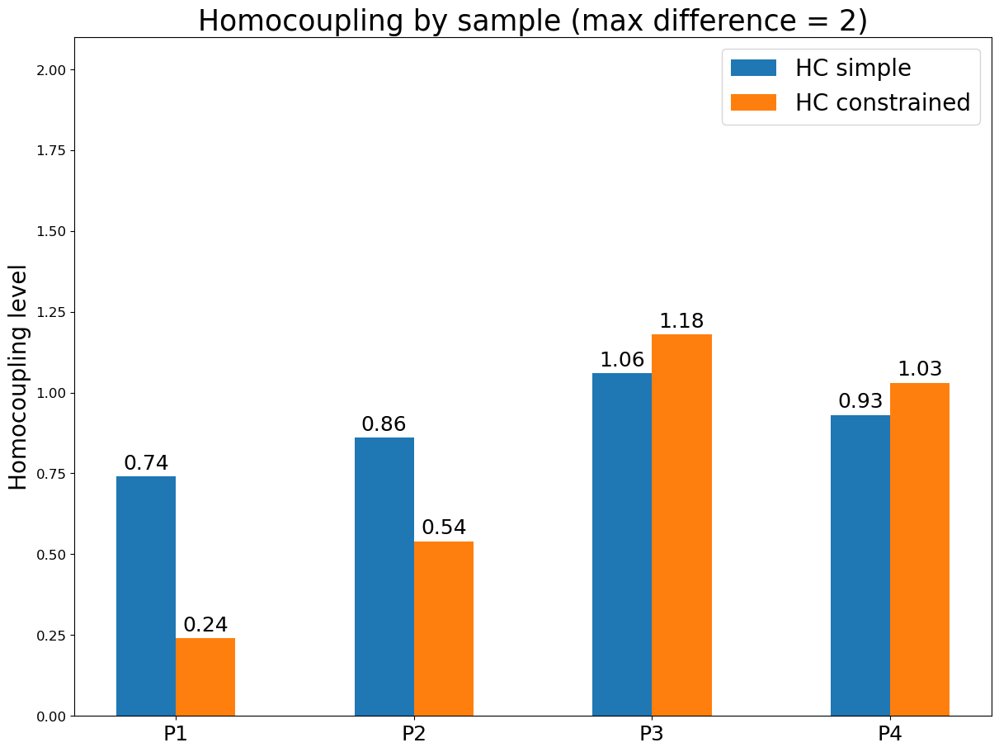

In [6]:
order = ['P1', 'P2', 'P3', 'P4']
bt_tt_max_count_difference = 2
pbttt_min_mz=3000
pbttt_max_mz=4500

res = []
for name in order:
    df = pd.read_csv(f"Results/max_diff_{bt_tt_max_count_difference}/{name}_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv", index_col=0)
    res.append(df)

res = [r.T for r in res]
res_spectras_c14 = pd.concat(res, axis=0)
res_spectras_c14.fillna(0, inplace=True)
res_spectras_c14 = res_spectras_c14.reindex(order)

res_spectras_c14.to_csv(f"Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv") 

# Homocoupling
names = []
hc = []
for ind in res_spectras_c14.index:
    df = res_spectras_c14.loc[[ind]]
    homocoupling = polymers.estimate_homocoupling(df)
    print(f"Homocoupling in the {pbttt_min_mz}-{pbttt_max_mz} range of the {df.index.item()} spectrum: {homocoupling}")
    min_h, min_h_p, probs = polymers.estimate_minimal_homocoupling(df)
    print(f"Minimal homocoupling in the {pbttt_min_mz}-{pbttt_max_mz} range of the {df.index.item()} spectrum: {min_h_p}")
    print("***************************************************************************************************")
    hc.append([homocoupling, min_h_p])
    names.append(ind)

hc = np.array(hc).round(2)

hc_measures = {
  "HC simple": hc[:, 0],
  "HC constrained": hc[:, 1]
}

x = np.arange(len(names))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(figsize=(12, 9), constrained_layout=True)

for attribute, measurement in hc_measures.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3, fontsize=18)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel('Homocoupling level', fontsize=20)
ax.set_title(f'Homocoupling by sample (max difference = {bt_tt_max_count_difference})', fontsize=25)
ax.set_xticks(x + width/2, names, fontsize=18)
ax.legend(loc='upper right', fontsize=20) #, ncols=2)
ax.set_ylim(0, 2.1)
plt.show()

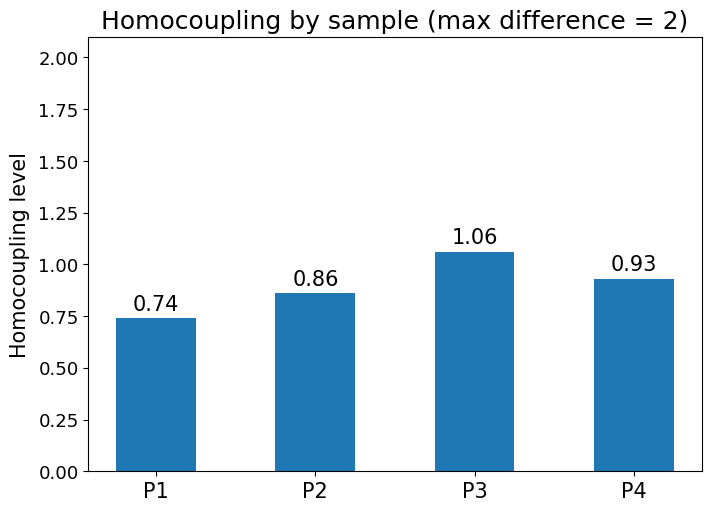

In [12]:
x = np.arange(len(names))  # the label locations
width = 0.5  # the width of the bars

fig, ax = plt.subplots(figsize=(7, 5), constrained_layout=True)

rects = ax.bar(x, hc[:, 0], width, label="HC simple")
ax.bar_label(rects, padding=3, fontsize=15)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.tick_params(axis='y', labelsize=13)
ax.set_ylabel('Homocoupling level', fontsize=15, labelpad=6)
ax.set_title(f'Homocoupling by sample (max difference = {bt_tt_max_count_difference})', fontsize=18)
ax.set_xticks(x, names, fontsize=15)
# ax.legend(loc='upper right', fontsize=20) #, ncols=2)
ax.set_ylim(0, 2.1)
plt.show()

## No costs, max difference = 5

In [37]:
%%time
# deconvoling over whole interval and saving results to df
other_results_no_costs = {}

bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500
expected_spectra = polymers.get_possible_compounds(heavier_monomer = bt, 
                                            lighter_monomer = tt, end_groups = end_groups,
                                            min_mz = pbttt_min_mz, 
                                            max_mz = pbttt_max_mz, 
                                            max_count_diff = bt_tt_max_count_difference, 
                                            verbose = False,
                                           )

res = []

for s in spectra:
    full_results = pd.DataFrame(index = [q.label for q in expected_spectra])
    result = estimate_proportions(s._normalize(), expected_spectra, MTD = 0.6, MTD_th = 0.7, MDC = 1e-3, solver=gurobi_solver)
    full_results[s.label] = result['proportions']
    ###################################################
    other_results_no_costs[s.label] = {'proportions': result['proportions'],
                              'noise': result['noise'], 
                              'noise_in_theoretical': result['noise_in_theoretical'], 
                              'proportion_of_noise_in_theoretical': result['proportion_of_noise_in_theoretical'], 
                              'global_mass_axis': result['global_mass_axis'],
                             }
    ###################################################
    res.append(full_results)
    #save results
    if not os.path.exists(f"Results/max_diff_{bt_tt_max_count_difference}_no_costs"):
        os.makedirs(f"Results/max_diff_{bt_tt_max_count_difference}_no_costs")
    full_results.to_csv(f"Results/max_diff_{bt_tt_max_count_difference}_no_costs/{s.label}_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_no_costs_full_results.csv")


 Found 359 expected spectra


Computing chunks: 100%|██████████████████████████████████████████████████████████| 285/285 [00:00<00:00, 396739.67it/s]
Splitting the experimental spectrum into chunks: 599it [00:00, 848206.65it/s]
Deconvolving chunks:   5%|██▊                                                           | 1/22 [00:04<01:35,  4.56s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  14%|████████▍                                                     | 3/22 [00:14<01:26,  4.55s/it]

Gurobi status= 2


Deconvolving chunks:  18%|███████████▎                                                  | 4/22 [00:16<01:03,  3.55s/it]

Gurobi status= 2


Deconvolving chunks:  23%|██████████████                                                | 5/22 [00:19<00:59,  3.48s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  32%|███████████████████▋                                          | 7/22 [00:31<01:09,  4.61s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  36%|██████████████████████▌                                       | 8/22 [00:39<01:20,  5.73s/it]

Gurobi status= 2


Deconvolving chunks:  45%|███████████████████████████▋                                 | 10/22 [00:48<01:00,  5.07s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  55%|█████████████████████████████████▎                           | 12/22 [00:56<00:44,  4.46s/it]

Gurobi status= 2


Deconvolving chunks:  59%|████████████████████████████████████                         | 13/22 [00:57<00:29,  3.28s/it]

Gurobi status= 2


Deconvolving chunks:  64%|██████████████████████████████████████▊                      | 14/22 [00:59<00:23,  2.88s/it]

Gurobi status= 2


Deconvolving chunks:  68%|█████████████████████████████████████████▌                   | 15/22 [01:00<00:15,  2.23s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  73%|████████████████████████████████████████████▎                | 16/22 [01:10<00:28,  4.75s/it]

Gurobi status= 2


Deconvolving chunks:  77%|███████████████████████████████████████████████▏             | 17/22 [01:16<00:25,  5.02s/it]

Gurobi status= 2


Deconvolving chunks:  82%|█████████████████████████████████████████████████▉           | 18/22 [01:22<00:21,  5.33s/it]

Gurobi status= 2


Deconvolving chunks:  86%|████████████████████████████████████████████████████▋        | 19/22 [01:29<00:17,  5.80s/it]

Gurobi status= 2


Deconvolving chunks:  95%|██████████████████████████████████████████████████████████▏  | 21/22 [01:34<00:04,  4.10s/it]

Gurobi status= 2


Deconvolving chunks: 100%|█████████████████████████████████████████████████████████████| 22/22 [01:38<00:00,  4.49s/it]

Gurobi status= 2



Computing chunks: 100%|██████████████████████████████████████████████████████████████████████| 358/358 [00:00<?, ?it/s]
Splitting the experimental spectrum into chunks: 1269it [00:00, 409870.00it/s]
Deconvolving chunks:   0%|                                                                      | 0/22 [00:00<?, ?it/s]

Gurobi status= 2


Deconvolving chunks:   5%|██▊                                                           | 1/22 [00:04<01:30,  4.29s/it]

Gurobi status= 2


Deconvolving chunks:  14%|████████▍                                                     | 3/22 [00:16<01:44,  5.48s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  23%|██████████████                                                | 5/22 [00:27<01:28,  5.23s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  32%|███████████████████▋                                          | 7/22 [00:39<01:21,  5.44s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  41%|█████████████████████████▎                                    | 9/22 [00:52<01:15,  5.82s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  45%|███████████████████████████▋                                 | 10/22 [01:03<01:28,  7.35s/it]

Gurobi status= 2


Deconvolving chunks:  50%|██████████████████████████████▌                              | 11/22 [01:10<01:20,  7.30s/it]

Gurobi status= 2


Deconvolving chunks:  59%|████████████████████████████████████                         | 13/22 [01:25<01:05,  7.28s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  64%|██████████████████████████████████████▊                      | 14/22 [01:35<01:03,  7.88s/it]

Gurobi status= 2


Deconvolving chunks:  68%|█████████████████████████████████████████▌                   | 15/22 [01:40<00:49,  7.09s/it]

Gurobi status= 2


Deconvolving chunks:  73%|████████████████████████████████████████████▎                | 16/22 [01:50<00:47,  7.95s/it]

Gurobi status= 2


Deconvolving chunks:  77%|███████████████████████████████████████████████▏             | 17/22 [01:56<00:36,  7.37s/it]

Gurobi status= 2


Deconvolving chunks:  82%|█████████████████████████████████████████████████▉           | 18/22 [02:07<00:34,  8.61s/it]

Gurobi status= 2


Deconvolving chunks:  86%|████████████████████████████████████████████████████▋        | 19/22 [02:14<00:24,  8.07s/it]

Gurobi status= 2


Deconvolving chunks:  91%|███████████████████████████████████████████████████████▍     | 20/22 [02:29<00:20, 10.04s/it]

Gurobi status= 2


Deconvolving chunks:  95%|██████████████████████████████████████████████████████████▏  | 21/22 [02:38<00:09,  9.76s/it]

Gurobi status= 2


Computing chunks: 100%|██████████████████████████████████████████████████████████| 344/344 [00:00<00:00, 357492.71it/s]
Splitting the experimental spectrum into chunks: 928it [00:00, 918865.47it/s]
Deconvolving chunks:   5%|██▊                                                           | 1/22 [00:02<01:01,  2.91s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  14%|████████▍                                                     | 3/22 [00:12<01:18,  4.13s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  23%|██████████████                                                | 5/22 [00:22<01:14,  4.38s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  32%|███████████████████▋                                          | 7/22 [00:33<01:10,  4.72s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  41%|█████████████████████████▎                                    | 9/22 [00:47<01:16,  5.87s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  45%|███████████████████████████▋                                 | 10/22 [00:59<01:33,  7.76s/it]

Gurobi status= 2


Deconvolving chunks:  50%|██████████████████████████████▌                              | 11/22 [01:04<01:15,  6.90s/it]

Gurobi status= 2


Deconvolving chunks:  59%|████████████████████████████████████                         | 13/22 [01:19<01:01,  6.78s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  68%|█████████████████████████████████████████▌                   | 15/22 [01:31<00:44,  6.33s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  73%|████████████████████████████████████████████▎                | 16/22 [01:43<00:48,  8.01s/it]

Gurobi status= 2


Deconvolving chunks:  77%|███████████████████████████████████████████████▏             | 17/22 [01:48<00:35,  7.06s/it]

Gurobi status= 2


Deconvolving chunks:  82%|█████████████████████████████████████████████████▉           | 18/22 [02:01<00:34,  8.65s/it]

Gurobi status= 2


Deconvolving chunks:  86%|████████████████████████████████████████████████████▋        | 19/22 [02:08<00:24,  8.27s/it]

Gurobi status= 2


Deconvolving chunks:  91%|███████████████████████████████████████████████████████▍     | 20/22 [02:23<00:20, 10.43s/it]

Gurobi status= 2


Deconvolving chunks:  95%|██████████████████████████████████████████████████████████▏  | 21/22 [02:30<00:09,  9.36s/it]

Gurobi status= 2


Computing chunks: 100%|██████████████████████████████████████████████████████████████████████| 346/346 [00:00<?, ?it/s]
Splitting the experimental spectrum into chunks: 953it [00:00, ?it/s]
Deconvolving chunks:   5%|██▊                                                           | 1/22 [00:03<01:08,  3.24s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  14%|████████▍                                                     | 3/22 [00:13<01:24,  4.44s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  23%|██████████████                                                | 5/22 [00:24<01:20,  4.73s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  27%|████████████████▉                                             | 6/22 [00:32<01:33,  5.85s/it]

Gurobi status= 2


Deconvolving chunks:  32%|███████████████████▋                                          | 7/22 [00:36<01:19,  5.33s/it]

Gurobi status= 2


Deconvolving chunks:  36%|██████████████████████▌                                       | 8/22 [00:45<01:29,  6.43s/it]

Gurobi status= 2


Deconvolving chunks:  41%|█████████████████████████▎                                    | 9/22 [00:50<01:19,  6.15s/it]

Gurobi status= 2


Deconvolving chunks:  45%|███████████████████████████▋                                 | 10/22 [01:03<01:38,  8.19s/it]

Gurobi status= 2


Deconvolving chunks:  50%|██████████████████████████████▌                              | 11/22 [01:08<01:18,  7.18s/it]

Gurobi status= 2


Deconvolving chunks:  59%|████████████████████████████████████                         | 13/22 [01:22<01:01,  6.78s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  68%|█████████████████████████████████████████▌                   | 15/22 [01:36<00:46,  6.63s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  77%|███████████████████████████████████████████████▏             | 17/22 [01:52<00:34,  6.98s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  82%|█████████████████████████████████████████████████▉           | 18/22 [02:04<00:34,  8.56s/it]

Gurobi status= 2


Deconvolving chunks:  86%|████████████████████████████████████████████████████▋        | 19/22 [02:11<00:24,  8.08s/it]

Gurobi status= 2


Deconvolving chunks:  91%|███████████████████████████████████████████████████████▍     | 20/22 [02:26<00:20, 10.13s/it]

Gurobi status= 2


Deconvolving chunks:  95%|██████████████████████████████████████████████████████████▏  | 21/22 [02:33<00:09,  9.10s/it]

Gurobi status= 2


Deconvolving chunks: 100%|█████████████████████████████████████████████████████████████| 22/22 [02:49<00:00,  7.69s/it]

Wall time: 10min 8s


In [38]:
sig_numbers = 3
for name in ['P1', 'P2', 'P3', 'P4']:
    print(name)
    print(f"All explained signal: {round(100*sum(other_results_no_costs[name]['noise']) + 100*sum(other_results_no_costs[name]['proportions']), sig_numbers)}")
    print(f"Signal in experimental: {round(100*sum(other_results_no_costs[name]['proportions']), sig_numbers)}")
    print(f"Noise in experimental: {round(100*sum(other_results_no_costs[name]['noise']), sig_numbers)}")
    print(f"Noise in theoretical: {round(100*sum(other_results_no_costs[name]['noise_in_theoretical']), sig_numbers)}")
    print(f"Percentage of noise in theorethical: {round(100*other_results_no_costs[name]['proportion_of_noise_in_theoretical'], sig_numbers)}")
    print(f"Number of polymers detected: {len([p for p in other_results_no_costs[name]['proportions'] if p > 0])}")
    print("***************************************************")

P1
All explained signal: 100.0
Signal in experimental: 93.406
Noise in experimental: 6.594
Noise in theoretical: 5.643
Percentage of noise in theorethical: 5.643
Number of polymers detected: 93
***************************************************
P2
All explained signal: 100.0
Signal in experimental: 88.37
Noise in experimental: 11.63
Noise in theoretical: 3.088
Percentage of noise in theorethical: 3.088
Number of polymers detected: 148
***************************************************
P3
All explained signal: 100.0
Signal in experimental: 89.797
Noise in experimental: 10.203
Noise in theoretical: 14.296
Percentage of noise in theorethical: 14.296
Number of polymers detected: 113
***************************************************
P4
All explained signal: 100.0
Signal in experimental: 89.345
Noise in experimental: 10.655
Noise in theoretical: 10.612
Percentage of noise in theorethical: 10.612
Number of polymers detected: 114
***************************************************


Homocoupling in the 3000-4500 range of the P1 spectrum: 1.239165351586632
Minimal homocoupling in the 3000-4500 range of the P1 spectrum: 0.6625746500622759
***************************************************************************************************
Homocoupling in the 3000-4500 range of the P2 spectrum: 1.2099410705380833
Minimal homocoupling in the 3000-4500 range of the P2 spectrum: 0.694824019255141
***************************************************************************************************
Homocoupling in the 3000-4500 range of the P3 spectrum: 1.3422915720473994
Minimal homocoupling in the 3000-4500 range of the P3 spectrum: 1.3685502843800739
***************************************************************************************************
Homocoupling in the 3000-4500 range of the P4 spectrum: 1.128563553529888
Minimal homocoupling in the 3000-4500 range of the P4 spectrum: 1.062983003757067
************************************************************************

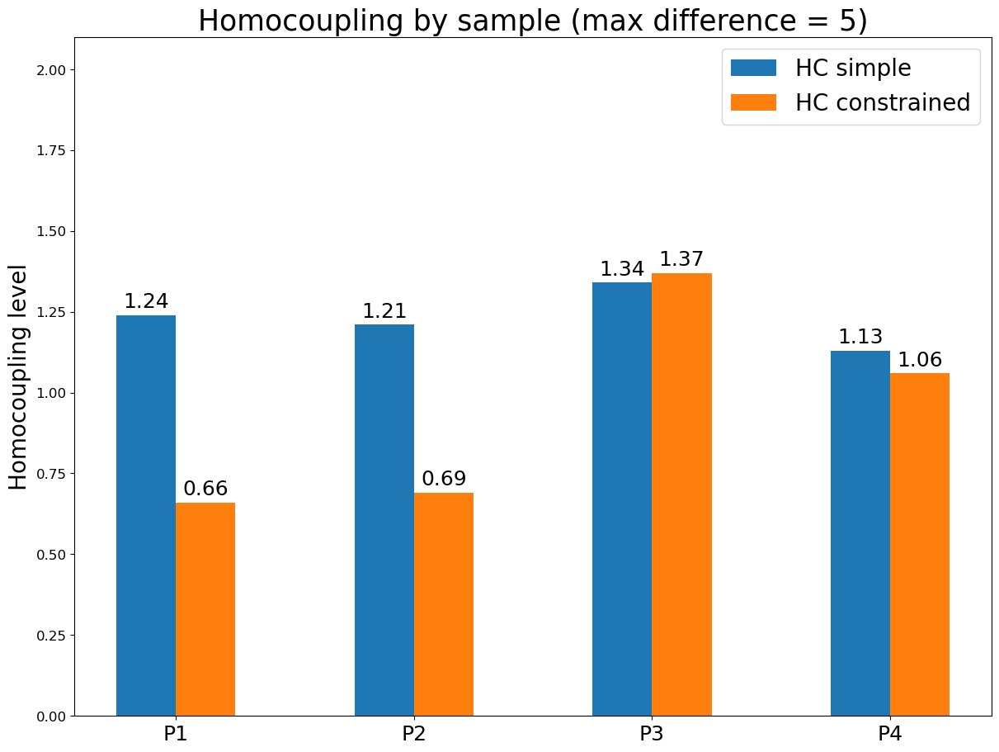

In [13]:
order = ['P1', 'P2', 'P3', 'P4']
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500
res = []
for name in order:
    df = pd.read_csv(f"Results/max_diff_{bt_tt_max_count_difference}_no_costs/{name}_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_no_costs_full_results.csv", index_col=0)
    res.append(df)

res = [r.T for r in res]
res_spectras_c14 = pd.concat(res, axis=0)
res_spectras_c14.fillna(0, inplace=True)
res_spectras_c14 = res_spectras_c14.reindex(order)

res_spectras_c14.to_csv(f"Results/max_diff_{bt_tt_max_count_difference}_no_costs/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_no_costs_full_results.csv") 

# Homocoupling
names = []
hc = []
for ind in res_spectras_c14.index:
    df = res_spectras_c14.loc[[ind]]
    homocoupling = polymers.estimate_homocoupling(df)
    print(f"Homocoupling in the {pbttt_min_mz}-{pbttt_max_mz} range of the {df.index.item()} spectrum: {homocoupling}")
    min_h, min_h_p, probs = polymers.estimate_minimal_homocoupling(df)
    print(f"Minimal homocoupling in the {pbttt_min_mz}-{pbttt_max_mz} range of the {df.index.item()} spectrum: {min_h_p}")
    print("***************************************************************************************************")
    hc.append([homocoupling, min_h_p])
    names.append(ind)

hc = np.array(hc).round(2)

hc_measures = {
  "HC simple": hc[:, 0],
  "HC constrained": hc[:, 1]
}

x = np.arange(len(names))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(figsize=(12, 9), constrained_layout=True)

for attribute, measurement in hc_measures.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3, fontsize=18)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel('Homocoupling level', fontsize=20)
ax.set_title(f'Homocoupling by sample (max difference = {bt_tt_max_count_difference})', fontsize=25)
ax.set_xticks(x + width/2, names, fontsize=18)
ax.legend(loc='upper right', fontsize=20) #, ncols=2)
ax.set_ylim(0, 2.1)
plt.show()

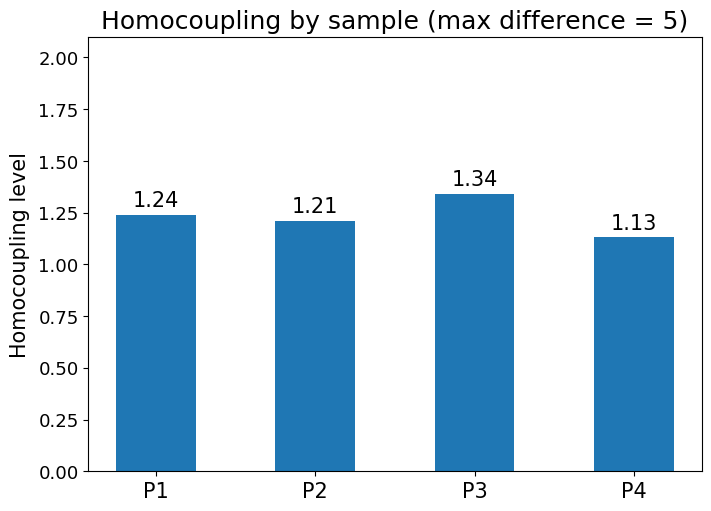

In [14]:
x = np.arange(len(names))  # the label locations
width = 0.5  # the width of the bars

fig, ax = plt.subplots(figsize=(7, 5), constrained_layout=True)

rects = ax.bar(x, hc[:, 0], width, label="HC simple")
ax.bar_label(rects, padding=3, fontsize=15)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.tick_params(axis='y', labelsize=13)
ax.set_ylabel('Homocoupling level', fontsize=15, labelpad=6)
ax.set_title(f'Homocoupling by sample (max difference = {bt_tt_max_count_difference})', fontsize=18)
ax.set_xticks(x, names, fontsize=15)
# ax.legend(loc='upper right', fontsize=20) #, ncols=2)
ax.set_ylim(0, 2.1)
plt.show()

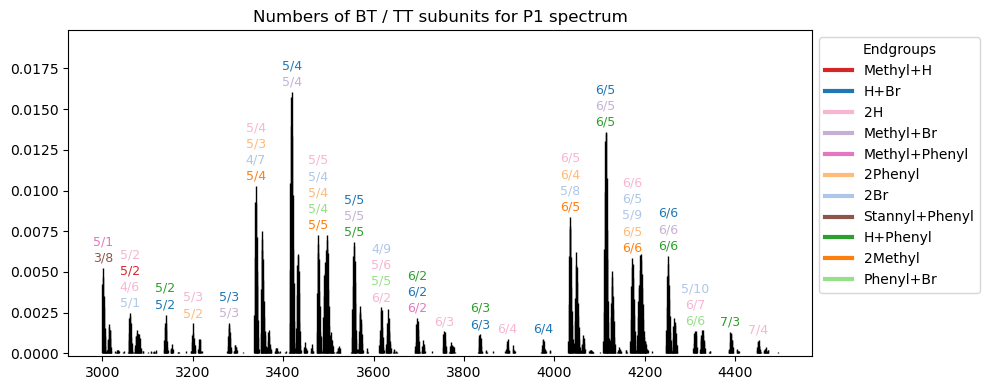

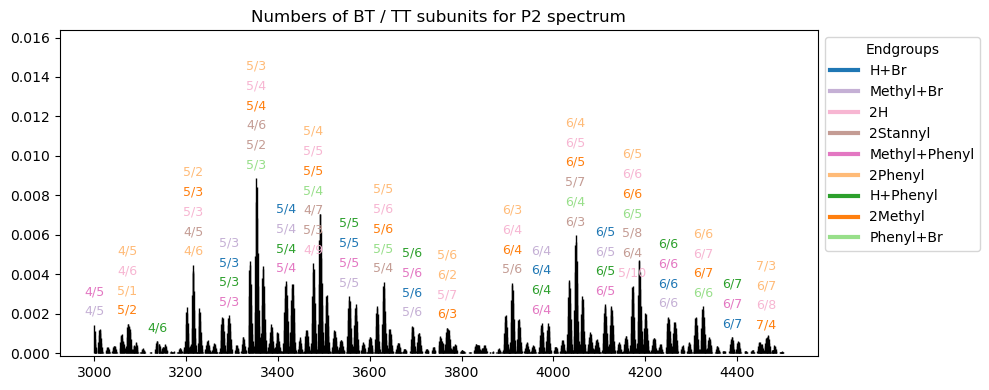

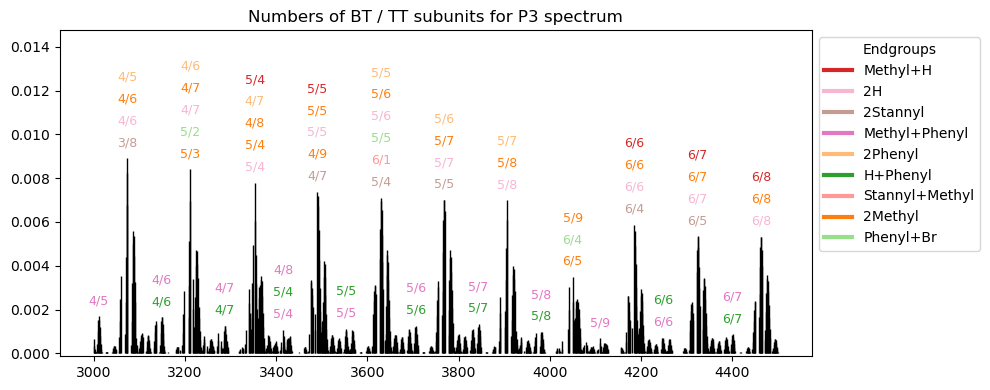

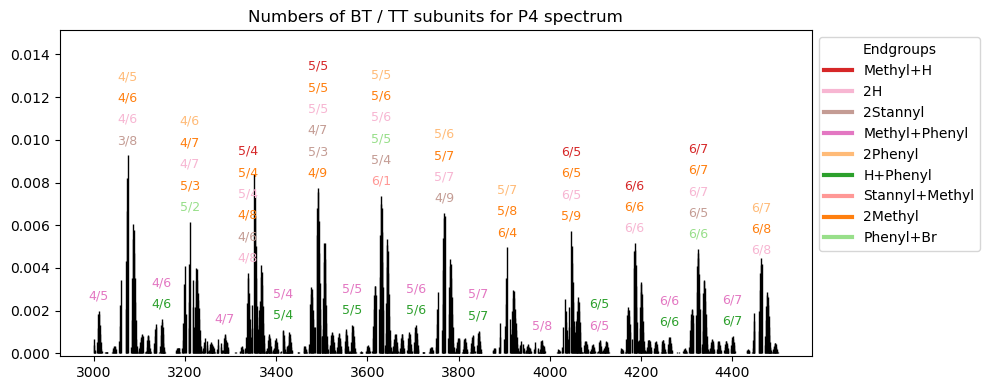

In [42]:
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500

paths = ['Data/P1_centroided.csv', 
         'Data/P2_centroided.csv', 
         'Data/P3_centroided.csv', 
         'Data/P4_centroided.csv',
                           ]
labels = ['P1', 'P2', 'P3', 'P4']

p_thr = 0.002 

output = polymers.parse_annotation_results(annotation_file_path = f'Results/max_diff_5_no_costs/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_no_costs_full_results.csv', 
                                           polymer_info_path = f'Data/reference_spectra_max_diff_{bt_tt_max_count_difference}.csv', 
                                           centroided_spectra_paths = paths, 
                                           centroided_spectra_labels = labels)

proportions_all, polymer_spectra, endgroup_integer_coding, all_different_endgroups_parsed, bt_count, tt_count, masses, hc_types = output

for label in labels:
    proportions = proportions_all[label]
    polymer_spectrum = polymer_spectra[label]
    polymers.plot_annotations(proportions, 
                     polymer_spectrum, 
                     endgroup_integer_coding, 
                     all_different_endgroups_parsed, 
                     bt_count, 
                     tt_count, 
                     masses,
                     proportion_threshold = p_thr,
                     group_width = 20,
                     vertical_separation = 0.001,
                     )

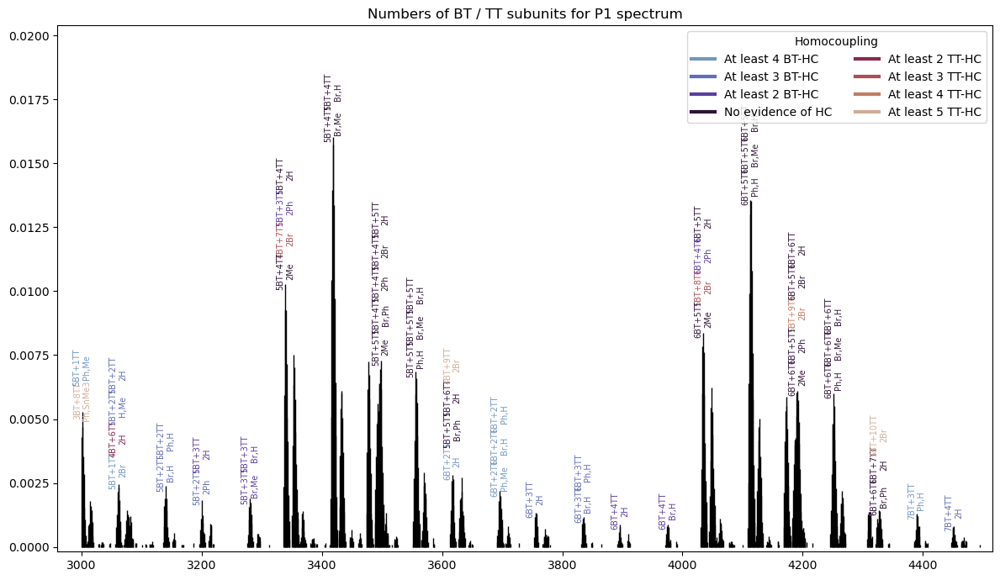

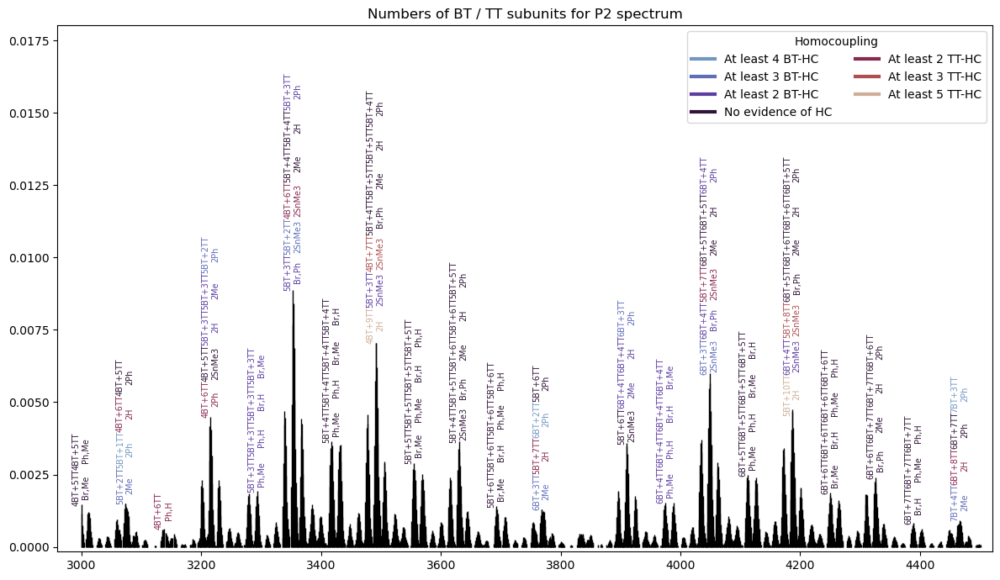

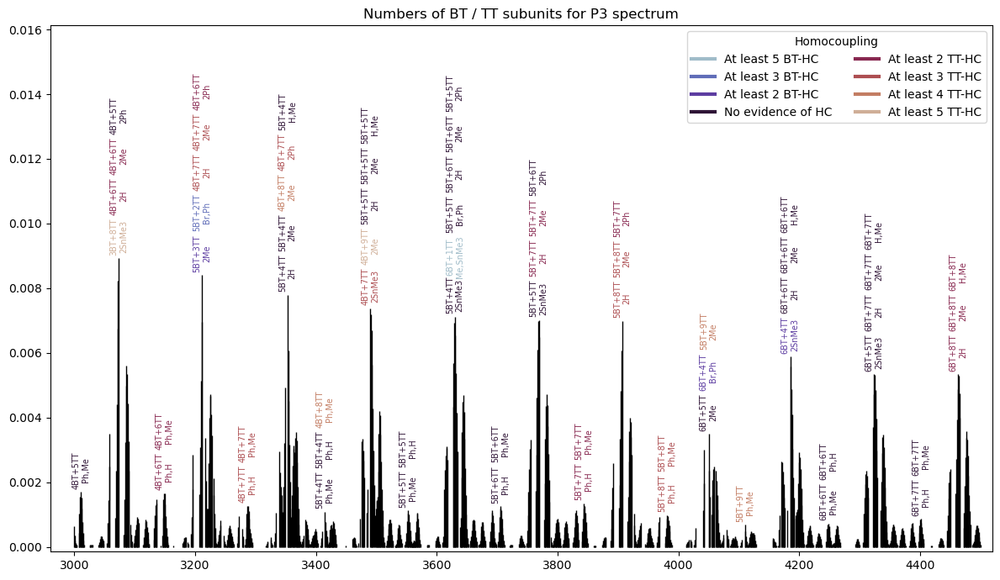

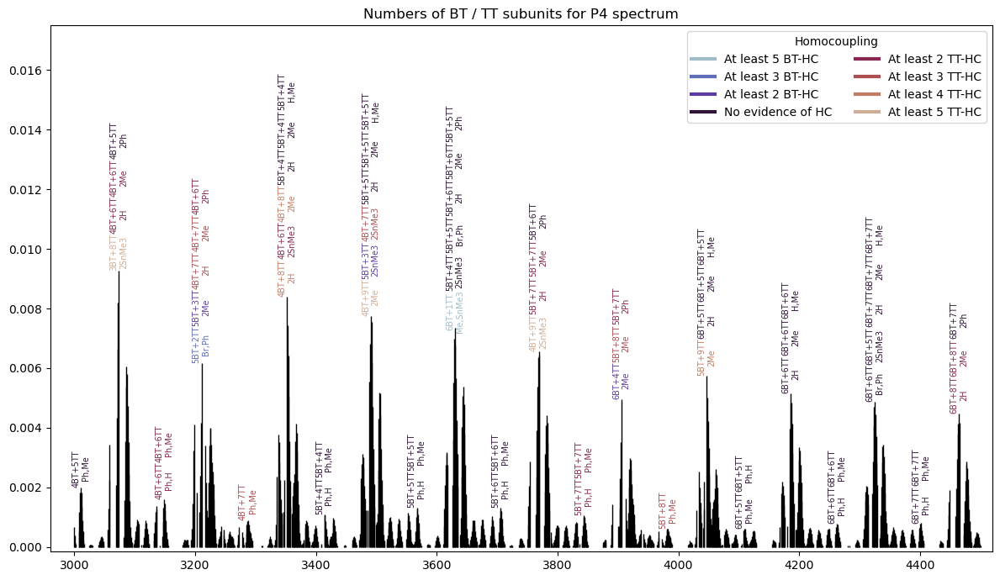

In [9]:
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500

paths = ['Data/P1_centroided.csv', 
         'Data/P2_centroided.csv', 
         'Data/P3_centroided.csv', 
         'Data/P4_centroided.csv',
                           ]
labels = ['P1', 'P2', 'P3', 'P4']

p_thr = 0.002 

output = polymers.parse_annotation_results(annotation_file_path = f'Results/max_diff_5_no_costs/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_no_costs_full_results.csv', 
                                           polymer_info_path = f'Data/reference_spectra_max_diff_{bt_tt_max_count_difference}.csv', 
                                           centroided_spectra_paths = paths, 
                                           centroided_spectra_labels = labels)

proportions_all, polymer_spectra, endgroup_integer_coding, all_different_endgroups_parsed, bt_count, tt_count, masses, hc_types = output

for label in labels:
    proportions = proportions_all[label]
    polymer_spectrum = polymer_spectra[label]
    polymers.plot_annotations_hc(proportions, 
                     polymer_spectrum, 
                     endgroup_integer_coding, 
                     all_different_endgroups_parsed, 
                     bt_count, 
                     tt_count, 
                     masses,
                     hc_types,
                     cmap = 'twilight',
                     proportion_threshold = p_thr,
                     group_width = 25,
                     vertical_separation = 0.00125,
                     endgroup_alt_names = endgroup_alt_names
                     )

## Max difference = 5

In [18]:
%%time
# deconvoling over whole interval and saving results to df
other_results = {}

bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500
expected_spectra = polymers.get_possible_compounds(heavier_monomer = bt, 
                                            lighter_monomer = tt, end_groups = end_groups,
                                            min_mz = pbttt_min_mz, 
                                            max_mz = pbttt_max_mz, 
                                            max_count_diff = bt_tt_max_count_difference, 
                                            verbose = False,
                                           )
costs = polymers.generate_costs_by_end_group(expected_spectra, end_groups_costs=end_groups_costs)

res = []

for s in spectra:
    full_results = pd.DataFrame(index = [q.label for q in expected_spectra])
    result = estimate_proportions(s._normalize(), expected_spectra, costs, MTD = 0.6, MTD_th = 0.7, MDC = 1e-3, solver=gurobi_solver)
    full_results[s.label] = result['proportions']
    ###################################################
    other_results[s.label] = {'proportions': result['proportions'],
                              'noise': result['noise'], 
                              'noise_in_theoretical': result['noise_in_theoretical'], 
                              'proportion_of_noise_in_theoretical': result['proportion_of_noise_in_theoretical'], 
                              'global_mass_axis': result['global_mass_axis'],
                             }
    ###################################################
    res.append(full_results)
    #save results
    if not os.path.exists(f"Results/max_diff_{bt_tt_max_count_difference}"):
        os.makedirs(f"Results/max_diff_{bt_tt_max_count_difference}")
    full_results.to_csv(f"Results/max_diff_{bt_tt_max_count_difference}/{s.label}_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv")



 Found 359 expected spectra


Computing chunks: 100%|██████████████████████████████████████████████████████████████████████| 285/285 [00:00<?, ?it/s]
Splitting the experimental spectrum into chunks: 599it [00:00, ?it/s]
Deconvolving chunks:   5%|██▊                                                           | 1/22 [00:03<01:23,  3.99s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  14%|████████▍                                                     | 3/22 [00:13<01:18,  4.13s/it]

Gurobi status= 2


Deconvolving chunks:  18%|███████████▎                                                  | 4/22 [00:14<00:58,  3.25s/it]

Gurobi status= 2


Deconvolving chunks:  23%|██████████████                                                | 5/22 [00:18<00:57,  3.36s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  32%|███████████████████▋                                          | 7/22 [00:30<01:09,  4.61s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  36%|██████████████████████▌                                       | 8/22 [00:38<01:21,  5.79s/it]

Gurobi status= 2


Deconvolving chunks:  45%|███████████████████████████▋                                 | 10/22 [00:47<00:59,  4.95s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  55%|█████████████████████████████████▎                           | 12/22 [00:55<00:43,  4.37s/it]

Gurobi status= 2


Deconvolving chunks:  59%|████████████████████████████████████                         | 13/22 [00:55<00:29,  3.23s/it]

Gurobi status= 2


Deconvolving chunks:  64%|██████████████████████████████████████▊                      | 14/22 [00:57<00:22,  2.84s/it]

Gurobi status= 2


Deconvolving chunks:  68%|█████████████████████████████████████████▌                   | 15/22 [00:58<00:15,  2.25s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  73%|████████████████████████████████████████████▎                | 16/22 [01:08<00:27,  4.61s/it]

Gurobi status= 2


Deconvolving chunks:  77%|███████████████████████████████████████████████▏             | 17/22 [01:14<00:24,  4.97s/it]

Gurobi status= 2


Deconvolving chunks:  82%|█████████████████████████████████████████████████▉           | 18/22 [01:19<00:20,  5.06s/it]

Gurobi status= 2


Deconvolving chunks:  86%|████████████████████████████████████████████████████▋        | 19/22 [01:26<00:16,  5.56s/it]

Gurobi status= 2


Deconvolving chunks:  95%|██████████████████████████████████████████████████████████▏  | 21/22 [01:32<00:04,  4.00s/it]

Gurobi status= 2


Deconvolving chunks: 100%|█████████████████████████████████████████████████████████████| 22/22 [01:36<00:00,  4.38s/it]

Gurobi status= 2



Computing chunks: 100%|███████████████████████████████████████████████████████████| 358/358 [00:00<00:00, 64370.08it/s]
Splitting the experimental spectrum into chunks: 1269it [00:00, 158277.98it/s]
Deconvolving chunks:   0%|                                                                      | 0/22 [00:00<?, ?it/s]

Gurobi status= 2


Deconvolving chunks:   5%|██▊                                                           | 1/22 [00:04<01:25,  4.06s/it]

Gurobi status= 2


Deconvolving chunks:  14%|████████▍                                                     | 3/22 [00:15<01:33,  4.90s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  23%|██████████████                                                | 5/22 [00:25<01:22,  4.87s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  32%|███████████████████▋                                          | 7/22 [00:37<01:19,  5.28s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  36%|██████████████████████▌                                       | 8/22 [00:45<01:27,  6.24s/it]

Gurobi status= 2


Deconvolving chunks:  41%|█████████████████████████▎                                    | 9/22 [00:50<01:15,  5.84s/it]

Gurobi status= 2


Deconvolving chunks:  45%|███████████████████████████▋                                 | 10/22 [01:00<01:27,  7.29s/it]

Gurobi status= 2


Deconvolving chunks:  50%|██████████████████████████████▌                              | 11/22 [01:07<01:18,  7.10s/it]

Gurobi status= 2


Deconvolving chunks:  55%|█████████████████████████████████▎                           | 12/22 [01:18<01:23,  8.31s/it]

Gurobi status= 2


Deconvolving chunks:  59%|████████████████████████████████████                         | 13/22 [01:22<01:03,  7.09s/it]

Gurobi status= 2


Deconvolving chunks:  64%|██████████████████████████████████████▊                      | 14/22 [01:31<01:01,  7.67s/it]

Gurobi status= 2


Deconvolving chunks:  68%|█████████████████████████████████████████▌                   | 15/22 [01:37<00:49,  7.02s/it]

Gurobi status= 2


Deconvolving chunks:  73%|████████████████████████████████████████████▎                | 16/22 [01:47<00:47,  7.88s/it]

Gurobi status= 2


Deconvolving chunks:  77%|███████████████████████████████████████████████▏             | 17/22 [01:53<00:36,  7.31s/it]

Gurobi status= 2


Deconvolving chunks:  82%|█████████████████████████████████████████████████▉           | 18/22 [02:04<00:34,  8.55s/it]

Gurobi status= 2


Deconvolving chunks:  86%|████████████████████████████████████████████████████▋        | 19/22 [02:11<00:23,  8.00s/it]

Gurobi status= 2


Deconvolving chunks:  91%|███████████████████████████████████████████████████████▍     | 20/22 [02:27<00:20, 10.43s/it]

Gurobi status= 2


Deconvolving chunks:  95%|██████████████████████████████████████████████████████████▏  | 21/22 [02:36<00:09,  9.93s/it]

Gurobi status= 2


Computing chunks: 100%|██████████████████████████████████████████████████████████████████████| 344/344 [00:00<?, ?it/s]
Splitting the experimental spectrum into chunks: 928it [00:00, 843770.67it/s]
Deconvolving chunks:   5%|██▊                                                           | 1/22 [00:02<01:02,  2.99s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  14%|████████▍                                                     | 3/22 [00:12<01:18,  4.12s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  23%|██████████████                                                | 5/22 [00:22<01:12,  4.24s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  32%|███████████████████▋                                          | 7/22 [00:33<01:11,  4.77s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  41%|█████████████████████████▎                                    | 9/22 [00:46<01:13,  5.66s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  50%|██████████████████████████████▌                              | 11/22 [01:01<01:10,  6.41s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  59%|████████████████████████████████████                         | 13/22 [01:16<00:59,  6.56s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  68%|█████████████████████████████████████████▌                   | 15/22 [01:29<00:43,  6.15s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  77%|███████████████████████████████████████████████▏             | 17/22 [01:44<00:33,  6.60s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  82%|█████████████████████████████████████████████████▉           | 18/22 [01:56<00:32,  8.14s/it]

Gurobi status= 2


Deconvolving chunks:  86%|████████████████████████████████████████████████████▋        | 19/22 [02:02<00:23,  7.70s/it]

Gurobi status= 2


Deconvolving chunks:  91%|███████████████████████████████████████████████████████▍     | 20/22 [02:17<00:19,  9.92s/it]

Gurobi status= 2


Deconvolving chunks:  95%|██████████████████████████████████████████████████████████▏  | 21/22 [02:24<00:08,  8.86s/it]

Gurobi status= 2


Computing chunks: 100%|██████████████████████████████████████████████████████████████████████| 346/346 [00:00<?, ?it/s]
Splitting the experimental spectrum into chunks: 953it [00:00, ?it/s]
Deconvolving chunks:   5%|██▊                                                           | 1/22 [00:02<00:53,  2.56s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  14%|████████▍                                                     | 3/22 [00:12<01:14,  3.92s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  23%|██████████████                                                | 5/22 [00:21<01:10,  4.16s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  32%|███████████████████▋                                          | 7/22 [00:32<01:12,  4.86s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  36%|██████████████████████▌                                       | 8/22 [00:40<01:23,  5.96s/it]

Gurobi status= 2


Deconvolving chunks:  41%|█████████████████████████▎                                    | 9/22 [00:45<01:12,  5.59s/it]

Gurobi status= 2


Deconvolving chunks:  50%|██████████████████████████████▌                              | 11/22 [01:01<01:10,  6.45s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  59%|████████████████████████████████████                         | 13/22 [01:14<00:55,  6.13s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  68%|█████████████████████████████████████████▌                   | 15/22 [01:26<00:41,  5.91s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  77%|███████████████████████████████████████████████▏             | 17/22 [01:40<00:31,  6.21s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  82%|█████████████████████████████████████████████████▉           | 18/22 [01:51<00:30,  7.69s/it]

Gurobi status= 2


Deconvolving chunks:  86%|████████████████████████████████████████████████████▋        | 19/22 [01:58<00:21,  7.28s/it]

Gurobi status= 2


Deconvolving chunks:  91%|███████████████████████████████████████████████████████▍     | 20/22 [02:12<00:18,  9.29s/it]

Gurobi status= 2


Deconvolving chunks:  95%|██████████████████████████████████████████████████████████▏  | 21/22 [02:18<00:08,  8.34s/it]

Gurobi status= 2


Deconvolving chunks: 100%|█████████████████████████████████████████████████████████████| 22/22 [02:33<00:00,  6.96s/it]

Wall time: 9min 39s


In [21]:
sig_numbers = 3
for name in ['P1', 'P2', 'P3', 'P4']:
    print(name)
    print(f"All explained signal: {round(100*sum(other_results[name]['noise']) + 100*sum(other_results[name]['proportions']), sig_numbers)}")
    print(f"Signal in experimental: {round(100*sum(other_results[name]['proportions']), sig_numbers)}")
    print(f"Noise in experimental: {round(100*sum(other_results[name]['noise']), sig_numbers)}")
    print(f"Noise in theoretical: {round(100*sum(other_results[name]['noise_in_theoretical']), sig_numbers)}")
    print(f"Percentage of noise in theorethical: {round(100*other_results[name]['proportion_of_noise_in_theoretical'], sig_numbers)}")
    print(f"Number of polymers detected: {len([p for p in other_results[name]['proportions'] if p > 0])}")
    print("***************************************************")

P1
All explained signal: 100.0
Signal in experimental: 93.214
Noise in experimental: 6.786
Noise in theoretical: 5.719
Percentage of noise in theorethical: 5.719
Number of polymers detected: 92
***************************************************
P2
All explained signal: 100.0
Signal in experimental: 88.44
Noise in experimental: 11.56
Noise in theoretical: 3.127
Percentage of noise in theorethical: 3.127
Number of polymers detected: 156
***************************************************
P3
All explained signal: 100.0
Signal in experimental: 89.835
Noise in experimental: 10.165
Noise in theoretical: 14.564
Percentage of noise in theorethical: 14.564
Number of polymers detected: 112
***************************************************
P4
All explained signal: 100.0
Signal in experimental: 89.572
Noise in experimental: 10.428
Noise in theoretical: 10.776
Percentage of noise in theorethical: 10.776
Number of polymers detected: 114
***************************************************


Homocoupling in the 3000-4500 range of the P1 spectrum: 1.2378849407934063
Minimal homocoupling in the 3000-4500 range of the P1 spectrum: 0.7481670288716119
***************************************************************************************************
Homocoupling in the 3000-4500 range of the P2 spectrum: 1.055969723655757
Minimal homocoupling in the 3000-4500 range of the P2 spectrum: 0.6898210390890379
***************************************************************************************************
Homocoupling in the 3000-4500 range of the P3 spectrum: 1.5197561009107652
Minimal homocoupling in the 3000-4500 range of the P3 spectrum: 1.8623592142919934
***************************************************************************************************
Homocoupling in the 3000-4500 range of the P4 spectrum: 1.296406528520446
Minimal homocoupling in the 3000-4500 range of the P4 spectrum: 1.518751354457213
***********************************************************************

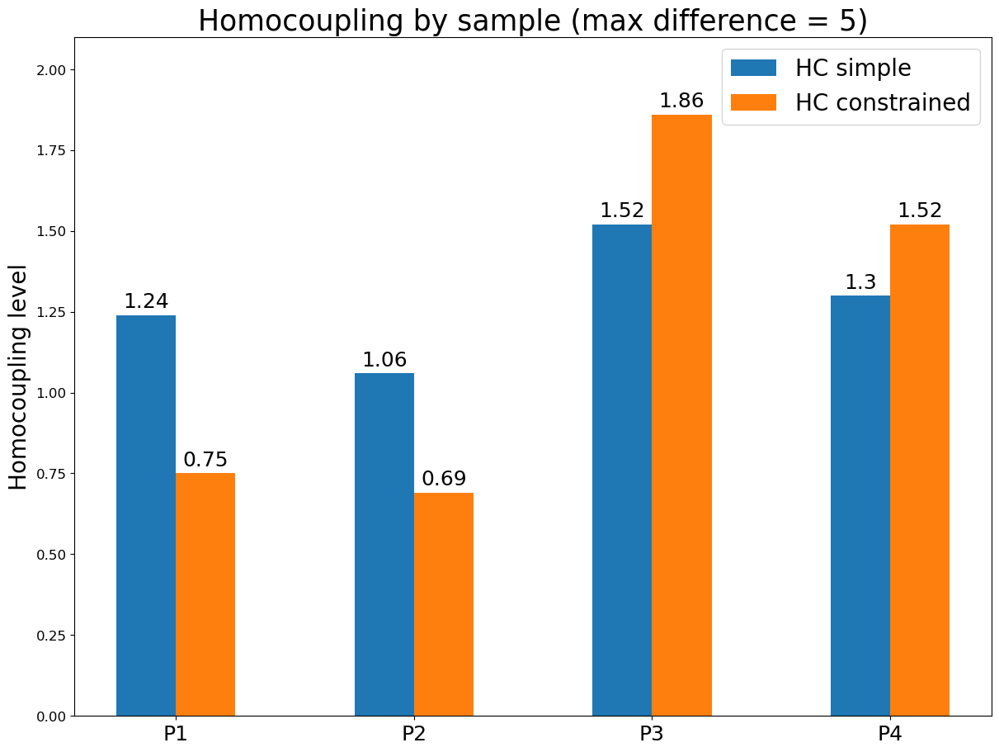

In [15]:
order = ['P1', 'P2', 'P3', 'P4']
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500

res = []
for name in order:
    df = pd.read_csv(f"Results/max_diff_{bt_tt_max_count_difference}/{name}_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv", index_col=0)
    res.append(df)

res = [r.T for r in res]
res_spectras_c14 = pd.concat(res, axis=0)
res_spectras_c14.fillna(0, inplace=True)
res_spectras_c14 = res_spectras_c14.reindex(order)

res_spectras_c14.to_csv(f"Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv") 

# Homocoupling
names = []
hc = []
for ind in res_spectras_c14.index:
    df = res_spectras_c14.loc[[ind]]
    homocoupling = polymers.estimate_homocoupling(df)
    print(f"Homocoupling in the {pbttt_min_mz}-{pbttt_max_mz} range of the {df.index.item()} spectrum: {homocoupling}")
    min_h, min_h_p, probs = polymers.estimate_minimal_homocoupling(df)
    print(f"Minimal homocoupling in the {pbttt_min_mz}-{pbttt_max_mz} range of the {df.index.item()} spectrum: {min_h_p}")
    print("***************************************************************************************************")
    hc.append([homocoupling, min_h_p])
    names.append(ind)

hc = np.array(hc).round(2)

hc_measures = {
  "HC simple": hc[:, 0],
  "HC constrained": hc[:, 1]
}

x = np.arange(len(names))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(figsize=(12, 9), constrained_layout=True)

for attribute, measurement in hc_measures.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3, fontsize=18)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel('Homocoupling level', fontsize=20)
ax.set_title(f'Homocoupling by sample (max difference = {bt_tt_max_count_difference})', fontsize=25)
ax.set_xticks(x + width/2, names, fontsize=18)
ax.legend(loc='upper right', fontsize=20) #, ncols=2)
ax.set_ylim(0, 2.1)
plt.show()

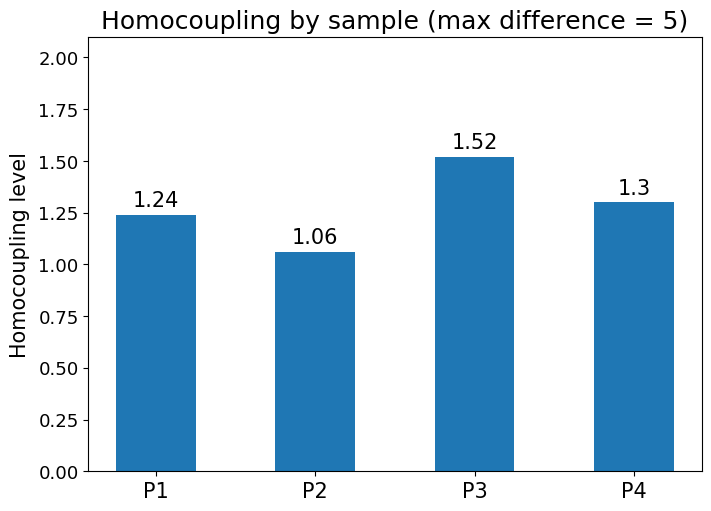

In [16]:
x = np.arange(len(names))  # the label locations
width = 0.5  # the width of the bars

fig, ax = plt.subplots(figsize=(7, 5), constrained_layout=True)

rects = ax.bar(x, hc[:, 0], width, label="HC simple")
ax.bar_label(rects, padding=3, fontsize=15)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.tick_params(axis='y', labelsize=13)
ax.set_ylabel('Homocoupling level', fontsize=15, labelpad=6)
ax.set_title(f'Homocoupling by sample (max difference = {bt_tt_max_count_difference})', fontsize=18)
ax.set_xticks(x, names, fontsize=15)
# ax.legend(loc='upper right', fontsize=20) #, ncols=2)
ax.set_ylim(0, 2.1)
plt.show()

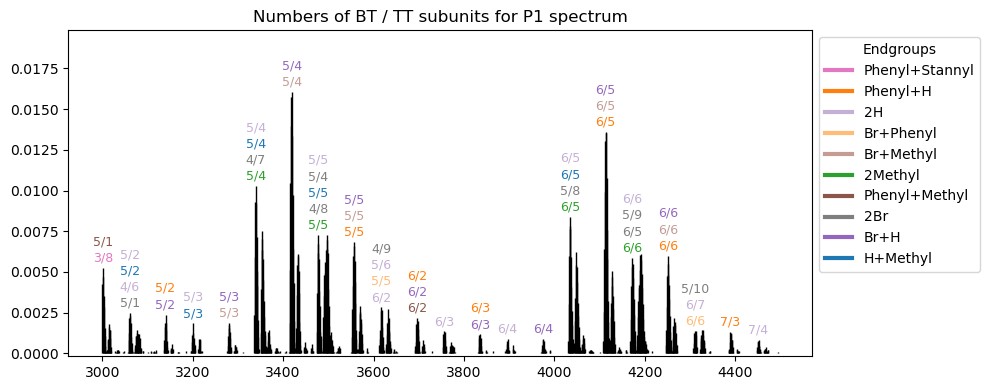

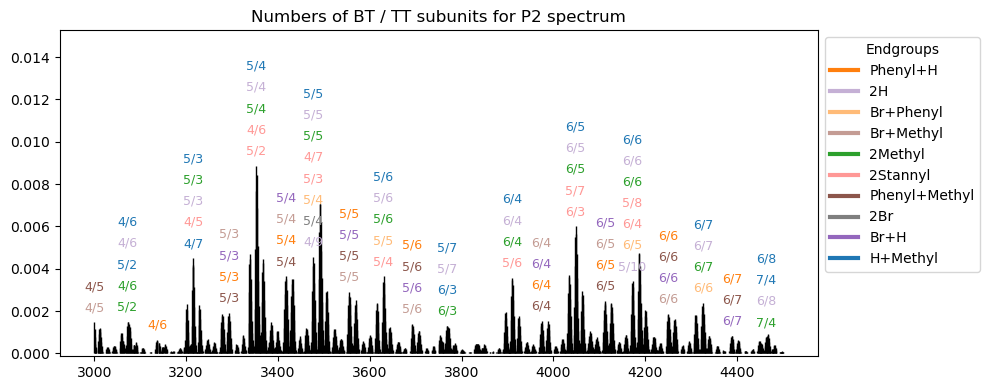

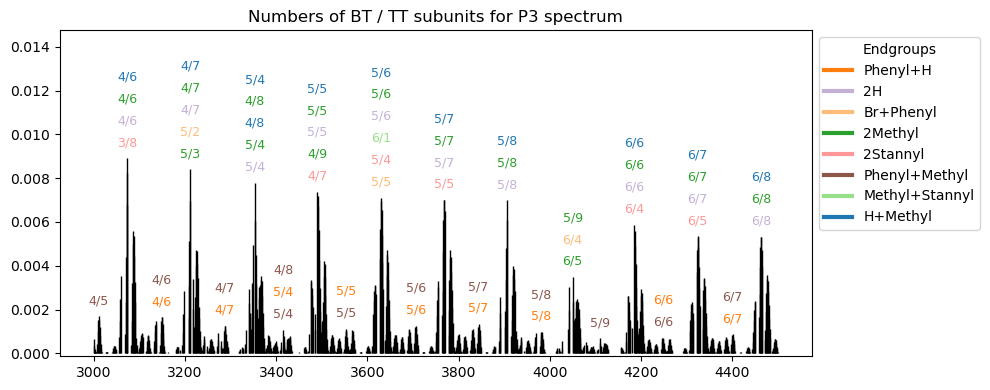

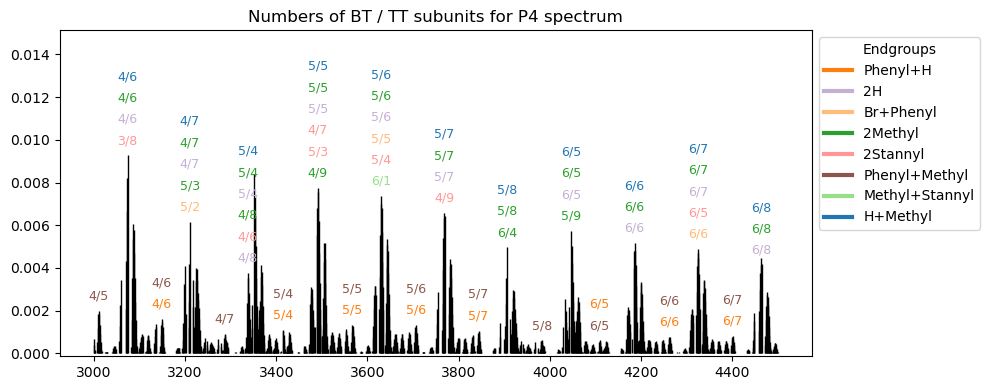

In [24]:
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500

paths = ['Data/P1_centroided.csv', 
         'Data/P2_centroided.csv', 
         'Data/P3_centroided.csv', 
         'Data/P4_centroided.csv',
                           ]
labels = ['P1', 'P2', 'P3', 'P4']

p_thr = 0.002 

output = polymers.parse_annotation_results(annotation_file_path = f'Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv', 
                                           polymer_info_path = f'Data/reference_spectra_max_diff_{bt_tt_max_count_difference}.csv', 
                                           centroided_spectra_paths = paths, 
                                           centroided_spectra_labels = labels)

proportions_all, polymer_spectra, endgroup_integer_coding, all_different_endgroups_parsed, bt_count, tt_count, masses, hc_types = output

for label in labels:
    proportions = proportions_all[label]
    polymer_spectrum = polymer_spectra[label]
    polymers.plot_annotations(proportions, 
                     polymer_spectrum, 
                     endgroup_integer_coding, 
                     all_different_endgroups_parsed, 
                     bt_count, 
                     tt_count, 
                     masses,
                     proportion_threshold = p_thr,
                     group_width = 20,
                     vertical_separation = 0.001,
                     )

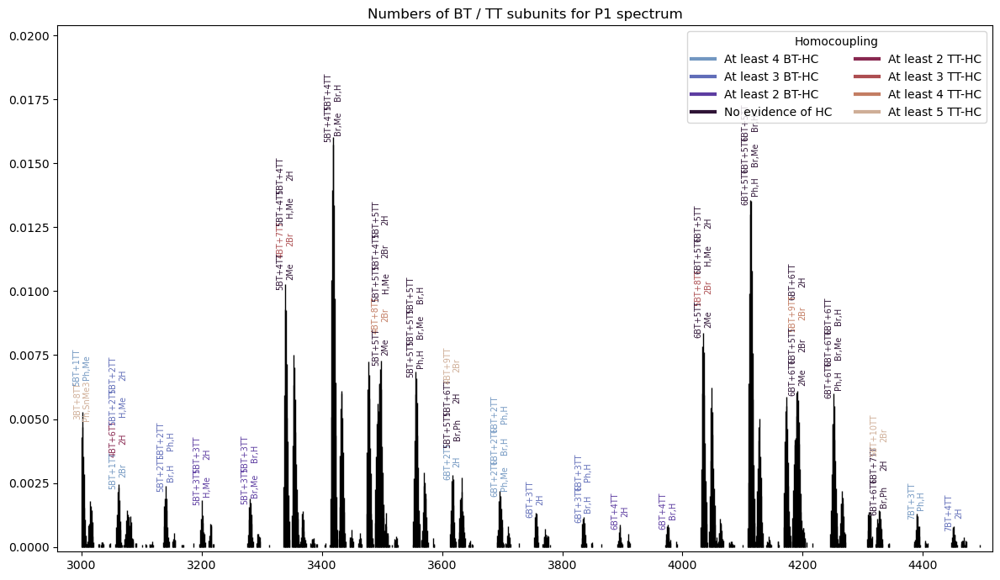

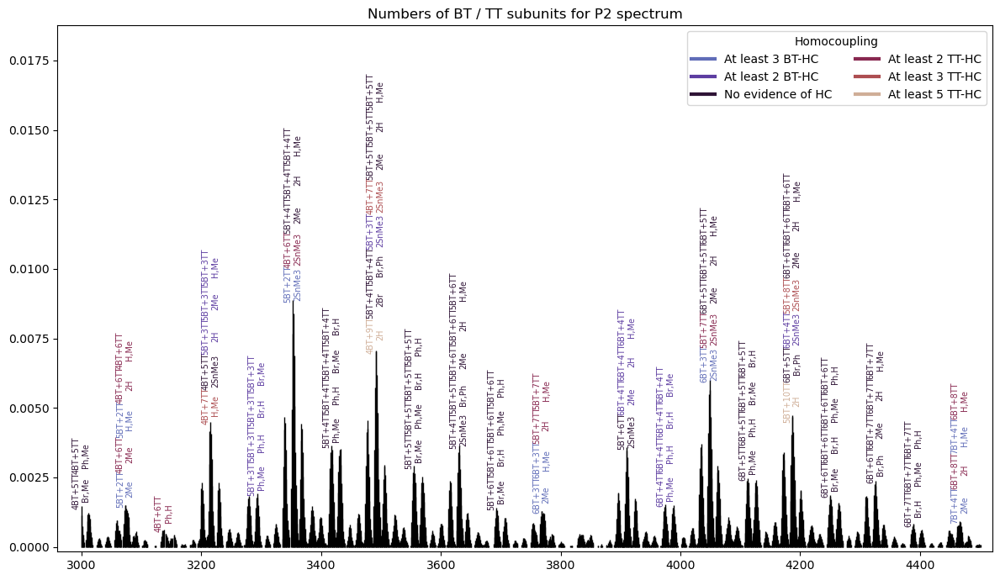

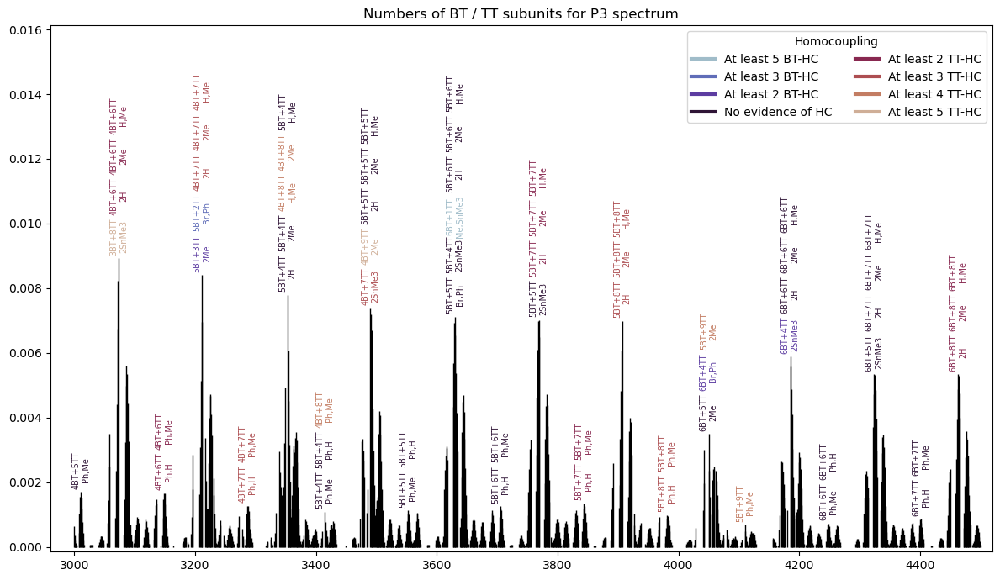

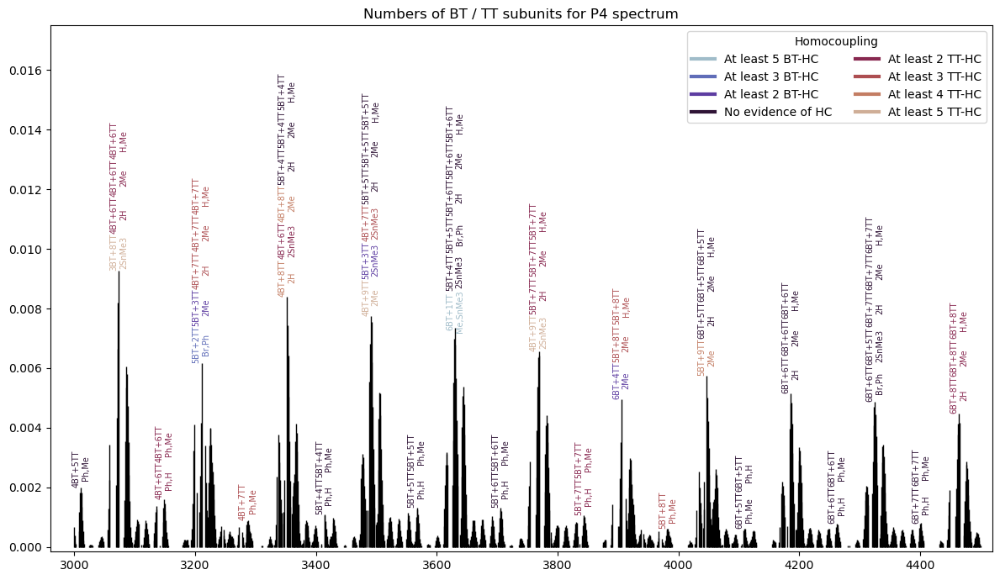

In [25]:
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500

paths = ['Data/P1_centroided.csv', 
         'Data/P2_centroided.csv', 
         'Data/P3_centroided.csv', 
         'Data/P4_centroided.csv',
                           ]
labels = ['P1', 'P2', 'P3', 'P4']

p_thr = 0.002 

output = polymers.parse_annotation_results(annotation_file_path = f'Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv', 
                                           polymer_info_path = f'Data/reference_spectra_max_diff_{bt_tt_max_count_difference}.csv', 
                                           centroided_spectra_paths = paths, 
                                           centroided_spectra_labels = labels)

proportions_all, polymer_spectra, endgroup_integer_coding, all_different_endgroups_parsed, bt_count, tt_count, masses, hc_types = output

for label in labels:
    proportions = proportions_all[label]
    polymer_spectrum = polymer_spectra[label]
    polymers.plot_annotations_hc(proportions, 
                     polymer_spectrum, 
                     endgroup_integer_coding, 
                     all_different_endgroups_parsed, 
                     bt_count, 
                     tt_count, 
                     masses,
                     hc_types,
                     cmap = 'twilight',
                     proportion_threshold = p_thr,
                     group_width = 25,
                     vertical_separation = 0.00125,
                     endgroup_alt_names = endgroup_alt_names
                     )

## Max difference = 10

In [26]:
%%time
# deconvoling over whole interval and saving results to df
other_results = {}

#########################################################
bt_tt_max_count_difference = 10
#########################################################
pbttt_min_mz=3000
pbttt_max_mz=4500
expected_spectra = polymers.get_possible_compounds(heavier_monomer = bt, 
                                            lighter_monomer = tt, end_groups = end_groups,
                                            min_mz = pbttt_min_mz, 
                                            max_mz = pbttt_max_mz, 
                                            max_count_diff = bt_tt_max_count_difference, 
                                            verbose = False,
                                           )
costs = polymers.generate_costs_by_end_group(expected_spectra, end_groups_costs=end_groups_costs)

res = []

for s in spectra:
    full_results = pd.DataFrame(index = [q.label for q in expected_spectra])
    result = estimate_proportions(s._normalize(), expected_spectra, costs, MTD = 0.6, MTD_th = 0.7, MDC = 1e-3, solver=gurobi_solver)
    full_results[s.label] = result['proportions']
    ###################################################
    other_results[s.label] = {'proportions': result['proportions'],
                              'noise': result['noise'], 
                              'noise_in_theoretical': result['noise_in_theoretical'], 
                              'proportion_of_noise_in_theoretical': result['proportion_of_noise_in_theoretical'], 
                              'global_mass_axis': result['global_mass_axis'],
                             }
    ###################################################
    res.append(full_results)
    #save results
    if not os.path.exists(f"Results/max_diff_{bt_tt_max_count_difference}"):
        os.makedirs(f"Results/max_diff_{bt_tt_max_count_difference}")
    full_results.to_csv(f"Results/max_diff_{bt_tt_max_count_difference}/{s.label}_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv")



 Found 570 expected spectra


Computing chunks: 100%|███████████████████████████████████████████████████████████| 472/472 [00:00<00:00, 49125.57it/s]
Splitting the experimental spectrum into chunks: 599it [00:00, 149138.55it/s]
Deconvolving chunks:   0%|                                                                      | 0/18 [00:00<?, ?it/s]

Gurobi status= 2


Deconvolving chunks:   6%|███▍                                                          | 1/18 [00:06<01:55,  6.79s/it]

Gurobi status= 2


Deconvolving chunks:  17%|██████████▎                                                   | 3/18 [00:27<02:08,  8.55s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  22%|█████████████▊                                                | 4/18 [00:33<01:47,  7.67s/it]

Gurobi status= 2


Deconvolving chunks:  28%|█████████████████▏                                            | 5/18 [00:55<02:47, 12.89s/it]

Gurobi status= 2


Deconvolving chunks:  33%|████████████████████▋                                         | 6/18 [01:22<03:30, 17.50s/it]

Gurobi status= 2


Deconvolving chunks:  39%|████████████████████████                                      | 7/18 [01:29<02:37, 14.30s/it]

Gurobi status= 2


Deconvolving chunks:  44%|███████████████████████████▌                                  | 8/18 [01:38<02:04, 12.46s/it]

Gurobi status= 2


Deconvolving chunks:  56%|█████████████████████████████████▉                           | 10/18 [01:44<00:58,  7.32s/it]

Gurobi status= 2


Deconvolving chunks:  61%|█████████████████████████████████████▎                       | 11/18 [01:48<00:43,  6.24s/it]

Gurobi status= 2


Deconvolving chunks:  67%|████████████████████████████████████████▋                    | 12/18 [01:50<00:31,  5.18s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  72%|████████████████████████████████████████████                 | 13/18 [02:25<01:10, 14.19s/it]

Gurobi status= 2


Deconvolving chunks:  78%|███████████████████████████████████████████████▍             | 14/18 [02:40<00:56, 14.24s/it]

Gurobi status= 2


Deconvolving chunks:  83%|██████████████████████████████████████████████████▊          | 15/18 [02:51<00:40, 13.44s/it]

Gurobi status= 2


Deconvolving chunks:  94%|█████████████████████████████████████████████████████████▌   | 17/18 [03:04<00:09,  9.60s/it]

Gurobi status= 2
Gurobi status= 2


Computing chunks: 100%|██████████████████████████████████████████████████████████████████████| 569/569 [00:00<?, ?it/s]
Splitting the experimental spectrum into chunks: 1269it [00:00, ?it/s]
Deconvolving chunks:   0%|                                                                      | 0/12 [00:00<?, ?it/s]

Gurobi status= 2


Deconvolving chunks:   8%|█████▏                                                        | 1/12 [00:05<01:05,  5.97s/it]

Gurobi status= 2


Deconvolving chunks:  17%|██████████▎                                                   | 2/12 [00:24<02:13, 13.33s/it]

Gurobi status= 2


Deconvolving chunks:  25%|███████████████▌                                              | 3/12 [00:43<02:25, 16.13s/it]

Gurobi status= 2


Deconvolving chunks:  33%|████████████████████▋                                         | 4/12 [01:06<02:29, 18.68s/it]

Gurobi status= 2


Deconvolving chunks:  42%|█████████████████████████▊                                    | 5/12 [01:35<02:36, 22.34s/it]

Gurobi status= 2


Deconvolving chunks:  50%|███████████████████████████████                               | 6/12 [02:05<02:30, 25.04s/it]

Gurobi status= 2


Deconvolving chunks:  58%|████████████████████████████████████▏                         | 7/12 [02:31<02:06, 25.34s/it]

Gurobi status= 2


Deconvolving chunks:  67%|█████████████████████████████████████████▎                    | 8/12 [02:57<01:42, 25.64s/it]

Gurobi status= 2


Deconvolving chunks:  75%|██████████████████████████████████████████████▌               | 9/12 [03:29<01:22, 27.40s/it]

Gurobi status= 2


Deconvolving chunks:  83%|██████████████████████████████████████████████████▊          | 10/12 [04:07<01:01, 30.89s/it]

Gurobi status= 2


Deconvolving chunks:  92%|███████████████████████████████████████████████████████▉     | 11/12 [04:52<00:35, 35.01s/it]

Gurobi status= 2


Computing chunks: 100%|██████████████████████████████████████████████████████████████████████| 545/545 [00:00<?, ?it/s]
Splitting the experimental spectrum into chunks: 928it [00:00, ?it/s]
Deconvolving chunks:   0%|                                                                      | 0/12 [00:00<?, ?it/s]

Gurobi status= 2


Deconvolving chunks:   8%|█████▏                                                        | 1/12 [00:04<00:53,  4.83s/it]

Gurobi status= 2


Deconvolving chunks:  17%|██████████▎                                                   | 2/12 [00:21<02:00, 12.05s/it]

Gurobi status= 2


Deconvolving chunks:  25%|███████████████▌                                              | 3/12 [00:38<02:08, 14.27s/it]

Gurobi status= 2


Deconvolving chunks:  33%|████████████████████▋                                         | 4/12 [00:59<02:15, 16.88s/it]

Gurobi status= 2


Deconvolving chunks:  42%|█████████████████████████▊                                    | 5/12 [01:25<02:20, 20.01s/it]

Gurobi status= 2


Deconvolving chunks:  50%|███████████████████████████████                               | 6/12 [01:53<02:16, 22.79s/it]

Gurobi status= 2


Deconvolving chunks:  58%|████████████████████████████████████▏                         | 7/12 [02:19<01:58, 23.74s/it]

Gurobi status= 2


Deconvolving chunks:  67%|█████████████████████████████████████████▎                    | 8/12 [02:44<01:36, 24.15s/it]

Gurobi status= 2


Deconvolving chunks:  75%|██████████████████████████████████████████████▌               | 9/12 [03:13<01:17, 25.87s/it]

Gurobi status= 2


Deconvolving chunks:  83%|██████████████████████████████████████████████████▊          | 10/12 [03:49<00:57, 28.94s/it]

Gurobi status= 2


Deconvolving chunks:  92%|███████████████████████████████████████████████████████▉     | 11/12 [04:28<00:32, 32.12s/it]

Gurobi status= 2


Computing chunks: 100%|██████████████████████████████████████████████████████████████████████| 548/548 [00:00<?, ?it/s]
Splitting the experimental spectrum into chunks: 953it [00:00, ?it/s]
Deconvolving chunks:   0%|                                                                      | 0/12 [00:00<?, ?it/s]

Gurobi status= 2


Deconvolving chunks:   8%|█████▏                                                        | 1/12 [00:05<00:58,  5.29s/it]

Gurobi status= 2


Deconvolving chunks:  17%|██████████▎                                                   | 2/12 [00:22<02:04, 12.44s/it]

Gurobi status= 2


Deconvolving chunks:  25%|███████████████▌                                              | 3/12 [00:40<02:12, 14.67s/it]

Gurobi status= 2


Deconvolving chunks:  33%|████████████████████▋                                         | 4/12 [01:02<02:21, 17.72s/it]

Gurobi status= 2


Deconvolving chunks:  42%|█████████████████████████▊                                    | 5/12 [01:29<02:28, 21.20s/it]

Gurobi status= 2


Deconvolving chunks:  50%|███████████████████████████████                               | 6/12 [01:57<02:20, 23.35s/it]

Gurobi status= 2


Deconvolving chunks:  58%|████████████████████████████████████▏                         | 7/12 [02:21<01:57, 23.49s/it]

Gurobi status= 2


Deconvolving chunks:  67%|█████████████████████████████████████████▎                    | 8/12 [02:45<01:34, 23.72s/it]

Gurobi status= 2


Deconvolving chunks:  75%|██████████████████████████████████████████████▌               | 9/12 [03:14<01:16, 25.47s/it]

Gurobi status= 2


Deconvolving chunks:  83%|██████████████████████████████████████████████████▊          | 10/12 [03:49<00:56, 28.47s/it]

Gurobi status= 2


Deconvolving chunks:  92%|███████████████████████████████████████████████████████▉     | 11/12 [04:26<00:30, 30.83s/it]

Gurobi status= 2


Deconvolving chunks: 100%|█████████████████████████████████████████████████████████████| 12/12 [04:49<00:00, 24.11s/it]

Wall time: 18min 9s


In [28]:
sig_numbers = 3
for name in ['P1', 'P2', 'P3', 'P4']:
    print(name)
    print(f"All explained signal: {round(100*sum(other_results[name]['noise']) + 100*sum(other_results[name]['proportions']), sig_numbers)}")
    print(f"Signal in experimental: {round(100*sum(other_results[name]['proportions']), sig_numbers)}")
    print(f"Noise in experimental: {round(100*sum(other_results[name]['noise']), sig_numbers)}")
    print(f"Noise in theoretical: {round(100*sum(other_results[name]['noise_in_theoretical']), sig_numbers)}")
    print(f"Percentage of noise in theorethical: {round(100*other_results[name]['proportion_of_noise_in_theoretical'], sig_numbers)}")
    print(f"Number of polymers detected: {len([p for p in other_results[name]['proportions'] if p > 0])}")
    print("***************************************************")

P1
All explained signal: 100.0
Signal in experimental: 93.733
Noise in experimental: 6.267
Noise in theoretical: 6.084
Percentage of noise in theorethical: 6.084
Number of polymers detected: 92
***************************************************
P2
All explained signal: 100.0
Signal in experimental: 89.511
Noise in experimental: 10.489
Noise in theoretical: 3.267
Percentage of noise in theorethical: 3.267
Number of polymers detected: 177
***************************************************
P3
All explained signal: 100.0
Signal in experimental: 89.74
Noise in experimental: 10.26
Noise in theoretical: 14.696
Percentage of noise in theorethical: 14.696
Number of polymers detected: 112
***************************************************
P4
All explained signal: 100.0
Signal in experimental: 89.46
Noise in experimental: 10.54
Noise in theoretical: 10.869
Percentage of noise in theorethical: 10.869
Number of polymers detected: 117
***************************************************


Homocoupling in the 3000-4500 range of the P1 spectrum: 1.8889621751660912
Minimal homocoupling in the 3000-4500 range of the P1 spectrum: 1.5384824176989318
***************************************************************************************************
Homocoupling in the 3000-4500 range of the P2 spectrum: 1.2133184930823289
Minimal homocoupling in the 3000-4500 range of the P2 spectrum: 0.8472778146112494
***************************************************************************************************
Homocoupling in the 3000-4500 range of the P3 spectrum: 1.6084261297228457
Minimal homocoupling in the 3000-4500 range of the P3 spectrum: 1.9459253317970475
***************************************************************************************************
Homocoupling in the 3000-4500 range of the P4 spectrum: 1.3937864577093193
Minimal homocoupling in the 3000-4500 range of the P4 spectrum: 1.6083591247600761
********************************************************************

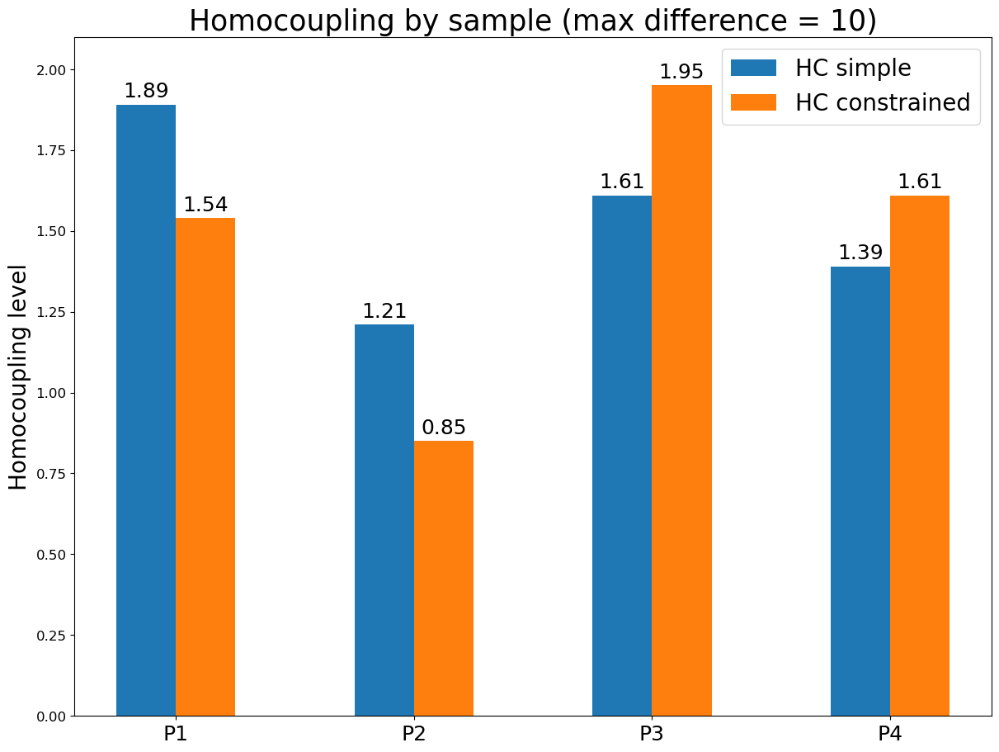

In [17]:
order = ['P1', 'P2', 'P3', 'P4']
#########################################################
bt_tt_max_count_difference = 10
#########################################################
pbttt_min_mz=3000
pbttt_max_mz=4500

res = []
for name in order:
    df = pd.read_csv(f"Results/max_diff_{bt_tt_max_count_difference}/{name}_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv", index_col=0)
    res.append(df)

res = [r.T for r in res]
res_spectras_c14 = pd.concat(res, axis=0)
res_spectras_c14.fillna(0, inplace=True)
res_spectras_c14 = res_spectras_c14.reindex(order)

res_spectras_c14.to_csv(f"Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv") 

# Homocoupling
names = []
hc = []
for ind in res_spectras_c14.index:
    df = res_spectras_c14.loc[[ind]]
    homocoupling = polymers.estimate_homocoupling(df)
    print(f"Homocoupling in the {pbttt_min_mz}-{pbttt_max_mz} range of the {df.index.item()} spectrum: {homocoupling}")
    min_h, min_h_p, probs = polymers.estimate_minimal_homocoupling(df)
    print(f"Minimal homocoupling in the {pbttt_min_mz}-{pbttt_max_mz} range of the {df.index.item()} spectrum: {min_h_p}")
    print("***************************************************************************************************")
    hc.append([homocoupling, min_h_p])
    names.append(ind)

hc = np.array(hc).round(2)

hc_measures = {
  "HC simple": hc[:, 0],
  "HC constrained": hc[:, 1]
}

x = np.arange(len(names))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(figsize=(12, 9), constrained_layout=True)

for attribute, measurement in hc_measures.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3, fontsize=18)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel('Homocoupling level', fontsize=20)
ax.set_title(f'Homocoupling by sample (max difference = {bt_tt_max_count_difference})', fontsize=25)
ax.set_xticks(x + width/2, names, fontsize=18)
ax.legend(loc='upper right', fontsize=20) #, ncols=2)
ax.set_ylim(0, 2.1)
plt.show()

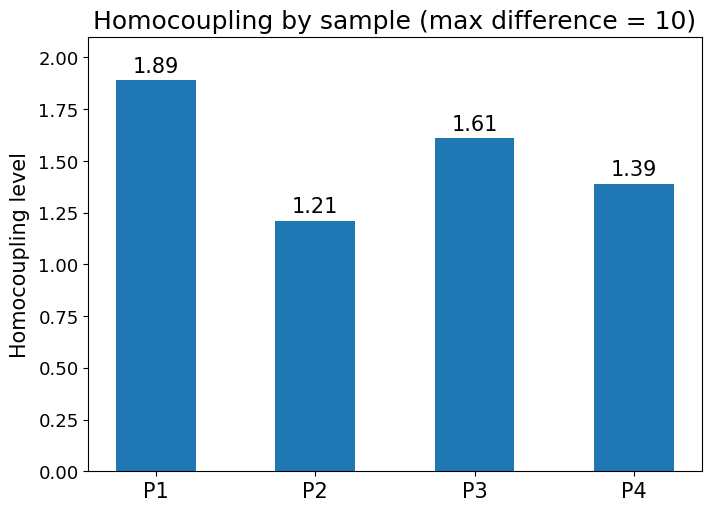

In [18]:
x = np.arange(len(names))  # the label locations
width = 0.5  # the width of the bars

fig, ax = plt.subplots(figsize=(7, 5), constrained_layout=True)

rects = ax.bar(x, hc[:, 0], width, label="HC simple")
ax.bar_label(rects, padding=3, fontsize=15)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.tick_params(axis='y', labelsize=13)
ax.set_ylabel('Homocoupling level', fontsize=15, labelpad=6)
ax.set_title(f'Homocoupling by sample (max difference = {bt_tt_max_count_difference})', fontsize=18)
ax.set_xticks(x, names, fontsize=15)
# ax.legend(loc='upper right', fontsize=20) #, ncols=2)
ax.set_ylim(0, 2.1)
plt.show()

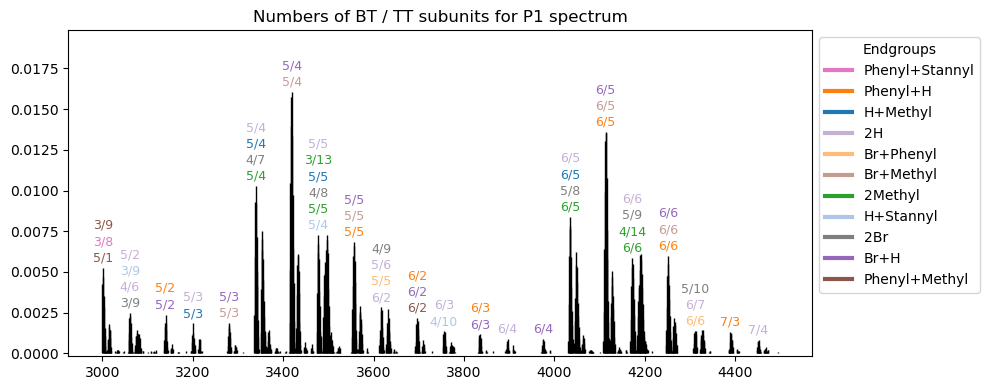

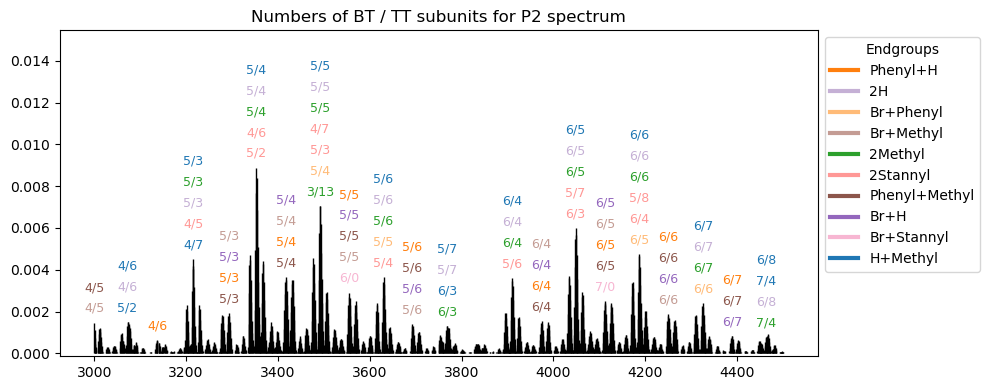

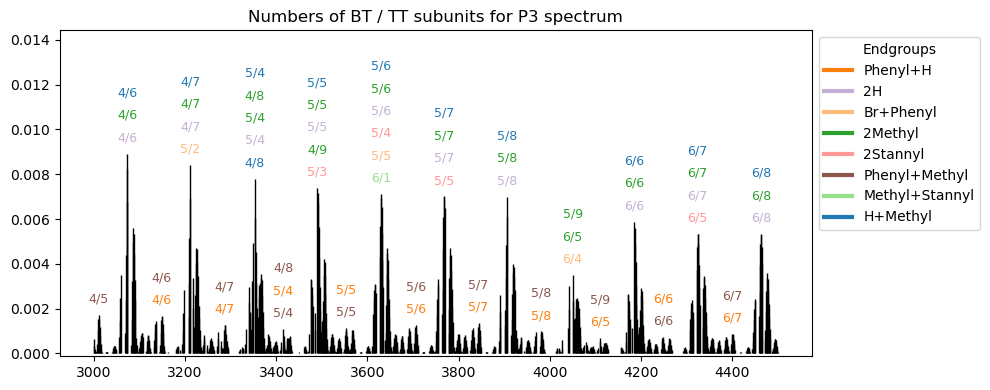

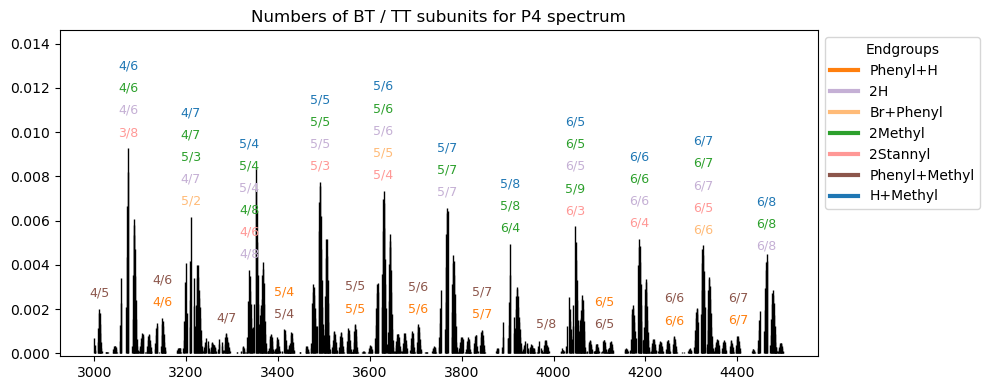

In [31]:
#########################################################
bt_tt_max_count_difference = 10
#########################################################
pbttt_min_mz=3000
pbttt_max_mz=4500

paths = ['Data/P1_centroided.csv', 
         'Data/P2_centroided.csv', 
         'Data/P3_centroided.csv', 
         'Data/P4_centroided.csv',
                           ]
labels = ['P1', 'P2', 'P3', 'P4']

p_thr = 0.002 

output = polymers.parse_annotation_results(annotation_file_path = f'Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv', 
                                           polymer_info_path = f'Data/reference_spectra_max_diff_{bt_tt_max_count_difference}.csv', 
                                           centroided_spectra_paths = paths, 
                                           centroided_spectra_labels = labels)

proportions_all, polymer_spectra, endgroup_integer_coding, all_different_endgroups_parsed, bt_count, tt_count, masses, hc_types = output

for label in labels:
    proportions = proportions_all[label]
    polymer_spectrum = polymer_spectra[label]
    polymers.plot_annotations(proportions, 
                     polymer_spectrum, 
                     endgroup_integer_coding, 
                     all_different_endgroups_parsed, 
                     bt_count, 
                     tt_count, 
                     masses,
                     proportion_threshold = p_thr,
                     group_width = 20,
                     vertical_separation = 0.001,
                     )

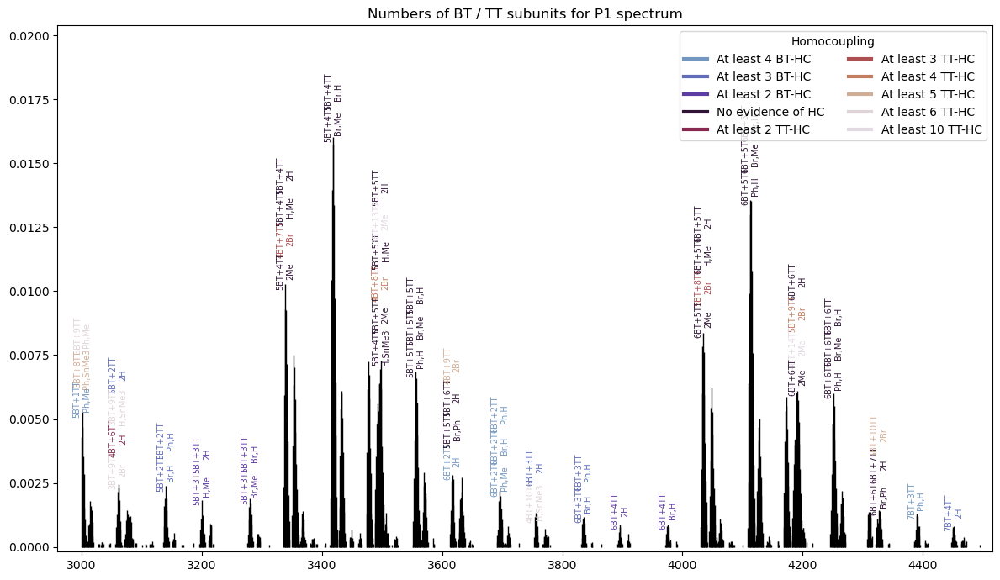

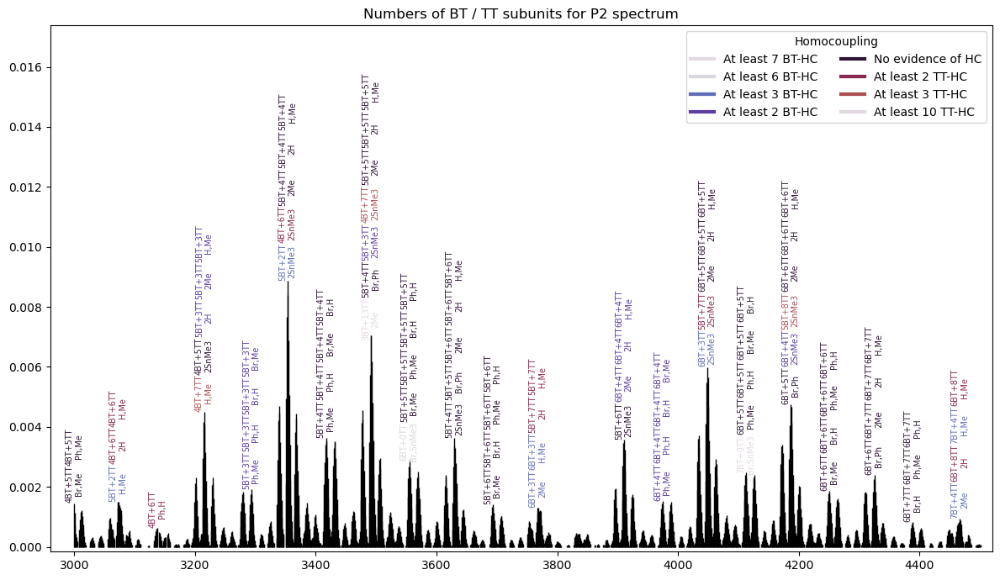

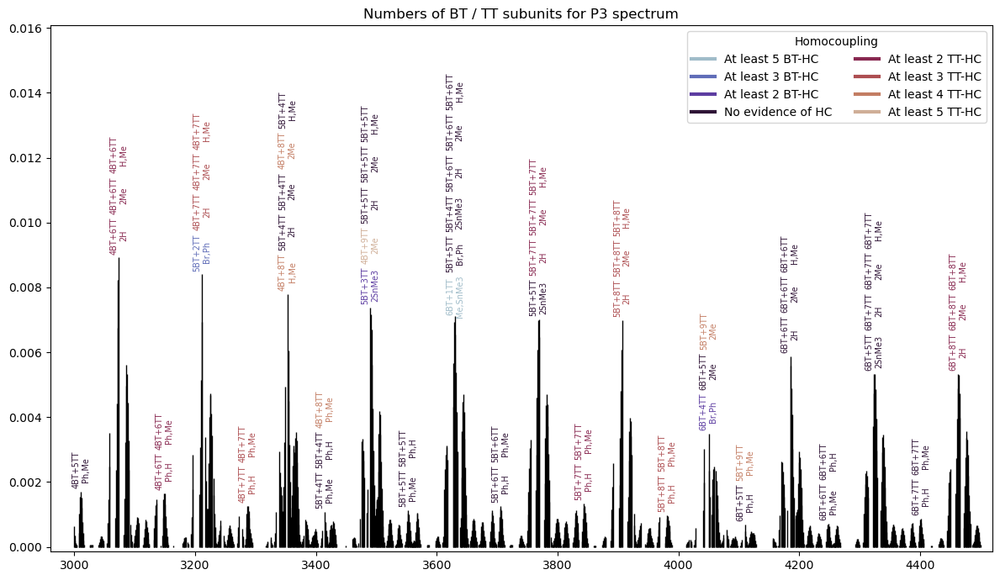

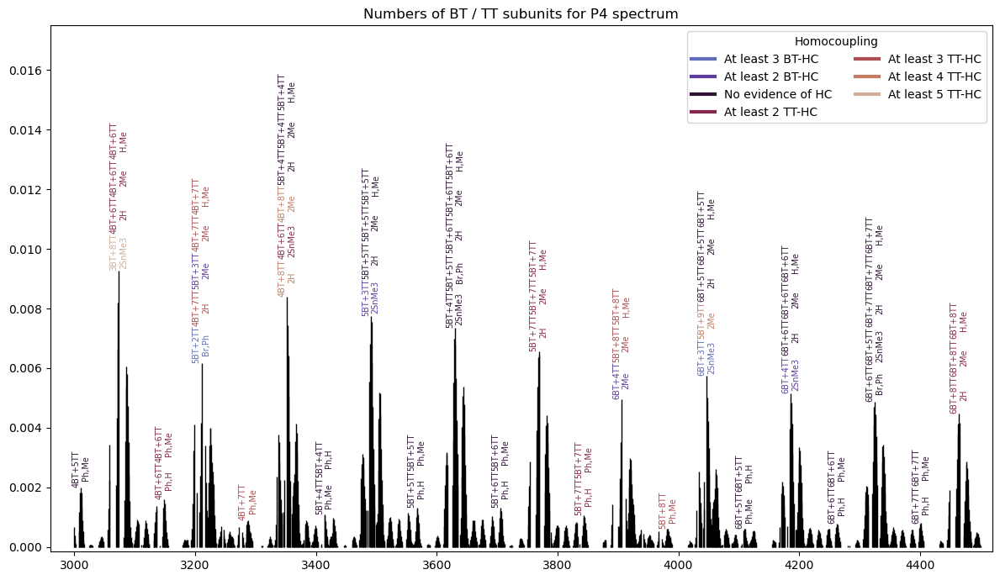

In [32]:
#########################################################
bt_tt_max_count_difference = 10
#########################################################
pbttt_min_mz=3000
pbttt_max_mz=4500

paths = ['Data/P1_centroided.csv', 
         'Data/P2_centroided.csv', 
         'Data/P3_centroided.csv', 
         'Data/P4_centroided.csv',
                           ]
labels = ['P1', 'P2', 'P3', 'P4']

p_thr = 0.002 

output = polymers.parse_annotation_results(annotation_file_path = f'Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv', 
                                           polymer_info_path = f'Data/reference_spectra_max_diff_{bt_tt_max_count_difference}.csv', 
                                           centroided_spectra_paths = paths, 
                                           centroided_spectra_labels = labels)

proportions_all, polymer_spectra, endgroup_integer_coding, all_different_endgroups_parsed, bt_count, tt_count, masses, hc_types = output

for label in labels:
    proportions = proportions_all[label]
    polymer_spectrum = polymer_spectra[label]
    polymers.plot_annotations_hc(proportions, 
                     polymer_spectrum, 
                     endgroup_integer_coding, 
                     all_different_endgroups_parsed, 
                     bt_count, 
                     tt_count, 
                     masses,
                     hc_types,
                     cmap = 'twilight',
                     proportion_threshold = p_thr,
                     group_width = 25,
                     vertical_separation = 0.00125,
                     endgroup_alt_names = endgroup_alt_names
                     )

## Max difference = 15

In [33]:
%%time
# deconvoling over whole interval and saving results to df
other_results = {}

#########################################################
bt_tt_max_count_difference = 15
#########################################################
pbttt_min_mz=3000
pbttt_max_mz=4500
expected_spectra = polymers.get_possible_compounds(heavier_monomer = bt, 
                                            lighter_monomer = tt, end_groups = end_groups,
                                            min_mz = pbttt_min_mz, 
                                            max_mz = pbttt_max_mz, 
                                            max_count_diff = bt_tt_max_count_difference, 
                                            verbose = False,
                                           )
costs = polymers.generate_costs_by_end_group(expected_spectra, end_groups_costs=end_groups_costs)

res = []

for s in spectra:
    full_results = pd.DataFrame(index = [q.label for q in expected_spectra])
    result = estimate_proportions(s._normalize(), expected_spectra, costs, MTD = 0.6, MTD_th = 0.7, MDC = 1e-3, solver=gurobi_solver)
    full_results[s.label] = result['proportions']
    ###################################################
    other_results[s.label] = {'proportions': result['proportions'],
                              'noise': result['noise'], 
                              'noise_in_theoretical': result['noise_in_theoretical'], 
                              'proportion_of_noise_in_theoretical': result['proportion_of_noise_in_theoretical'], 
                              'global_mass_axis': result['global_mass_axis'],
                             }
    ###################################################
    res.append(full_results)
    #save results
    if not os.path.exists(f"Results/max_diff_{bt_tt_max_count_difference}"):
        os.makedirs(f"Results/max_diff_{bt_tt_max_count_difference}")
    full_results.to_csv(f"Results/max_diff_{bt_tt_max_count_difference}/{s.label}_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv")



 Found 730 expected spectra


Computing chunks: 100%|██████████████████████████████████████████████████████████| 624/624 [00:00<00:00, 409520.53it/s]
Splitting the experimental spectrum into chunks: 599it [00:00, 74936.26it/s]
Deconvolving chunks:   0%|                                                                      | 0/17 [00:00<?, ?it/s]

Gurobi status= 2


Deconvolving chunks:   6%|███▋                                                          | 1/17 [00:07<02:04,  7.77s/it]

Gurobi status= 2


Deconvolving chunks:  12%|███████▎                                                      | 2/17 [00:33<04:36, 18.44s/it]

Gurobi status= 2


Deconvolving chunks:  18%|██████████▉                                                   | 3/17 [00:39<02:57, 12.67s/it]

Gurobi status= 2


Deconvolving chunks:  24%|██████████████▌                                               | 4/17 [00:49<02:29, 11.49s/it]

Gurobi status= 2


Deconvolving chunks:  29%|██████████████████▏                                           | 5/17 [01:21<03:48, 19.03s/it]

Gurobi status= 2


Deconvolving chunks:  35%|█████████████████████▉                                        | 6/17 [01:59<04:39, 25.44s/it]

Gurobi status= 2


Deconvolving chunks:  41%|█████████████████████████▌                                    | 7/17 [02:12<03:33, 21.40s/it]

Gurobi status= 2


Deconvolving chunks:  47%|█████████████████████████████▏                                | 8/17 [02:24<02:47, 18.56s/it]

Gurobi status= 2


Deconvolving chunks:  53%|████████████████████████████████▊                             | 9/17 [02:33<02:03, 15.41s/it]

Gurobi status= 2


Deconvolving chunks:  59%|███████████████████████████████████▉                         | 10/17 [02:38<01:25, 12.19s/it]

Gurobi status= 2


Deconvolving chunks:  65%|███████████████████████████████████████▍                     | 11/17 [02:45<01:03, 10.55s/it]

Gurobi status= 2


Deconvolving chunks:  71%|███████████████████████████████████████████                  | 12/17 [02:51<00:46,  9.33s/it]

Gurobi status= 2


Deconvolving chunks:  76%|██████████████████████████████████████████████▋              | 13/17 [04:09<02:00, 30.14s/it]

Gurobi status= 2


Deconvolving chunks:  82%|██████████████████████████████████████████████████▏          | 14/17 [04:27<01:19, 26.45s/it]

Gurobi status= 2


Deconvolving chunks:  88%|█████████████████████████████████████████████████████▊       | 15/17 [04:41<00:45, 22.53s/it]

Gurobi status= 2


Deconvolving chunks:  94%|█████████████████████████████████████████████████████████▍   | 16/17 [04:49<00:18, 18.25s/it]

Gurobi status= 2


Computing chunks: 100%|██████████████████████████████████████████████████████████████████████| 729/729 [00:00<?, ?it/s]
Splitting the experimental spectrum into chunks: 1269it [00:00, ?it/s]
Deconvolving chunks:   0%|                                                                      | 0/11 [00:00<?, ?it/s]

Gurobi status= 2


Deconvolving chunks:   9%|█████▋                                                        | 1/11 [00:06<01:02,  6.26s/it]

Gurobi status= 2


Deconvolving chunks:  18%|███████████▎                                                  | 2/11 [00:32<02:41, 17.94s/it]

Gurobi status= 2


Deconvolving chunks:  27%|████████████████▉                                             | 3/11 [01:00<03:00, 22.59s/it]

Gurobi status= 2


Deconvolving chunks:  36%|██████████████████████▌                                       | 4/11 [01:34<03:08, 26.97s/it]

Gurobi status= 2


Deconvolving chunks:  45%|████████████████████████████▏                                 | 5/11 [02:13<03:08, 31.37s/it]

Gurobi status= 2


Deconvolving chunks:  55%|█████████████████████████████████▊                            | 6/11 [02:56<02:56, 35.30s/it]

Gurobi status= 2


Deconvolving chunks:  64%|███████████████████████████████████████▍                      | 7/11 [03:35<02:26, 36.51s/it]

Gurobi status= 2


Deconvolving chunks:  73%|█████████████████████████████████████████████                 | 8/11 [04:12<01:50, 36.83s/it]

Gurobi status= 2


Deconvolving chunks:  82%|██████████████████████████████████████████████████▋           | 9/11 [06:22<02:11, 65.82s/it]

Gurobi status= 2


Deconvolving chunks:  91%|███████████████████████████████████████████████████████▍     | 10/11 [07:21<01:03, 63.84s/it]

Gurobi status= 2


Computing chunks: 100%|██████████████████████████████████████████████████████████████████████| 705/705 [00:00<?, ?it/s]
Splitting the experimental spectrum into chunks: 928it [00:00, ?it/s]
Deconvolving chunks:   0%|                                                                      | 0/12 [00:00<?, ?it/s]

Gurobi status= 2


Deconvolving chunks:   8%|█████▏                                                        | 1/12 [00:05<00:58,  5.36s/it]

Gurobi status= 2


Deconvolving chunks:  17%|██████████▎                                                   | 2/12 [00:32<02:59, 17.98s/it]

Gurobi status= 2


Deconvolving chunks:  25%|███████████████▌                                              | 3/12 [00:58<03:15, 21.67s/it]

Gurobi status= 2


Deconvolving chunks:  33%|████████████████████▋                                         | 4/12 [01:27<03:16, 24.52s/it]

Gurobi status= 2


Deconvolving chunks:  42%|█████████████████████████▊                                    | 5/12 [02:02<03:19, 28.57s/it]

Gurobi status= 2


Deconvolving chunks:  50%|███████████████████████████████                               | 6/12 [02:42<03:14, 32.35s/it]

Gurobi status= 2


Deconvolving chunks:  58%|████████████████████████████████████▏                         | 7/12 [03:20<02:50, 34.16s/it]

Gurobi status= 2


Deconvolving chunks:  67%|█████████████████████████████████████████▎                    | 8/12 [04:01<02:24, 36.22s/it]

Gurobi status= 2


Deconvolving chunks:  75%|█████████████████████████████████████████████▊               | 9/12 [09:02<05:57, 119.16s/it]

Gurobi status= 2


Deconvolving chunks:  83%|██████████████████████████████████████████████████▊          | 10/12 [09:29<03:01, 90.57s/it]

Gurobi status= 2


Deconvolving chunks:  92%|███████████████████████████████████████████████████████▉     | 11/12 [09:54<01:10, 70.61s/it]

Gurobi status= 2


Computing chunks: 100%|██████████████████████████████████████████████████████████| 708/708 [00:00<00:00, 548092.88it/s]
Splitting the experimental spectrum into chunks: 953it [00:00, 476875.65it/s]
Deconvolving chunks:   8%|█████▏                                                        | 1/12 [00:02<00:23,  2.14s/it]

Gurobi status= 2
Gurobi status= 2


Deconvolving chunks:  17%|██████████▎                                                   | 2/12 [00:14<01:24,  8.40s/it]

Gurobi status= 2


Deconvolving chunks:  25%|███████████████▌                                              | 3/12 [00:29<01:41, 11.33s/it]

Gurobi status= 2


Deconvolving chunks:  33%|████████████████████▋                                         | 4/12 [00:44<01:42, 12.87s/it]

Gurobi status= 2


Deconvolving chunks:  42%|█████████████████████████▊                                    | 5/12 [01:02<01:40, 14.42s/it]

Gurobi status= 2


Deconvolving chunks:  50%|███████████████████████████████                               | 6/12 [01:21<01:36, 16.00s/it]

Gurobi status= 2


Deconvolving chunks:  58%|████████████████████████████████████▏                         | 7/12 [01:38<01:22, 16.55s/it]

Gurobi status= 2


Deconvolving chunks:  67%|█████████████████████████████████████████▎                    | 8/12 [01:54<01:05, 16.34s/it]

Gurobi status= 2


Deconvolving chunks:  75%|██████████████████████████████████████████████▌               | 9/12 [02:12<00:50, 16.88s/it]

Gurobi status= 2


Deconvolving chunks:  83%|██████████████████████████████████████████████████▊          | 10/12 [02:35<00:37, 18.54s/it]

Gurobi status= 2


Deconvolving chunks:  92%|███████████████████████████████████████████████████████▉     | 11/12 [02:57<00:19, 19.68s/it]

Gurobi status= 2


Deconvolving chunks: 100%|█████████████████████████████████████████████████████████████| 12/12 [03:11<00:00, 15.93s/it]

Wall time: 26min 19s


In [34]:
sig_numbers = 3
for name in ['P1', 'P2', 'P3', 'P4']:
    print(name)
    print(f"All explained signal: {round(100*sum(other_results[name]['noise']) + 100*sum(other_results[name]['proportions']), sig_numbers)}")
    print(f"Signal in experimental: {round(100*sum(other_results[name]['proportions']), sig_numbers)}")
    print(f"Noise in experimental: {round(100*sum(other_results[name]['noise']), sig_numbers)}")
    print(f"Noise in theoretical: {round(100*sum(other_results[name]['noise_in_theoretical']), sig_numbers)}")
    print(f"Percentage of noise in theorethical: {round(100*other_results[name]['proportion_of_noise_in_theoretical'], sig_numbers)}")
    print(f"Number of polymers detected: {len([p for p in other_results[name]['proportions'] if p > 0])}")
    print("***************************************************")

P1
All explained signal: 100.0
Signal in experimental: 93.972
Noise in experimental: 6.028
Noise in theoretical: 8.314
Percentage of noise in theorethical: 8.314
Number of polymers detected: 103
***************************************************
P2
All explained signal: 100.0
Signal in experimental: 91.841
Noise in experimental: 8.159
Noise in theoretical: 3.783
Percentage of noise in theorethical: 3.783
Number of polymers detected: 186
***************************************************
P3
All explained signal: 100.0
Signal in experimental: 90.475
Noise in experimental: 9.525
Noise in theoretical: 14.738
Percentage of noise in theorethical: 14.738
Number of polymers detected: 125
***************************************************
P4
All explained signal: 100.0
Signal in experimental: 90.21
Noise in experimental: 9.79
Noise in theoretical: 11.134
Percentage of noise in theorethical: 11.134
Number of polymers detected: 132
***************************************************


Homocoupling in the 3000-4500 range of the P1 spectrum: 3.364116323719355
Minimal homocoupling in the 3000-4500 range of the P1 spectrum: 3.1720264255411386
***************************************************************************************************
Homocoupling in the 3000-4500 range of the P2 spectrum: 1.6430631302989545
Minimal homocoupling in the 3000-4500 range of the P2 spectrum: 1.251754009547915
***************************************************************************************************
Homocoupling in the 3000-4500 range of the P3 spectrum: 1.8128232401405235
Minimal homocoupling in the 3000-4500 range of the P3 spectrum: 2.145387984287351
***************************************************************************************************
Homocoupling in the 3000-4500 range of the P4 spectrum: 1.544435026954776
Minimal homocoupling in the 3000-4500 range of the P4 spectrum: 1.751452216192154
*************************************************************************

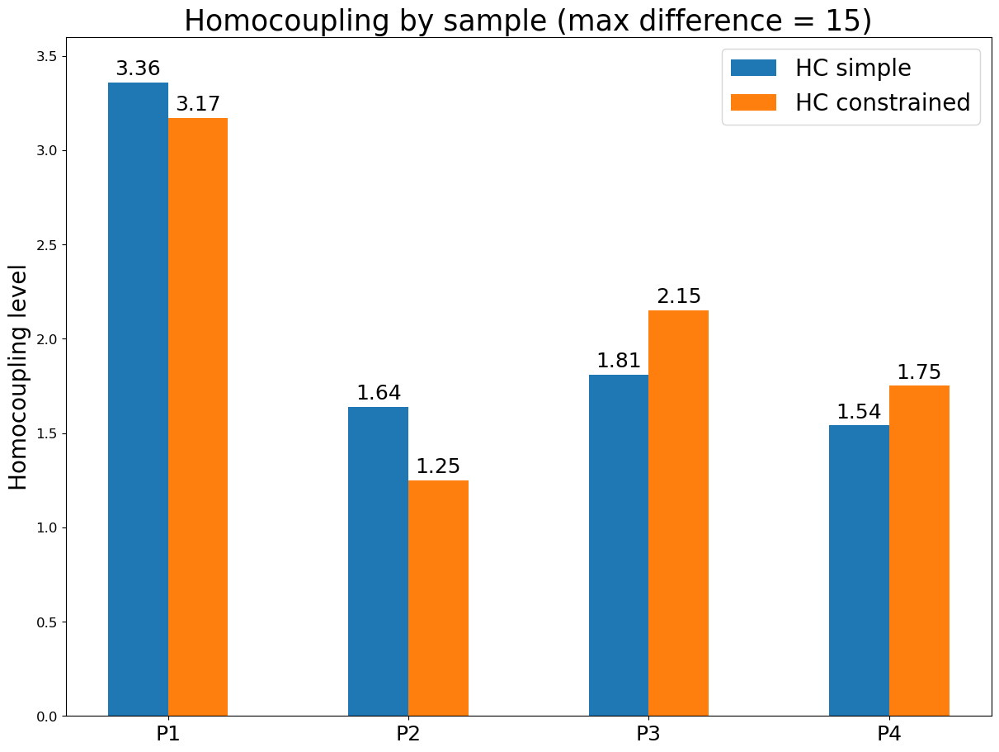

In [19]:
order = ['P1', 'P2', 'P3', 'P4']
#########################################################
bt_tt_max_count_difference = 15
#########################################################
pbttt_min_mz=3000
pbttt_max_mz=4500

res = []
for name in order:
    df = pd.read_csv(f"Results/max_diff_{bt_tt_max_count_difference}/{name}_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv", index_col=0)
    res.append(df)

res = [r.T for r in res]
res_spectras_c14 = pd.concat(res, axis=0)
res_spectras_c14.fillna(0, inplace=True)
res_spectras_c14 = res_spectras_c14.reindex(order)

res_spectras_c14.to_csv(f"Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv") 

# Homocoupling
names = []
hc = []
for ind in res_spectras_c14.index:
    df = res_spectras_c14.loc[[ind]]
    homocoupling = polymers.estimate_homocoupling(df)
    print(f"Homocoupling in the {pbttt_min_mz}-{pbttt_max_mz} range of the {df.index.item()} spectrum: {homocoupling}")
    min_h, min_h_p, probs = polymers.estimate_minimal_homocoupling(df)
    print(f"Minimal homocoupling in the {pbttt_min_mz}-{pbttt_max_mz} range of the {df.index.item()} spectrum: {min_h_p}")
    print("***************************************************************************************************")
    hc.append([homocoupling, min_h_p])
    names.append(ind)

hc = np.array(hc).round(2)

hc_measures = {
  "HC simple": hc[:, 0],
  "HC constrained": hc[:, 1]
}

x = np.arange(len(names))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(figsize=(12, 9), constrained_layout=True)

for attribute, measurement in hc_measures.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3, fontsize=18)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel('Homocoupling level', fontsize=20)
ax.set_title(f'Homocoupling by sample (max difference = {bt_tt_max_count_difference})', fontsize=25)
ax.set_xticks(x + width/2, names, fontsize=18)
ax.legend(loc='upper right', fontsize=20) #, ncols=2)
ax.set_ylim(0, 3.6)
plt.show()

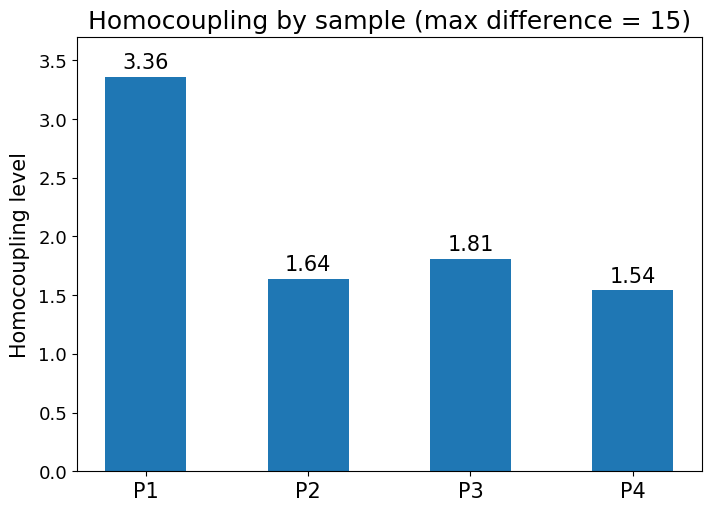

In [21]:
x = np.arange(len(names))  # the label locations
width = 0.5  # the width of the bars

fig, ax = plt.subplots(figsize=(7, 5), constrained_layout=True)

rects = ax.bar(x, hc[:, 0], width, label="HC simple")
ax.bar_label(rects, padding=3, fontsize=15)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.tick_params(axis='y', labelsize=13)
ax.set_ylabel('Homocoupling level', fontsize=15, labelpad=6)
ax.set_title(f'Homocoupling by sample (max difference = {bt_tt_max_count_difference})', fontsize=18)
ax.set_xticks(x, names, fontsize=15)
# ax.legend(loc='upper right', fontsize=20) #, ncols=2)
ax.set_ylim(0, 3.7)
plt.show()

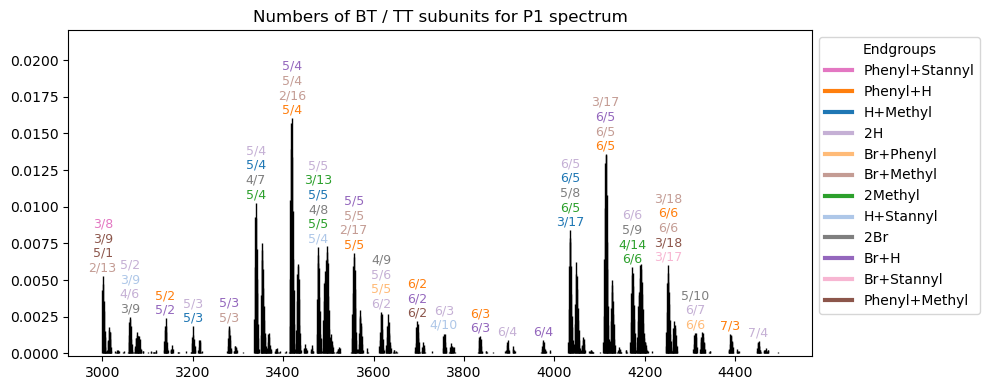

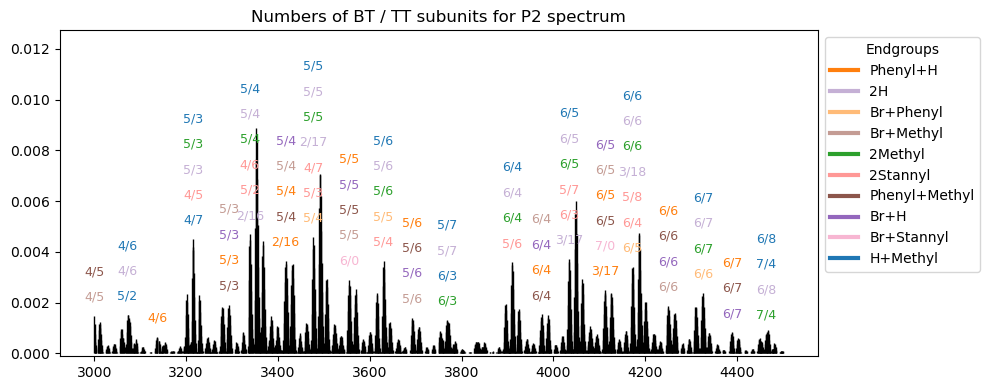

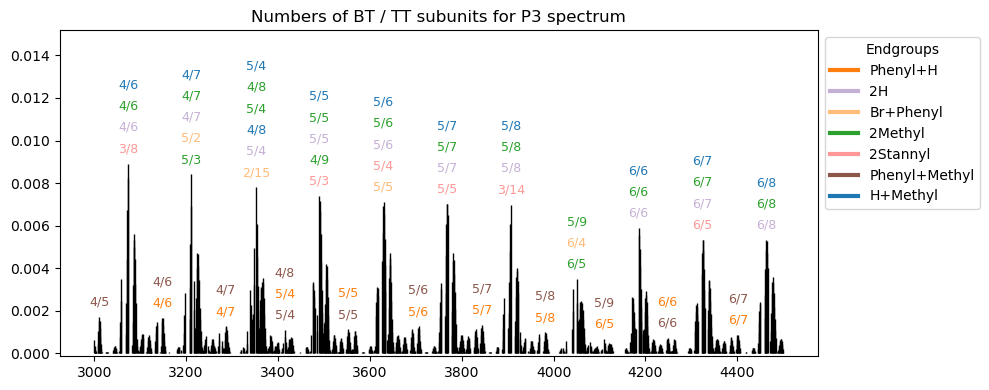

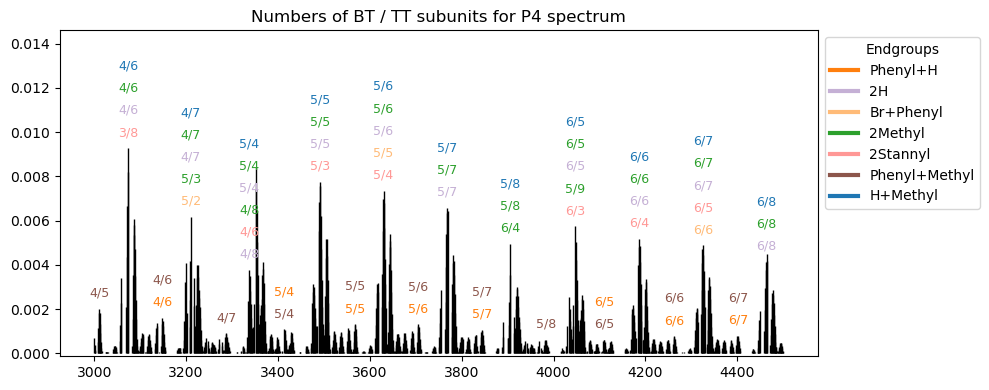

In [42]:
#########################################################
bt_tt_max_count_difference = 15
#########################################################
pbttt_min_mz=3000
pbttt_max_mz=4500

paths = ['Data/P1_centroided.csv', 
         'Data/P2_centroided.csv', 
         'Data/P3_centroided.csv', 
         'Data/P4_centroided.csv',
                           ]
labels = ['P1', 'P2', 'P3', 'P4']

p_thr = 0.002 

output = polymers.parse_annotation_results(annotation_file_path = f'Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv', 
                                           polymer_info_path = f'Data/reference_spectra_max_diff_{bt_tt_max_count_difference}.csv', 
                                           centroided_spectra_paths = paths, 
                                           centroided_spectra_labels = labels)

proportions_all, polymer_spectra, endgroup_integer_coding, all_different_endgroups_parsed, bt_count, tt_count, masses, hc_types = output

for label in labels:
    proportions = proportions_all[label]
    polymer_spectrum = polymer_spectra[label]
    polymers.plot_annotations(proportions, 
                     polymer_spectrum, 
                     endgroup_integer_coding, 
                     all_different_endgroups_parsed, 
                     bt_count, 
                     tt_count, 
                     masses,
                     proportion_threshold = p_thr,
                     group_width = 20,
                     vertical_separation = 0.001,
                     )

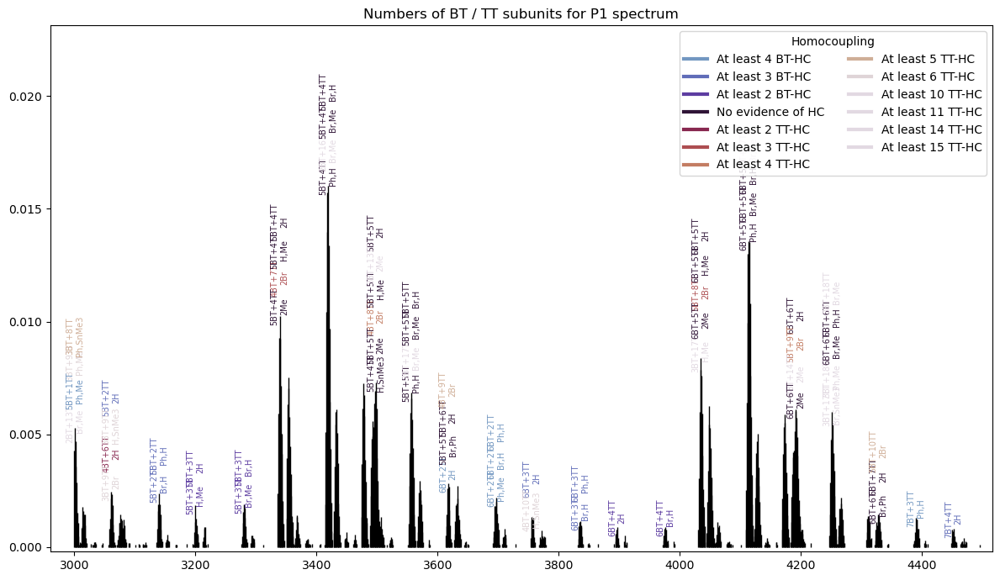

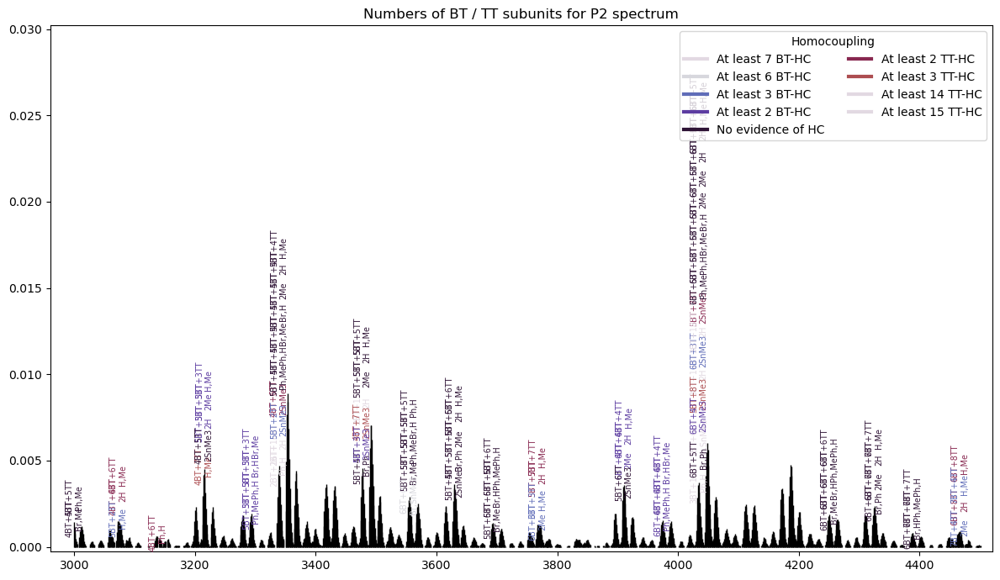

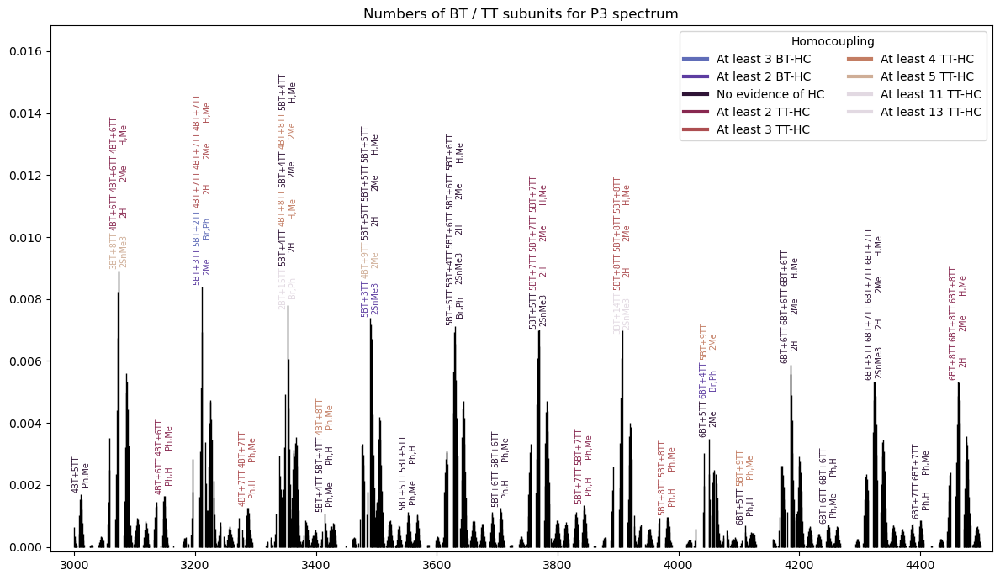

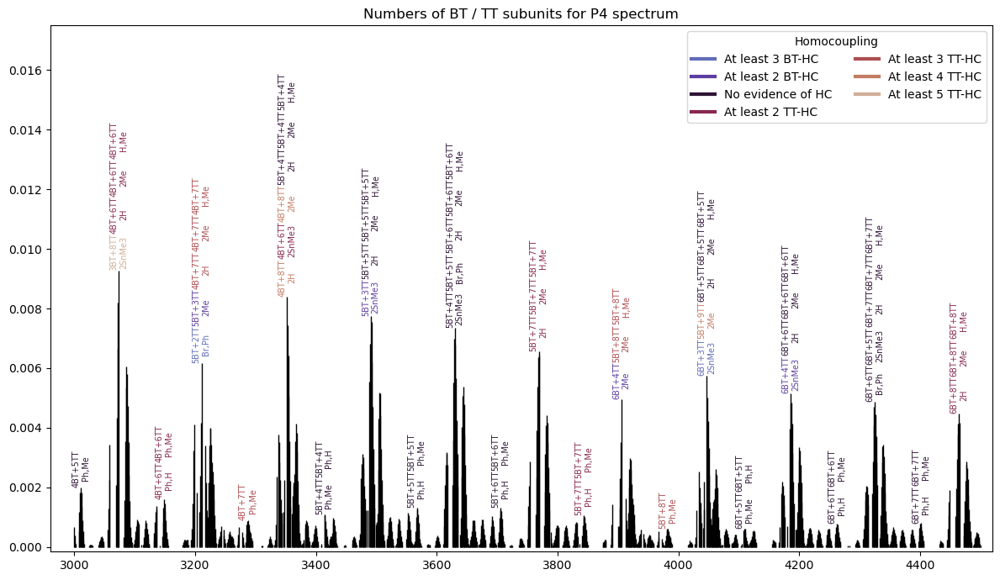

In [43]:
#########################################################
bt_tt_max_count_difference = 15
#########################################################
pbttt_min_mz=3000
pbttt_max_mz=4500

paths = ['Data/P1_centroided.csv', 
         'Data/P2_centroided.csv', 
         'Data/P3_centroided.csv', 
         'Data/P4_centroided.csv',
                           ]
labels = ['P1', 'P2', 'P3', 'P4']

p_thr = 0.002 

output = polymers.parse_annotation_results(annotation_file_path = f'Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv', 
                                           polymer_info_path = f'Data/reference_spectra_max_diff_{bt_tt_max_count_difference}.csv', 
                                           centroided_spectra_paths = paths, 
                                           centroided_spectra_labels = labels)

proportions_all, polymer_spectra, endgroup_integer_coding, all_different_endgroups_parsed, bt_count, tt_count, masses, hc_types = output

for label in labels:
    proportions = proportions_all[label]
    polymer_spectrum = polymer_spectra[label]
    polymers.plot_annotations_hc(proportions, 
                     polymer_spectrum, 
                     endgroup_integer_coding, 
                     all_different_endgroups_parsed, 
                     bt_count, 
                     tt_count, 
                     masses,
                     hc_types,
                     cmap = 'twilight',
                     proportion_threshold = p_thr,
                     group_width = 25,
                     vertical_separation = 0.00125,
                     endgroup_alt_names = endgroup_alt_names
                     )

# Frequencies of `#TT-#BT`, `#BT`, `#TT`

### Old versions

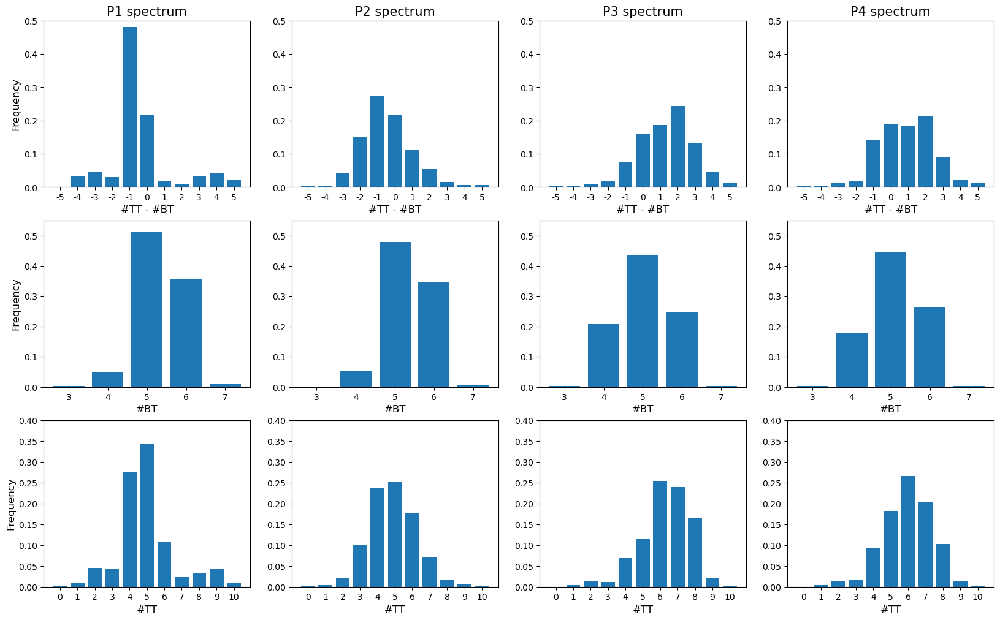

In [217]:
pbttt_min_mz=3000
pbttt_max_mz=4500
df_15 = pd.read_csv(f"Results/max_diff_15/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_15_full_results.csv", index_col=0)
df_10 = pd.read_csv(f"Results/max_diff_10/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_10_full_results.csv", index_col=0)
df_5 = pd.read_csv(f"Results/max_diff_5/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_5_full_results.csv", index_col=0)

monomer_diff_freq = {name:{5: None, 10: None, 15: None} for name in ['P1', 'P2', 'P3', 'P4']}
monomer_diff_max = {5: None, 10: None, 15: None}
monomer_diff_min = {5: None, 10: None, 15: None}

for df, max_diff in zip([df_5, df_10, df_15], [5, 10, 15]):
    diff_min = []
    diff_max = []
    for ind in df.index:
        monomer_diff_freq[ind][max_diff] = OrderedDict(sorted(polymers.monomer_difference_frequency(df.loc[[ind]]).items()))
        diff_min.append(min(monomer_diff_freq[ind][max_diff]))
        diff_max.append(max(monomer_diff_freq[ind][max_diff]))

    monomer_diff_min[max_diff] = min(diff_min)
    monomer_diff_max[max_diff] = max(diff_max)
    
    for ind in df.index: # fixing keys in dict
        freq = dict()
        for i in range(monomer_diff_min[max_diff], monomer_diff_max[max_diff]+1):
            if i not in monomer_diff_freq[ind][max_diff]:
                freq[i] = 0
            else:
                freq[i] = monomer_diff_freq[ind][max_diff][i]
                
        monomer_diff_freq[ind][max_diff] = freq

BT_freq = {name:{5: None, 10: None, 15: None} for name in names}
TT_freq = {name:{5: None, 10: None, 15: None} for name in names}
BT_max = {5: None, 10: None, 15: None}
BT_min = {5: None, 10: None, 15: None}
TT_max = {5: None, 10: None, 15: None}
TT_min = {5: None, 10: None, 15: None}

for df, max_diff in zip([df_5, df_10, df_15], [5, 10, 15]):
    bt_freq = {}
    tt_freq = {}
    max_bt = []
    min_bt = []
    max_tt = []
    min_tt = []
    for ind in df.index:
        bt_f, tt_f = polymers.monomer_frequency(df.loc[[ind]])

        BT_freq[ind][max_diff] = OrderedDict(sorted(bt_f.items()))
        max_bt.append(max(BT_freq[ind][max_diff]))
        min_bt.append(min(BT_freq[ind][max_diff]))
        TT_freq[ind][max_diff] = OrderedDict(sorted(tt_f.items()))
        max_tt.append(max(TT_freq[ind][max_diff]))
        min_tt.append(min(TT_freq[ind][max_diff]))

        BT_max[max_diff] = max(max_bt)
        BT_min[max_diff] = min(min_bt)
        TT_max[max_diff] = max(max_tt)
        TT_min[max_diff] = min(min_tt)
        
    for ind in df.index: # fixing keys in dict
        freq = dict()
        for i in range(BT_min[max_diff], BT_max[max_diff]+1):
            if i not in BT_freq[ind][max_diff]:
                freq[i] = 0
            else:
                freq[i] = BT_freq[ind][max_diff][i]     
        BT_freq[ind][max_diff] = freq
        
        freq = dict()
        for i in range(TT_min[max_diff], TT_max[max_diff]+1):
            if i not in TT_freq[ind][max_diff]:
                freq[i] = 0
            else:
                freq[i] = TT_freq[ind][max_diff][i]     
        TT_freq[ind][max_diff] = freq        
                
################################################################################################################
figure, axis = plt.subplots(3, 4, figsize = (20, 12), squeeze=True, constrained_layout = False)
max_diff = 5

for j, ind in enumerate(monomer_diff_freq):
    ticks = [i+0.5 for i in range(monomer_diff_min[max_diff], monomer_diff_max[max_diff])]
    labels = [i for i in range(monomer_diff_min[max_diff], monomer_diff_max[max_diff])]
        
    #plot
    axis[0, j].bar(range(len(monomer_diff_freq[ind][max_diff])), list(monomer_diff_freq[ind][max_diff].values()), tick_label=list(monomer_diff_freq[ind][max_diff].keys()))
    axis[0, j].set_xlabel('#TT - #BT', fontsize = 12)
    axis[0, j].set_ylim(0, 0.5)
    if j == 0: axis[0, j].set_ylabel('Frequency', fontsize = 12)
    axis[0, j].set_title(f'{ind} spectrum', fontsize = 15)

for j, ind in enumerate(BT_freq):
    ticks = [i+0.5 for i in range(BT_min[max_diff], BT_max[max_diff])]
    labels = [i for i in range(BT_min[max_diff], BT_max[max_diff])]
        
    #plot
    axis[1, j].bar(range(len(BT_freq[ind][max_diff])), list(BT_freq[ind][max_diff].values()), tick_label=list(BT_freq[ind][max_diff].keys()))
    axis[1, j].set_xlabel('#BT', fontsize = 12)
    axis[1, j].set_ylim(0, 0.55)
    if j == 0: axis[1, j].set_ylabel('Frequency', fontsize = 12)

for j, ind in enumerate(TT_freq):
    ticks = [i+0.5 for i in range(TT_min[max_diff], TT_max[max_diff])]
    labels = [i for i in range(TT_min[max_diff], TT_max[max_diff])]
        
    #plot
    axis[2, j].bar(range(len(TT_freq[ind][max_diff])), list(TT_freq[ind][max_diff].values()), tick_label=list(TT_freq[ind][max_diff].keys()))
    axis[2, j].set_xlabel('#TT', fontsize = 12)
    axis[2, j].set_ylim(0, 0.4)
    if j == 0: axis[2, j].set_ylabel('Frequency', fontsize = 12)

### New version

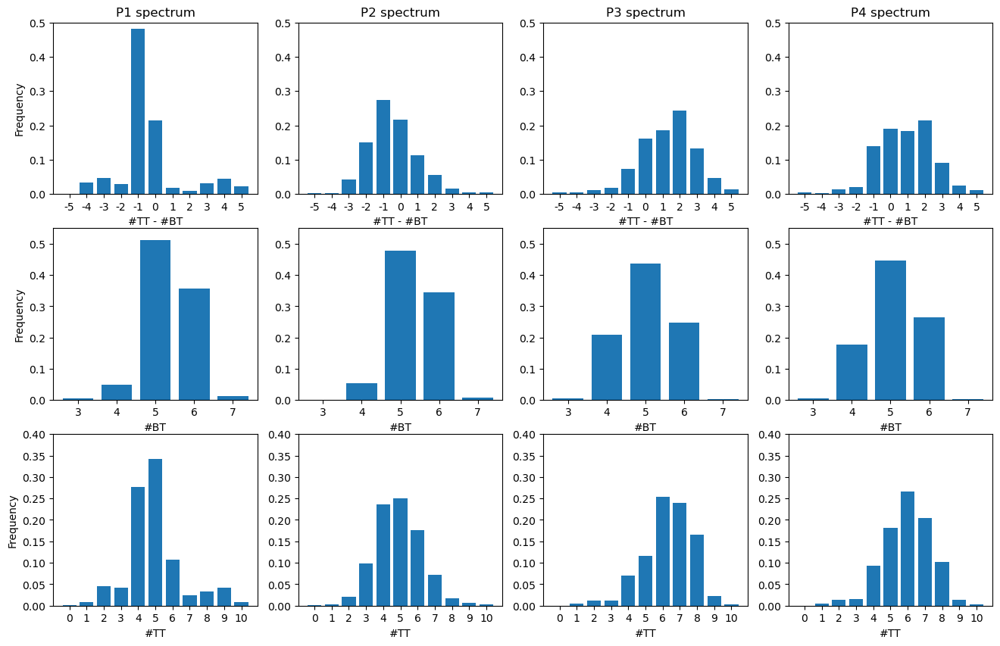

In [29]:
pbttt_min_mz=3000
pbttt_max_mz=4500

df = pd.read_csv(f"Results/max_diff_5/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_5_full_results.csv", index_col=0)

monomer_diff_freq = {}
diff_min = []
diff_max = []

for ind in df.index:
    monomer_diff_freq[ind] = OrderedDict(sorted(polymers.monomer_difference_frequency(df.loc[[ind]]).items()))
    diff_min.append(min(monomer_diff_freq[ind]))
    diff_max.append(max(monomer_diff_freq[ind]))

monomer_diff_min = min(diff_min)
monomer_diff_max = max(diff_max)
    
for ind in df.index: # fixing keys in dict
    freq = dict()
    for i in range(monomer_diff_min, monomer_diff_max+1):
        if i not in monomer_diff_freq[ind]: freq[i] = 0
        else: freq[i] = monomer_diff_freq[ind][i]          
    monomer_diff_freq[ind] = freq

BT_freq = {}
TT_freq = {}

max_bt = []
min_bt = []
max_tt = []
min_tt = []
for ind in df.index:
    bt_f, tt_f = polymers.monomer_frequency(df.loc[[ind]])
    BT_freq[ind] = OrderedDict(sorted(bt_f.items()))
    max_bt.append(max(BT_freq[ind]))
    min_bt.append(min(BT_freq[ind]))
    TT_freq[ind] = OrderedDict(sorted(tt_f.items()))
    max_tt.append(max(TT_freq[ind]))
    min_tt.append(min(TT_freq[ind]))

BT_max = max(max_bt)
BT_min = min(min_bt)
TT_max = max(max_tt)
TT_min = min(min_tt)
        
for ind in df.index: # fixing keys in dict
    freq = dict()
    for i in range(BT_min, BT_max+1):
        if i not in BT_freq[ind]: freq[i] = 0
        else: freq[i] = BT_freq[ind][i]     
    BT_freq[ind] = freq
        
    freq = dict()
    for i in range(TT_min, TT_max+1):
        if i not in TT_freq[ind]: freq[i] = 0
        else: freq[i] = TT_freq[ind][i]     
    TT_freq[ind] = freq 

################################################################################################################
figure, axis = plt.subplots(3, 4, figsize = (16, 10), squeeze=True, constrained_layout = False)

for j, ind in enumerate(monomer_diff_freq):
    ticks = [i+0.5 for i in range(monomer_diff_min, monomer_diff_max)]
    labels = [i for i in range(monomer_diff_min, monomer_diff_max)]
    axis[0, j].bar(range(len(monomer_diff_freq[ind])), list(monomer_diff_freq[ind].values()), tick_label=list(monomer_diff_freq[ind].keys()))
    axis[0, j].set_xlabel('#TT - #BT')#, fontsize = 12)
    axis[0, j].set_ylim(0, 0.5)
    axis[0, j].set_title(f'{ind} spectrum')#, fontsize = 15)
    if j == 0: axis[0, j].set_ylabel('Frequency')#, fontsize = 13)

for j, ind in enumerate(BT_freq):
    ticks = [i+0.5 for i in range(BT_min, BT_max)]
    labels = [i for i in range(BT_min, BT_max)]
    axis[1, j].bar(range(len(BT_freq[ind])), list(BT_freq[ind].values()), tick_label=list(BT_freq[ind].keys()))
    axis[1, j].set_xlabel('#BT')#, fontsize = 12)
    axis[1, j].set_ylim(0, 0.55)
    if j == 0: axis[1, j].set_ylabel('Frequency')#, fontsize = 13)
        
for j, ind in enumerate(TT_freq):
    ticks = [i+0.5 for i in range(TT_min, TT_max)]
    labels = [i for i in range(TT_min, TT_max)]
    axis[2, j].bar(range(len(TT_freq[ind])), list(TT_freq[ind].values()), tick_label=list(TT_freq[ind].keys()))
    axis[2, j].set_xlabel('#TT')#, fontsize = 12)
    axis[2, j].set_ylim(0, 0.4)
    if j == 0: axis[2, j].set_ylabel('Frequency')#, fontsize = 14)

### With colored end-groups

In [30]:
def monomer_difference_frequency_end_groups(df):
    diff_min = 0
    diff_max = 0
    
    df = df.T
    c = df.columns[0]
#   df = df[df[c]>0]
    df = df.reset_index()
    df = df.rename(columns={"index": "polymer"})
    #get end groups
    all_end_groups = []
    for polymer in df["polymer"]:
        polymer = polymer.split("+")
        if len(polymer)==3: end_groups = polymer[2]
        else: end_groups = "+".join(polymer[2:])
        all_end_groups.append(end_groups)
    all_end_groups = list(set(all_end_groups))
    
    monomer_difference = {end: {} for end in all_end_groups}
    for prob, polymer in zip(df[c], df["polymer"]):
        polymer = polymer.split("+")
        a_count = int(polymer[0][:(len(polymer[0]) - 2)]) 
        b_count = int(polymer[1][:(len(polymer[1]) - 2)])
        diff = b_count-a_count
        if len(polymer)==3: end_groups = polymer[2]
        else: end_groups = "+".join(polymer[2:])
        if diff in monomer_difference[end_groups]: monomer_difference[end_groups][diff] += prob
        else: monomer_difference[end_groups][diff] = prob
            
        #save min and max
        if diff < diff_min: diff_min = diff
        if diff > diff_max: diff_max = diff
        
    return monomer_difference, diff_min, diff_max

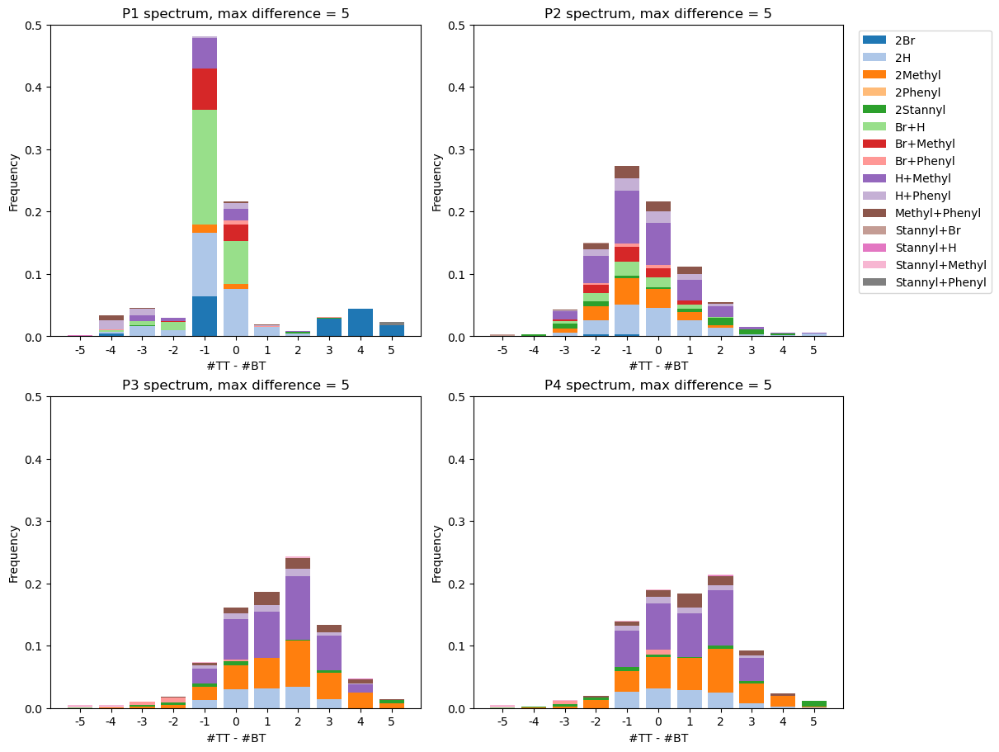

In [35]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500
df_5 = pd.read_csv(f"Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv", index_col=0)
#########################################################

monomer_diff_freq = {name: None for name in ['P1', 'P2', 'P3', 'P4']}

for ind in df_5.index:
    monomer_diff_min = []
    monomer_diff_max = []
    for ind in df_5.index:
        monomer_diff, diff_min, diff_max = monomer_difference_frequency_end_groups(df_5.loc[[ind]])
        monomer_diff_freq[ind] = OrderedDict(sorted(monomer_diff.items()))
        monomer_diff_min.append(diff_min)
        monomer_diff_max.append(diff_max)

    monomer_diff_min = min(monomer_diff_min)
    monomer_diff_max = max(monomer_diff_max)
    
    for ind in df_5.index: # fixing keys in dict
        for end in monomer_diff_freq[ind]:
            freq = dict()
            for i in range(monomer_diff_min, monomer_diff_max+1):
                if i not in monomer_diff_freq[ind][end]:
                    freq[i] = 0
                else:
                    freq[i] = monomer_diff_freq[ind][end][i]

            monomer_diff_freq[ind][end] = freq

##################################################################################################
#choose colormap 
#discrete
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.tab20.colors)
#continuous
# N = 15
# plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.nipy_spectral(np.linspace(0,1,N)))
##################################################################################################
figure, axis = plt.subplots(2, 2, figsize = (12, 9), squeeze=False, constrained_layout = True)

for i, ind in enumerate(monomer_diff_freq):
    ticks = [i+0.5 for i in range(monomer_diff_min, monomer_diff_max+1)]
    labels = [i for i in range(monomer_diff_min, monomer_diff_max+1)]
        
    #plot
    bottom = np.zeros(len(labels))
    for end in monomer_diff_freq[ind]:   
        axis[i//2, i%2].bar(labels, 
                            list(monomer_diff_freq[ind][end].values()), 
                            tick_label=labels, 
                            label=end, 
                            bottom=bottom,
                            )
        bottom += np.array(list(monomer_diff_freq[ind][end].values()))
    axis[i//2, i%2].set_xlabel('#TT - #BT')
    axis[i//2, i%2].set_ylabel('Frequency')
    axis[i//2, i%2].set_ylim(0, 0.5)
    axis[i//2, i%2].set_title(f'{ind} spectrum, max difference = {5}')
    if i==1:
        axis[i//2, i%2].legend(bbox_to_anchor=(1.025, 1.0), loc='upper left')

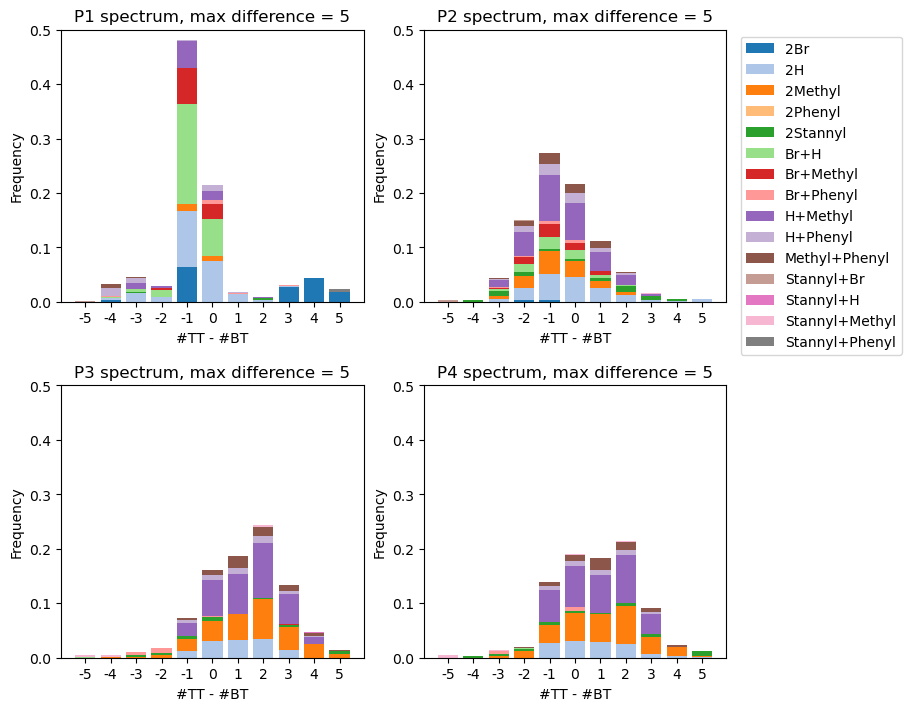

In [31]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500
df_5 = pd.read_csv(f"Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv", index_col=0)
#########################################################

monomer_diff_freq = {name: None for name in ['P1', 'P2', 'P3', 'P4']}

for ind in df_5.index:
    monomer_diff_min = []
    monomer_diff_max = []
    for ind in df_5.index:
        monomer_diff, diff_min, diff_max = monomer_difference_frequency_end_groups(df_5.loc[[ind]])
        monomer_diff_freq[ind] = OrderedDict(sorted(monomer_diff.items()))
        monomer_diff_min.append(diff_min)
        monomer_diff_max.append(diff_max)

    monomer_diff_min = min(monomer_diff_min)
    monomer_diff_max = max(monomer_diff_max)
    
    for ind in df_5.index: # fixing keys in dict
        for end in monomer_diff_freq[ind]:
            freq = dict()
            for i in range(monomer_diff_min, monomer_diff_max+1):
                if i not in monomer_diff_freq[ind][end]:
                    freq[i] = 0
                else:
                    freq[i] = monomer_diff_freq[ind][end][i]

            monomer_diff_freq[ind][end] = freq

##################################################################################################
#choose colormap 
#discrete
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.tab20.colors)
#continuous
# N = 15
# plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.nipy_spectral(np.linspace(0,1,N)))
##################################################################################################
figure, axis = plt.subplots(2, 2, figsize = (9, 7), squeeze=False, constrained_layout = True)

for i, ind in enumerate(monomer_diff_freq):
    ticks = [i+0.5 for i in range(monomer_diff_min, monomer_diff_max+1)]
    labels = [i for i in range(monomer_diff_min, monomer_diff_max+1)]
        
    #plot
    bottom = np.zeros(len(labels))
    for end in monomer_diff_freq[ind]:   
        axis[i//2, i%2].bar(labels, 
                            list(monomer_diff_freq[ind][end].values()), 
                            tick_label=labels, 
                            label=end, 
                            bottom=bottom,
                            )
        bottom += np.array(list(monomer_diff_freq[ind][end].values()))
    axis[i//2, i%2].set_xlabel('#TT - #BT')
    axis[i//2, i%2].set_ylabel('Frequency')
    axis[i//2, i%2].set_ylim(0, 0.5)
    axis[i//2, i%2].set_title(f'{ind} spectrum, max difference = {5}')
    if i==1:
        axis[i//2, i%2].legend(bbox_to_anchor=(1.025, 1.0), loc='upper left')

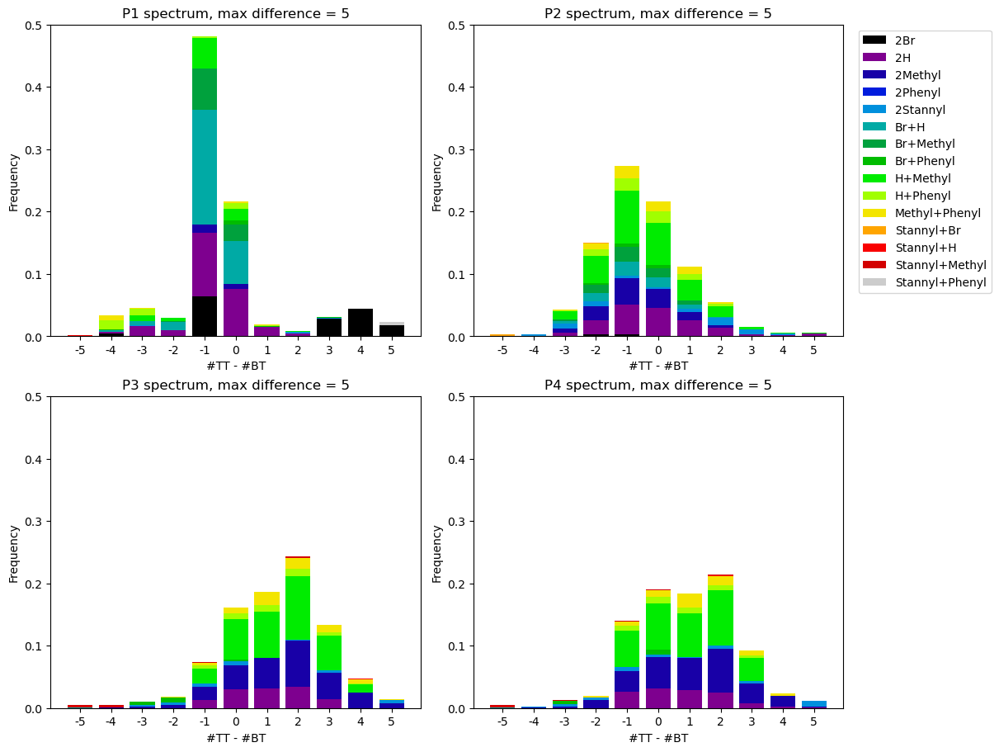

In [8]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500
df_5 = pd.read_csv(f"Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv", index_col=0)
#########################################################

monomer_diff_freq = {name: None for name in ['P1', 'P2', 'P3', 'P4']}

for ind in df_5.index:
    monomer_diff_min = []
    monomer_diff_max = []
    for ind in df_5.index:
        monomer_diff, diff_min, diff_max = monomer_difference_frequency_end_groups(df_5.loc[[ind]])
        monomer_diff_freq[ind] = OrderedDict(sorted(monomer_diff.items()))
        monomer_diff_min.append(diff_min)
        monomer_diff_max.append(diff_max)

    monomer_diff_min = min(monomer_diff_min)
    monomer_diff_max = max(monomer_diff_max)
    
    for ind in df_5.index: # fixing keys in dict
        for end in monomer_diff_freq[ind]:
            freq = dict()
            for i in range(monomer_diff_min, monomer_diff_max+1):
                if i not in monomer_diff_freq[ind][end]:
                    freq[i] = 0
                else:
                    freq[i] = monomer_diff_freq[ind][end][i]

            monomer_diff_freq[ind][end] = freq

##################################################################################################
#choose colormap 
# plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.Set3.colors)
#continuous
N = 15
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.nipy_spectral(np.linspace(0,1,N)))
##################################################################################################
figure, axis = plt.subplots(2, 2, figsize = (12, 9), squeeze=False, constrained_layout = True)

for i, ind in enumerate(monomer_diff_freq):
    ticks = [i+0.5 for i in range(monomer_diff_min, monomer_diff_max+1)]
    labels = [i for i in range(monomer_diff_min, monomer_diff_max+1)]
        
    #plot
    bottom = np.zeros(len(labels))
    for end in monomer_diff_freq[ind]:   
        axis[i//2, i%2].bar(labels, 
                            list(monomer_diff_freq[ind][end].values()), 
                            tick_label=labels, 
                            label=end, 
                            bottom=bottom,
                            )
        bottom += np.array(list(monomer_diff_freq[ind][end].values()))
    axis[i//2, i%2].set_xlabel('#TT - #BT')
    axis[i//2, i%2].set_ylabel('Frequency')
    axis[i//2, i%2].set_ylim(0, 0.5)
    axis[i//2, i%2].set_title(f'{ind} spectrum, max difference = {5}')
    if i==1:
        axis[i//2, i%2].legend(bbox_to_anchor=(1.025, 1.0), loc='upper left')

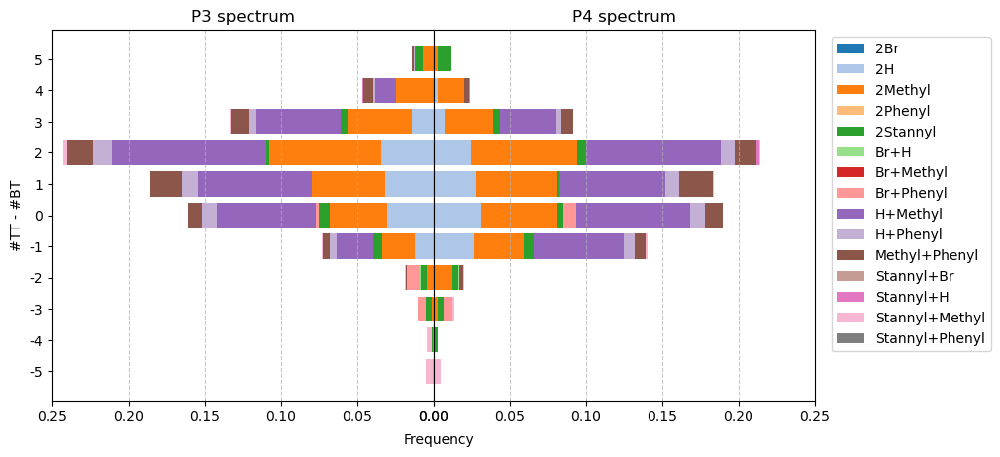

In [9]:
##################################################################################################
#choose colormap 
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.tab20.colors)
##################################################################################################
fig, axis = plt.subplots(figsize=(10,5), ncols=2, sharey=True)
fig.tight_layout()

for i, ind in enumerate(['P3', 'P4']):
    ticks = [i+0.5 for i in range(monomer_diff_min, monomer_diff_max+1)]
    labels = [i for i in range(monomer_diff_min, monomer_diff_max+1)]
        
    #plot
    bottom = np.zeros(len(labels))
    for end in monomer_diff_freq[ind]:
        values = list(monomer_diff_freq[ind][end].values())
        axis[i].barh(np.arange(len(labels)),
                        values,
                        left=bottom,
                        align='center',
                        label=end, 
                       )
        bottom += np.array(values)
    axis[i].set_title(f'{ind} spectrum')
    axis[i].set_xlim(0, 0.25)
    axis[i].grid(axis = 'x', linestyle = '--', alpha=0.7)
    
    if i==0: 
        axis[i].invert_xaxis() 
        axis[i].set_ylabel('#TT - #BT')
        axis[i].set(yticks=np.arange(len(labels)), 
                    yticklabels=labels)
        axis[i].yaxis.tick_left()
    
    if i==1:
        axis[i].tick_params(axis='y',
                            left=False)
        
        axis[i].legend(bbox_to_anchor=(1.025, 1.0), loc='upper left')

fig.text(0.57, 0.02, 'Frequency', ha='center', va='center')

plt.subplots_adjust(wspace=0, top=0.85, bottom=0.1, left=0.18, right=0.95)

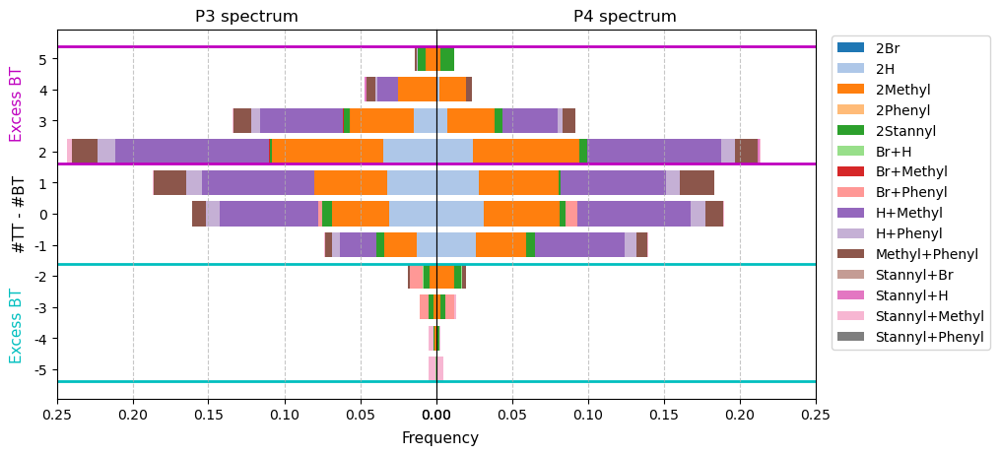

In [156]:
##################################################################################################
#choose colormap 
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.tab20.colors)
##################################################################################################
fig, axis = plt.subplots(figsize=(10,5), ncols=2, sharey=True)
fig.tight_layout()

for i, ind in enumerate(['P3', 'P4']):
    ticks = [i+0.5 for i in range(monomer_diff_min, monomer_diff_max+1)]
    labels = [i for i in range(monomer_diff_min, monomer_diff_max+1)]
    # labels = [abs(i) for i in range(monomer_diff_min, monomer_diff_max+1)] # second version, only positive values
        
    #plot
    bottom = np.zeros(len(labels))
    for end in monomer_diff_freq[ind]:
        values = list(monomer_diff_freq[ind][end].values())
        axis[i].barh(np.arange(len(labels)),
                        values,
                        left=bottom,
                        align='center',
                        label=end, 
                       )
        bottom += np.array(values)
    axis[i].set_title(f'{ind} spectrum')
    axis[i].set_xlim(0, 0.25)
    axis[i].grid(axis = 'x', linestyle = '--', alpha=0.7)

    #get width of bars
    # widths = [p.get_height() for p in axis[i].patches]
    # print(widths)
    
    if i==0: 
        axis[i].invert_xaxis() 
        axis[i].set_ylabel('#TT - #BT', position=(1.0, 1.0), fontsize=11)
        axis[i].set(yticks=np.arange(len(labels)), 
                    yticklabels=labels)
        axis[i].yaxis.tick_left()
    
    if i==1:
        axis[i].tick_params(axis='y',
                            left=False)
        axis[i].legend(bbox_to_anchor=(1.025, 1.0), loc='upper left')

# patch for excess monomers
from matplotlib.path import Path 
from matplotlib.patches import PathPatch, Polygon

#excess #BT
edge_c = "m"
path = Path([[0, 6.6], [0.25, 6.6]]) 
axis[0].add_patch(PathPatch(path, facecolor ='none', edgecolor = edge_c, lw=2)) 
axis[1].add_patch(PathPatch(path, facecolor ='none', edgecolor = edge_c, lw=2)) 
path = Path([[0, 10.4], [0.25, 10.4]]) 
axis[0].add_patch(PathPatch(path, facecolor ='none', edgecolor = edge_c, lw=2)) 
axis[1].add_patch(PathPatch(path, facecolor ='none', edgecolor = edge_c, lw=2))
# y axis title
fig.text(0.14, 0.7, 'Excess BT', rotation = 'vertical', ha='center', va='center', c=edge_c, fontsize=11)

#excess #TT
# edge_c = "chartreuse"
edge_c = "c"
path = Path([[0, -0.4], [0.25, -0.4]]) 
axis[0].add_patch(PathPatch(path, facecolor ='none', edgecolor = edge_c, lw=2)) 
axis[1].add_patch(PathPatch(path, facecolor ='none', edgecolor = edge_c, lw=2)) 
path = Path([[0, 3.4], [0.25, 3.4]]) 
axis[0].add_patch(PathPatch(path, facecolor ='none', edgecolor = edge_c, lw=2)) 
axis[1].add_patch(PathPatch(path, facecolor ='none', edgecolor = edge_c, lw=2))  
# y axis title
fig.text(0.14, 0.25, 'Excess BT', rotation = 'vertical', ha='center', va='center', c=edge_c, fontsize=11)

#x axis title
fig.text(0.57, 0.02, 'Frequency', ha='center', va='center', fontsize=11)

plt.subplots_adjust(wspace=0, top=0.85, bottom=0.1, left=0.18, right=0.95)

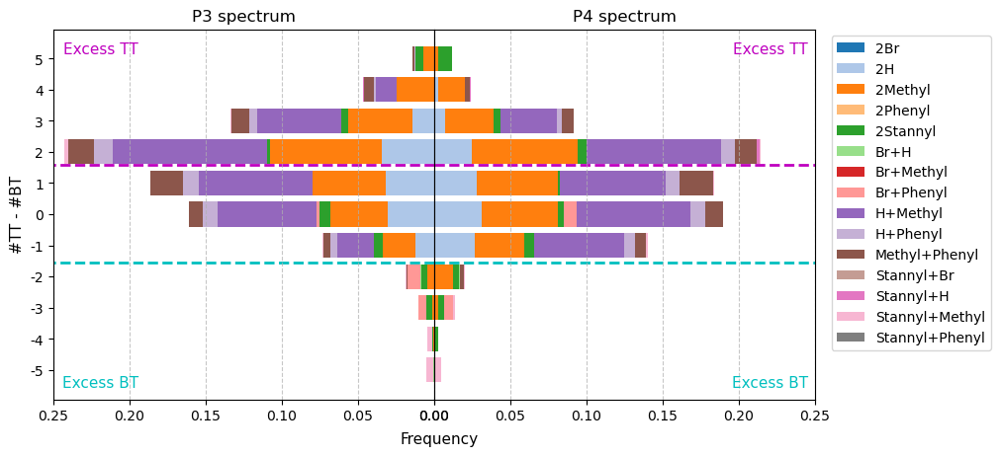

In [41]:
##################################################################################################
#choose colormap 
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.tab20.colors)
##################################################################################################
fig, axis = plt.subplots(figsize=(10,5), ncols=2, sharey=True)
fig.tight_layout()

for i, ind in enumerate(['P3', 'P4']):
    ticks = [i+0.5 for i in range(monomer_diff_min, monomer_diff_max+1)]
    labels = [i for i in range(monomer_diff_min, monomer_diff_max+1)]
    # labels = [abs(i) for i in range(monomer_diff_min, monomer_diff_max+1)] # second version, only positive values
        
    #plot
    bottom = np.zeros(len(labels))
    for end in monomer_diff_freq[ind]:
        values = list(monomer_diff_freq[ind][end].values())
        axis[i].barh(np.arange(len(labels)),
                        values,
                        left=bottom,
                        align='center',
                        label=end, 
                       )
        bottom += np.array(values)
    axis[i].set_title(f'{ind} spectrum')
    axis[i].set_xlim(0, 0.25)
    axis[i].grid(axis = 'x', linestyle = '--', alpha=0.7)

    #get width of bars
    # widths = [p.get_height() for p in axis[i].patches]
    # print(widths)
    
    if i==0: 
        axis[i].invert_xaxis() 
        axis[i].set_ylabel('#TT - #BT', position=(1.0, 1.0), fontsize=11)
        axis[i].set(yticks=np.arange(len(labels)), 
                    yticklabels=labels)
        axis[i].yaxis.tick_left()
    
    if i==1:
        axis[i].tick_params(axis='y',
                            left=False)
        axis[i].legend(bbox_to_anchor=(1.025, 1.0), loc='upper left')

# patch for excess monomers
from matplotlib.path import Path 
from matplotlib.patches import PathPatch, Polygon

#excess #TT
edge_c = "m"
path = Path([[0, 6.57], [0.25, 6.57]]) 
axis[0].add_patch(PathPatch(path, facecolor ='none', edgecolor = edge_c, lw=2, ls='--')) 
axis[1].add_patch(PathPatch(path, facecolor ='none', edgecolor = edge_c, lw=2, ls='--')) 
# y axis title
fig.text(0.228, 0.81, 'Excess TT', rotation = 0, ha='center', va='center', c=edge_c, fontsize=11)
fig.text(0.905, 0.81, 'Excess TT', rotation = 0, ha='center', va='center', c=edge_c, fontsize=11)

#excess #BT
edge_c = "c"
path = Path([[0, 3.44], [0.25, 3.44]]) 
axis[0].add_patch(PathPatch(path, facecolor ='none', edgecolor = edge_c, lw=2, ls='--')) 
axis[1].add_patch(PathPatch(path, facecolor ='none', edgecolor = edge_c, lw=2, ls='--'))  
# y axis title
fig.text(0.228, 0.133, 'Excess BT', rotation=0, ha='center', va='center', c=edge_c, fontsize=11)
fig.text(0.905, 0.133, 'Excess BT', rotation=0, ha='center', va='center', c=edge_c, fontsize=11)

#x axis title
fig.text(0.57, 0.02, 'Frequency', ha='center', va='center', fontsize=11)

plt.subplots_adjust(wspace=0, top=0.85, bottom=0.1, left=0.18, right=0.95)

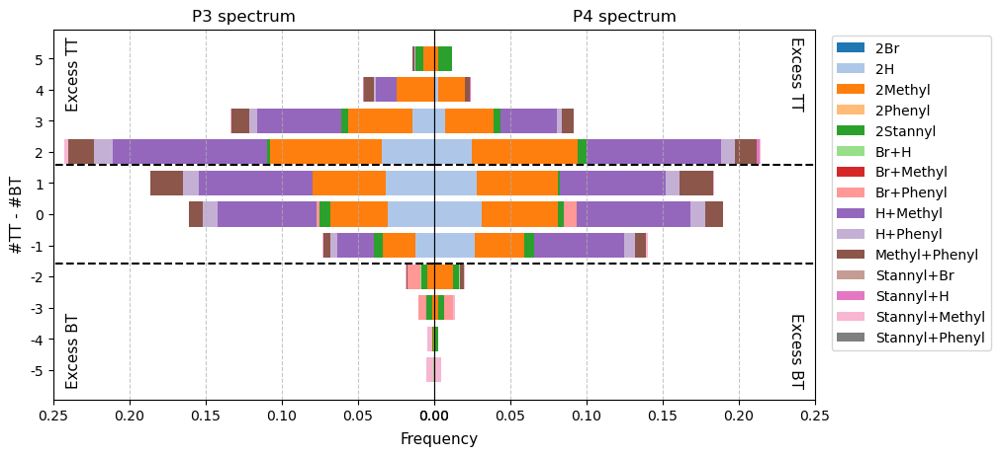

In [154]:
##################################################################################################
#choose colormap 
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.tab20.colors)
##################################################################################################
fig, axis = plt.subplots(figsize=(10,5), ncols=2, sharey=True)
fig.tight_layout()

for i, ind in enumerate(['P3', 'P4']):
    ticks = [i+0.5 for i in range(monomer_diff_min, monomer_diff_max+1)]
    labels = [i for i in range(monomer_diff_min, monomer_diff_max+1)]
    # labels = [abs(i) for i in range(monomer_diff_min, monomer_diff_max+1)] # second version, only positive values
        
    #plot
    bottom = np.zeros(len(labels))
    for end in monomer_diff_freq[ind]:
        values = list(monomer_diff_freq[ind][end].values())
        axis[i].barh(np.arange(len(labels)),
                        values,
                        left=bottom,
                        align='center',
                        label=end, 
                       )
        bottom += np.array(values)
    axis[i].set_title(f'{ind} spectrum')
    axis[i].set_xlim(0, 0.25)
    axis[i].grid(axis = 'x', linestyle = '--', alpha=0.7)

    #get width of bars
    # widths = [p.get_height() for p in axis[i].patches]
    # print(widths)
    
    if i==0: 
        axis[i].invert_xaxis() 
        axis[i].set_ylabel('#TT - #BT', position=(1.0, 1.0), fontsize=11)
        axis[i].set(yticks=np.arange(len(labels)), 
                    yticklabels=labels)
        axis[i].yaxis.tick_left()
    
    if i==1:
        axis[i].tick_params(axis='y',
                            left=False)
        axis[i].legend(bbox_to_anchor=(1.025, 1.0), loc='upper left')

# patch for excess monomers
from matplotlib.path import Path 
from matplotlib.patches import PathPatch, Polygon

#excess #BT
edge_c = "k"
path = Path([[0, 6.58], [0.25, 6.58]]) 
axis[0].add_patch(PathPatch(path, facecolor ='none', edgecolor = edge_c, lw=1.5, ls='--')) 
axis[1].add_patch(PathPatch(path, facecolor ='none', edgecolor = edge_c, lw=1.5, ls='--')) 
# y axis title
fig.text(0.2, 0.76, 'Excess TT', rotation = 90, ha='center', va='center', c=edge_c, fontsize=11)
fig.text(0.93, 0.76, 'Excess TT', rotation = 270, ha='center', va='center', c=edge_c, fontsize=11)

#excess #TT
# edge_c = "chartreuse"
edge_c = "k"
path = Path([[0, 3.42], [0.25, 3.42]]) 
axis[0].add_patch(PathPatch(path, facecolor ='none', edgecolor = edge_c, lw=1.5, ls='--')) 
axis[1].add_patch(PathPatch(path, facecolor ='none', edgecolor = edge_c, lw=1.5, ls='--'))  
# y axis title
fig.text(0.2, 0.2, 'Excess BT', rotation =90, ha='center', va='center', c=edge_c, fontsize=11)
fig.text(0.93, 0.2, 'Excess BT', rotation = 270, ha='center', va='center', c=edge_c, fontsize=11)

#x axis title
fig.text(0.57, 0.02, 'Frequency', ha='center', va='center', fontsize=11)

plt.subplots_adjust(wspace=0, top=0.85, bottom=0.1, left=0.18, right=0.95)

# Number of different polymers' cores and end-groups

## Cores

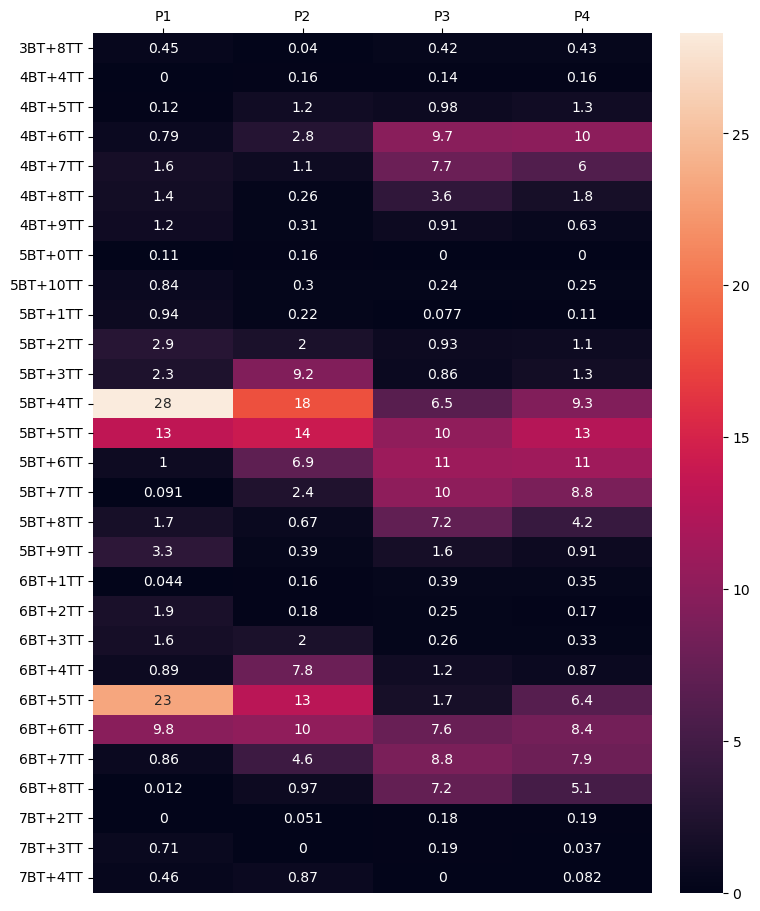

In [88]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500
df_5 = pd.read_csv(f"Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv", index_col=0)
#########################################################

cores = set()
for polymer in df_5.columns:
    core = polymer.split('+')
    core = core[0]+"+"+core[1]
    cores.add(core)
cores = list(cores)
cores.sort()

df_5_cores = pd.DataFrame(0, columns=df_5.index, index=cores)
for polymer in df_5.columns:
    core = polymer.split('+')
    core = core[0]+"+"+core[1]
    for sample in df_5.index:
        df_5_cores.loc[core, sample] += df_5.loc[sample, polymer]

df_5_cores.columns = ['P1', 'P2', 'P3', 'P4']
df_5_cores.to_csv(f"./Results/all_c14_spectras_5_polymer_cores.csv")
#normalize 
for col in df_5_cores.columns:
    df_5_cores[col] /= df_5_cores.sum()[col]
# as percentages
df_5_cores = 100*df_5_cores
df_5_cores.to_csv(f"./Results/all_c14_spectras_5_polymer_cores_normalized.csv")

bt_counts = set()
tt_counts = set()
for core in df_5_cores.index:
    core = core.split('+')
    bt_counts.add(core[0])
    tt_counts.add(core[1])
bt_counts = list(bt_counts)
bt_counts.sort()
tt_counts = list(tt_counts)
tt_counts.sort(key = lambda x:int(x[:-2]), reverse=True)

# displaying dataframe as an heatmap 
# with diverging colourmap as virdis
# df_5_cores.style.background_gradient(cmap ='viridis')\
#         .set_properties(**{'font-size': '13px'})

fig, ax = plt.subplots(figsize=(7.5, 9), constrained_layout=True)
ax = sns.heatmap(df_5_cores, annot=True)
ax.set(xlabel="", ylabel="")
ax.xaxis.tick_top()

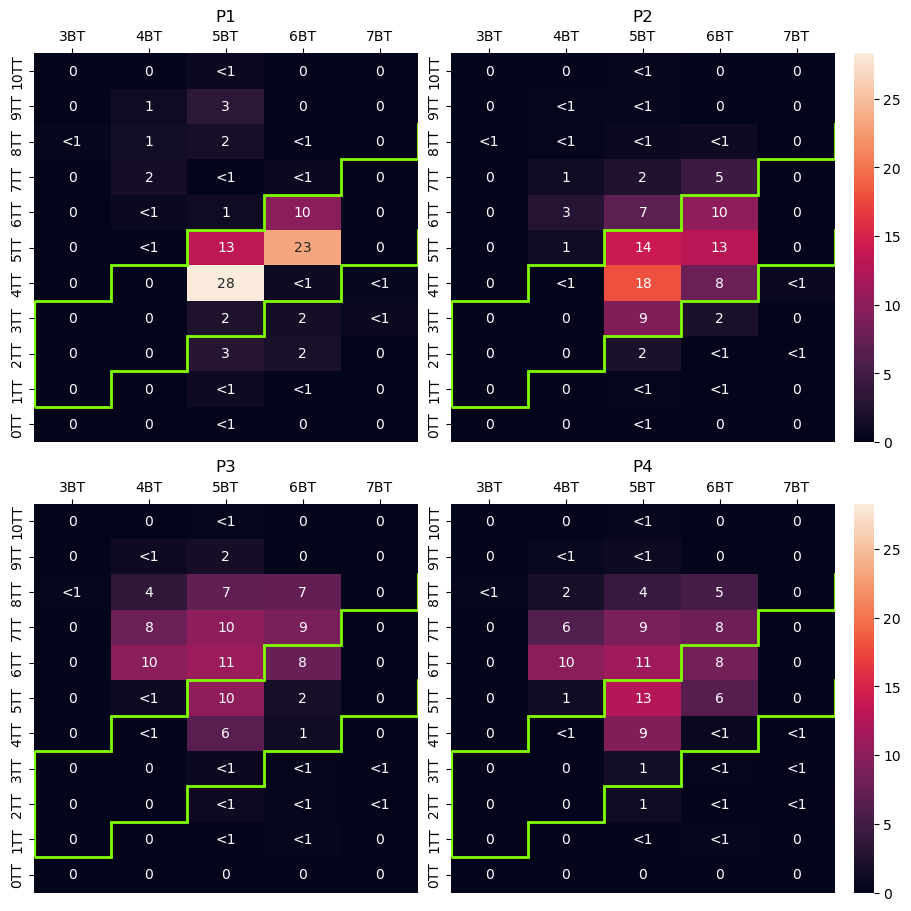

In [89]:
no_homocoupling = {sample:0 for sample in ['P1', 'P2', 'P3', 'P4']}
def_homocoupling = {sample:0 for sample in ['P1', 'P2', 'P3', 'P4']}
all_prop = {sample:0 for sample in ['P1', 'P2', 'P3', 'P4']}

vmax = df_5_cores.max().max()
fig, ax = plt.subplots(2, 2, figsize=(9, 9), constrained_layout=True, squeeze=False)
for i, sample in enumerate(['P1', 'P2', 'P3', 'P4']):
    df_5_tt_bt = pd.DataFrame(0, columns=bt_counts, index=tt_counts)
    for core in df_5_cores.index:
        counts = core.split('+')
        df_5_tt_bt.loc[counts[1], counts[0]] += df_5_cores.loc[core, sample]
        diff = abs(int(counts[1][:-2]) - int(counts[0][:-2]))
        if diff==0 or diff==1:
            no_homocoupling[sample] += df_5_cores.loc[core, sample]
        else:
            def_homocoupling[sample] += df_5_cores.loc[core, sample]
        all_prop[sample] += df_5_cores.loc[core, sample]
    #########################################################
    labels = df_5_tt_bt.applymap(lambda v: "<1" if 0 < v < 1 else str(round(v)))
    #########################################################
    
    cbar = True if i%2 == 1 else False
    sns.heatmap(df_5_tt_bt, ax=ax[i//2, i%2], vmax=vmax, cmap="rocket", cbar=cbar, annot=labels, fmt='')
    ax[i//2, i%2].set(xlabel="", ylabel="", title=f"{sample}")
    ax[i//2, i%2].xaxis.tick_top()
    #########################################################
    # add patches
    diag = [(0, 8), (1, 7), (2, 6), (3, 5), (4, 4), (5, 3)]
    bottom_bound, top_bound = 0, 11
    edge_c = "chartreuse"
    #########################################################
    vertices = [(0, 8), (0, 7), (1, 7), (1, 6), (2, 6)]
    vertices_1 = []
    vertices_2 = []
    for n_bt, n_tt in diag:
        if n_tt - 1 >= 0 and n_bt+1 <= 6: vertices_1.extend([(n_bt, n_tt-1), (n_bt+1, n_tt-1)])
        if n_tt + 2 <= 12 and n_bt+1 <= 6: vertices_2.extend([(n_bt, n_tt+2), (n_bt+1, n_tt+2)])
    ax[i//2, i%2].add_patch(Polygon(vertices_1, closed=False, fill=False, edgecolor=edge_c, lw=2))
    ax[i//2, i%2].add_patch(Polygon(vertices_2, closed=False, fill=False, edgecolor=edge_c, lw=2))
    ax[i//2, i%2].add_patch(Polygon([(0, i) for i in range(7, 11)], closed=False, fill=False, edgecolor=edge_c, lw=3))
    ax[i//2, i%2].add_patch(Polygon([(6, i) for i in range(2, 6)], closed=False, fill=False, edgecolor=edge_c, lw=3))
    #########################################################                                                    

In [57]:
print("No homocoupling")
for sample in no_homocoupling:
    print(f"{sample}: {round(no_homocoupling[sample], 2)},  {no_homocoupling[sample]}")
print("Definitive homocoupling")
for sample in def_homocoupling:
    print(f"{sample}: {round(def_homocoupling[sample], 2)},  {def_homocoupling[sample]}")
print("Sum of proportions")
for sample in all_prop:
    print(f"{sample}: {round(all_prop[sample], 2)},  {all_prop[sample]}")

No homocoupling
P1: 76.75,  76.75113419656557
P2: 68.03,  68.03432735718593
P3: 46.9,  46.895415979902005
P4: 57.32,  57.31648457661075
Definitive homocoupling
P1: 23.25,  23.248865803434423
P2: 31.97,  31.96567264281407
P3: 53.1,  53.104584020097995
P4: 42.68,  42.68351542338927
Sum of proportions
P1: 100.0,  100.0
P2: 100.0,  100.00000000000001
P3: 100.0,  100.00000000000003
P4: 100.0,  100.00000000000003


## End-groups

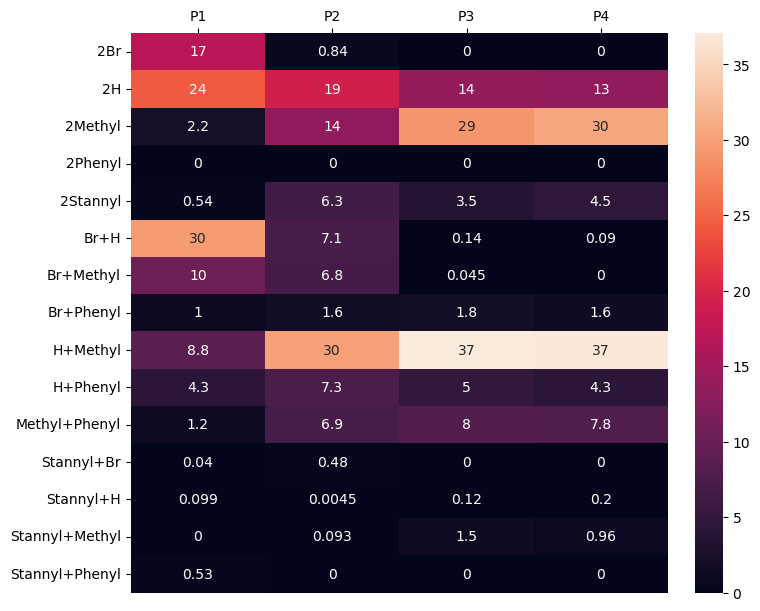

In [82]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500
df_5 = pd.read_csv(f"Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv", index_col=0)
#########################################################

ends = set()
for polymer in df_5.columns:
    end = polymer.split('+')
    if len(end)==3: ends.add(end[2])
    else: ends.add(end[2]+"+"+end[3])
ends = list(ends)
ends.sort()

df_5_ends = pd.DataFrame(0, columns=df_5.index, index=ends)
for polymer in df_5.columns:
    end = polymer.split('+')
    if len(end)==3: end = end[2]
    else: end = end[2]+"+"+end[3]
    for sample in df_5.index:
        df_5_ends.loc[end, sample] += df_5.loc[sample, polymer]

df_5_ends.columns = ['P1', 'P2', 'P3', 'P4']
df_5_ends.to_csv(f"./Results/all_c14_spectras_5_polymer_ends.csv")
#normalize 
for col in df_5_ends.columns:
    df_5_ends[col] /= df_5_ends.sum()[col]
df_5_ends = 100*df_5_ends
df_5_ends.to_csv(f"./Results/all_c14_spectras_5_polymer_ends_normalized.csv")

end_1 = set()
end_2 = set()
for ends in df_5_ends.index:
    ends = ends.split('+')
    if len(ends)==1:
        end_1.add(ends[0][1:])
        end_2.add(ends[0][1:])
    else:
        end_1.add(ends[0])
        end_2.add(ends[1])
end_1 = list(end_1)
end_1.sort()
end_2 = list(end_2)
end_2.sort()

# displaying dataframe as an heatmap 
# with diverging colourmap as virdis
# df_5_ends.style.background_gradient(cmap ='viridis')\
#         .set_properties(**{'font-size': '13px'})

fig, ax = plt.subplots(figsize=(7.5, 6), constrained_layout=True)
ax = sns.heatmap(df_5_ends, annot=True)
ax.set(xlabel="", ylabel="")
ax.xaxis.tick_top()

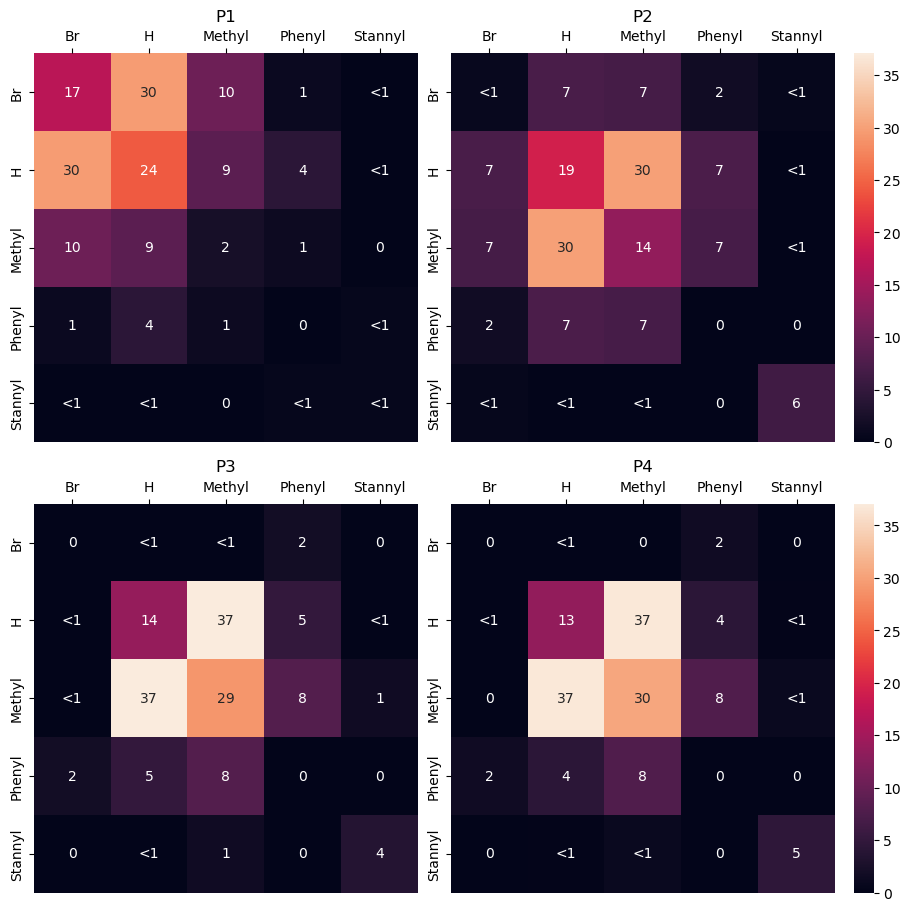

In [83]:
vmax = df_5_ends.max().max()
fig, ax = plt.subplots(2, 2, figsize=(9, 9), constrained_layout=True, squeeze=False)
for i, sample in enumerate(['P1', 'P2', 'P3', 'P4']):
    df_5_e1_e2 = pd.DataFrame(0, columns=end_1, index=end_2)
    for ends in df_5_ends.index:
        e = ends.split('+')
        if len(e)==1: 
            df_5_e1_e2.loc[e[0][1:], e[0][1:]] += df_5_ends.loc[ends, sample]
        else:
            df_5_e1_e2.loc[e[0], e[1]] += df_5_ends.loc[ends, sample]
            df_5_e1_e2.loc[e[1], e[0]] += df_5_ends.loc[ends, sample]
            
    ##################################################
    labels = df_5_e1_e2.applymap(lambda v: "<1" if 0 < v < 1 else str(round(v)))
    ##################################################
    cbar = True if i%2 == 1 else False
    
    sns.heatmap(df_5_e1_e2, ax=ax[i//2, i%2], vmax=vmax, cbar=cbar, annot=labels, fmt='')
    ax[i//2, i%2].set(xlabel="", ylabel="", title=f"{sample}")
    ax[i//2, i%2].xaxis.tick_top()

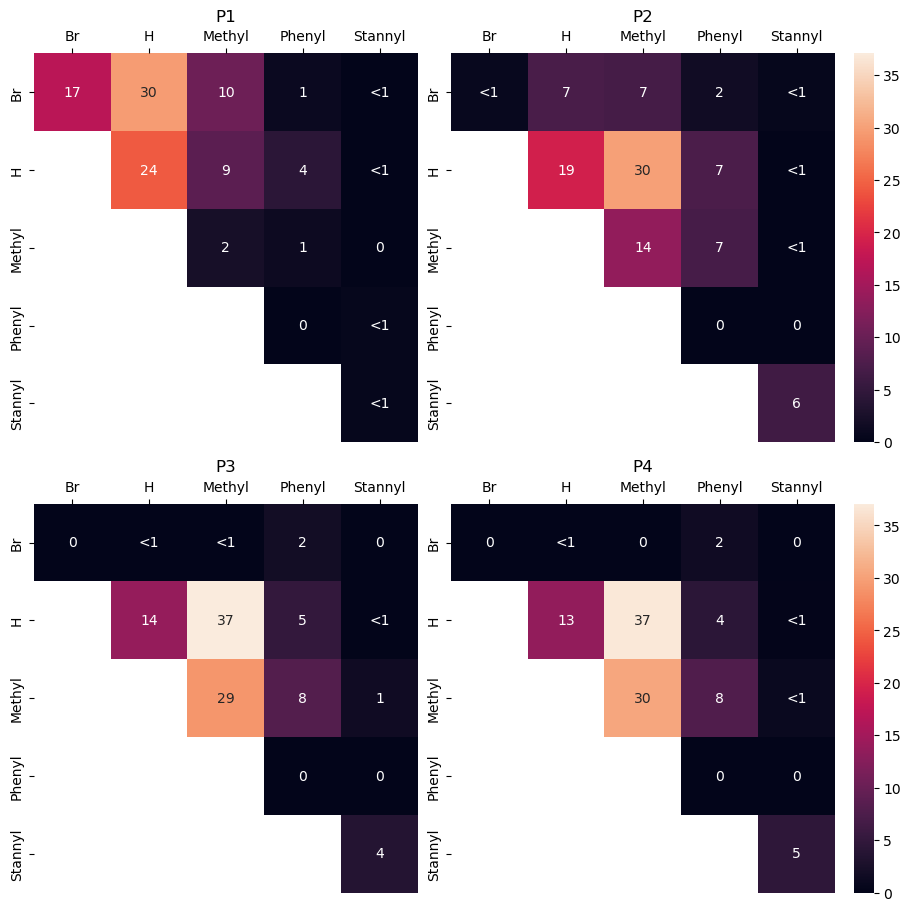

In [117]:
###### vmax = df_5_ends.max().max()
fig, ax = plt.subplots(2, 2, figsize=(9, 9), constrained_layout=True, squeeze=False)
for i, sample in enumerate(['P1', 'P2', 'P3', 'P4']):
    df_5_e1_e2 = pd.DataFrame(0, columns=end_1, index=end_2)
    for ends in df_5_ends.index:
        e = ends.split('+')
        if len(e)==1: 
            df_5_e1_e2.loc[e[0][1:], e[0][1:]] += df_5_ends.loc[ends, sample]
        else:
            df_5_e1_e2.loc[e[0], e[1]] += df_5_ends.loc[ends, sample]
            df_5_e1_e2.loc[e[1], e[0]] += df_5_ends.loc[ends, sample]
            
    ##################################################
    labels = df_5_e1_e2.applymap(lambda v: "<1" if 0 < v < 1 else str(round(v)))
    # remove labels under diagonal
    for c in range(5):
        for r in range(5):
            if r > c:
                labels.iloc[r, c] = ''
    ##################################################
    cbar = True if i%2 == 1 else False
    
    sns.heatmap(df_5_e1_e2, ax=ax[i//2, i%2], vmax=vmax, cbar=cbar, annot=labels, fmt='')
    ax[i//2, i%2].set(xlabel="", ylabel="", title=f"{sample}")
    ax[i//2, i%2].xaxis.tick_top()
    #########################################################
    # bottom_bound, top_bound = 0, 5
    vertices = []
    for x in range(5):
        vertices.append((x, x))
        vertices.append((x, x+1))
    vertices.append((0, 5))
    path = Path(vertices) 
    ax[i//2, i%2].add_patch(PathPatch(path, facecolor ='w', edgecolor = 'none', lw=2)) 
    #########################################################                 

# Thresholds `thr`

In [36]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500
df_5 = pd.read_csv(f"Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv", index_col=0)
#########################################################

p_min = []
p_max = []
labels = ['P1', 'P2', 'P3', 'P4']
for label in labels:
    df = df_5.T
    df =  df[df[label] > 0][label]
    p_min.append(df.min())
    p_max.append(df.max())
print(p_min)
print(p_max)
p_min = min(p_min)
p_max = max(p_max)
print(p_min)
print(p_max)

[4.676890606768128e-05, 3.6157580074153447e-06, 8.508450273532648e-06, 1.0320627114203878e-05]
[0.0972035317356448, 0.0487921167636436, 0.0405161488903287, 0.0444358343953529]
3.6157580074153447e-06
0.0972035317356448


## Number of polymers

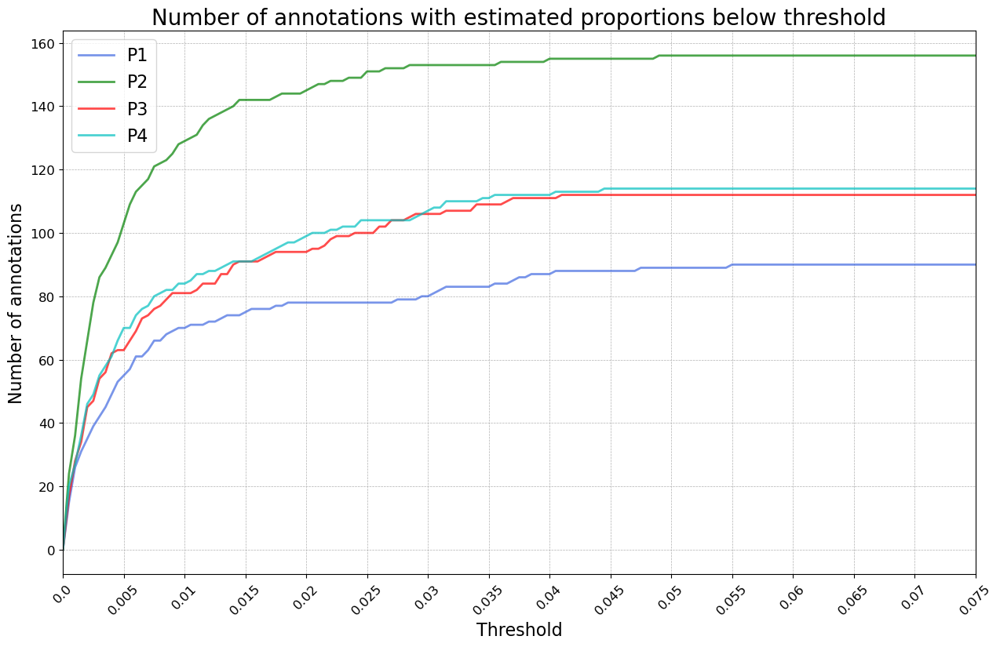

In [125]:
# thresholds = [(i*5/10000) for i in range(1, 2*75+1)]
# xs = thresholds[:1] + [(i*5/1000) for i in range(1, 15+1)]

thresholds = [(i*5/10000) for i in range(0, 2*75+1)]
xs = [(i*5/1000) for i in range(0, 15+1)]

labels = ['P1', 'P2', 'P3', 'P4']
number_of_polymers = {label:[] for label in labels}

colors = cycle(['royalblue']+list('grcmyk'))
fig, axes = plt.subplots(1, 1, figsize=(15,9))

for label in labels:
    df = df_5.T
    df =  df[df[label] > 0][label]
    for thr in thresholds:
        number_of_polymers[label].append(df[df <= thr].shape[0])
    #plot    
    axes.plot(thresholds, number_of_polymers[label], label = label, linewidth = 2, color=next(colors), alpha=0.7)

axes.tick_params(axis='x', labelsize=12)
axes.tick_params(axis='y', labelsize=12)
# axes.set_yscale('log')
plt.xlim(thresholds[0], thresholds[-1])
plt.legend(fontsize=16)
plt.ylabel("Number of annotations", fontsize=16)
plt.xlabel('Threshold', fontsize=16)
plt.xticks(xs, xs, rotation=45)
plt.title("Number of annotations with estimated proportions below threshold", fontsize=20)
plt.grid(linestyle = '--', linewidth = 0.5)
plt.show()

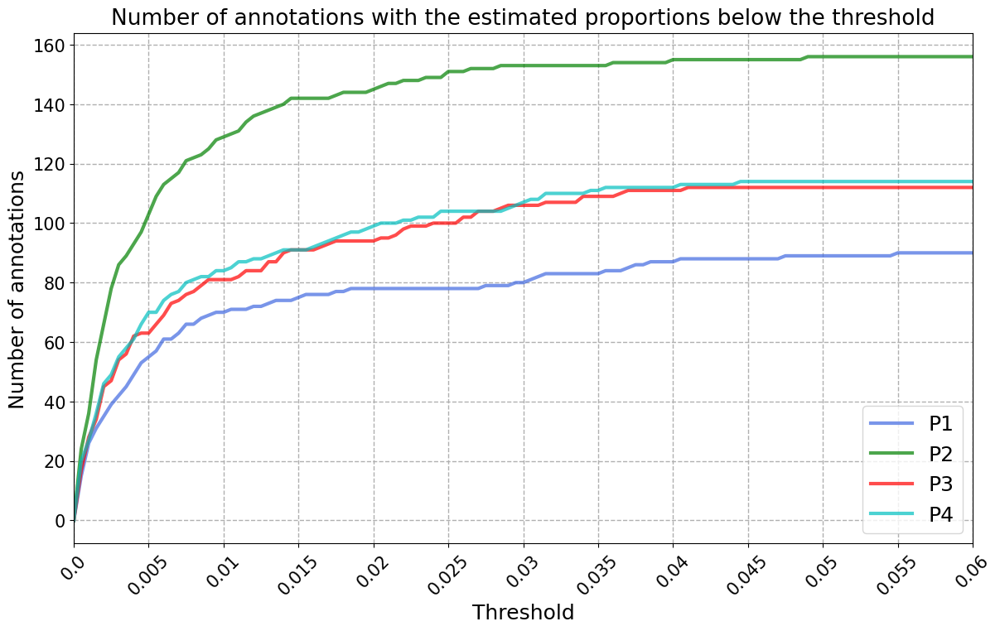

In [64]:
# thresholds = [(i*5/10000) for i in range(1, 2*75+1)]
# xs = thresholds[:1] + [(i*5/1000) for i in range(1, 15+1)]

thresholds = [(i*5/10000) for i in range(0, 2*60+1)]
xs = [(i*5/1000) for i in range(0, 12+1)]

labels = ['P1', 'P2', 'P3', 'P4']
number_of_polymers = {label:[] for label in labels}

colors = cycle(['royalblue']+list('grcmyk'))
fig, axes = plt.subplots(1, 1, figsize=(14,8))

for label in labels:
    df = df_5.T
    df =  df[df[label] > 0][label]
    for thr in thresholds:
        number_of_polymers[label].append(df[df <= thr].shape[0])
    #plot    
    axes.plot(thresholds, number_of_polymers[label], label = label, linewidth = 3, color=next(colors), alpha=0.7)

axes.tick_params(axis='x', labelsize=15)
axes.tick_params(axis='y', labelsize=15)
# axes.set_yscale('log')
plt.xlim(thresholds[0], thresholds[-1])
plt.legend(fontsize=18)
plt.ylabel("Number of annotations", fontsize=18, labelpad=4)
plt.xlabel('Threshold', fontsize=18, labelpad=4)
plt.xticks(xs, xs, rotation=45)
plt.title("Number of annotations with the estimated proportions below the threshold", fontsize=19, pad=8)
plt.grid(linestyle = '--', linewidth = 1)
plt.show()

## Jaccard similarity depending on `thr`

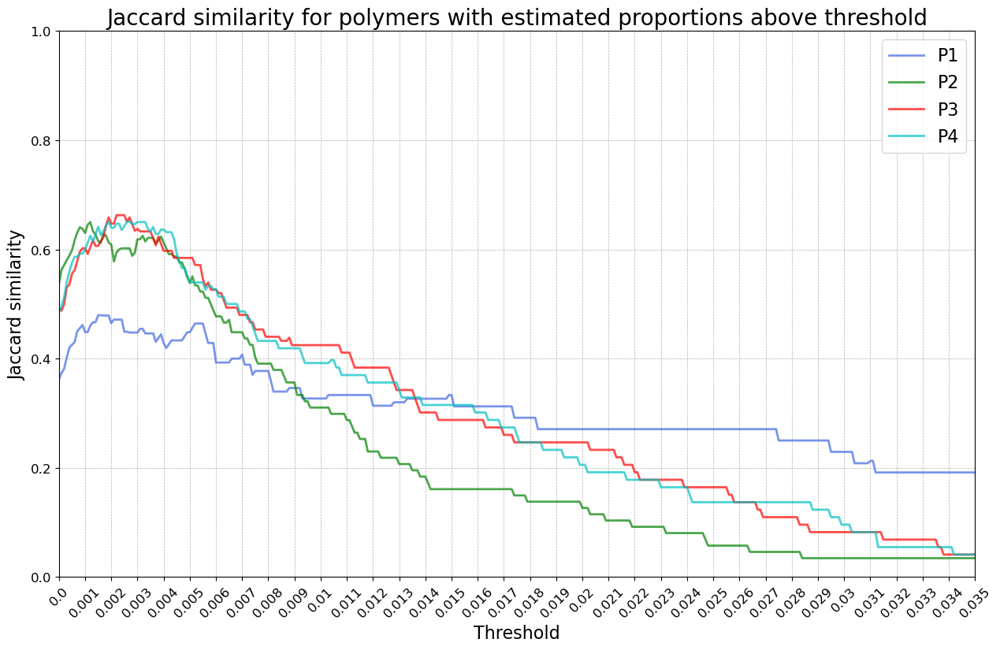

Spectrum: P1
Max: 47.95
Index: 15
Threshold: 0.0015
Min: 19.15
Index: 312
Threshold: 0.0312
***********************************
Spectrum: P2
Max: 65.0
Index: 12
Threshold: 0.0012
Min: 3.45
Index: 284
Threshold: 0.0284
***********************************
Spectrum: P3
Max: 66.27
Index: 22
Threshold: 0.0022
Min: 4.11
Index: 338
Threshold: 0.0338
***********************************
Spectrum: P4
Max: 65.12
Index: 19
Threshold: 0.0019
Min: 4.11
Index: 342
Threshold: 0.0342
***********************************


In [127]:
# thresholds = [(i/10000) for i in range(1, 351)]
# xs = thresholds[:1] + [(i/1000) for i in range(1, 36)]

thresholds = [(i/10000) for i in range(0, 351)]
xs = [(i/1000) for i in range(0, 36)]

labels = ['P1', 'P2', 'P3', 'P4']
jaccard_similarity = {label:[] for label in labels}

colors = cycle(['royalblue']+list('grcmyk'))
fig, axes = plt.subplots(1, 1, figsize=(15,9))

for label in labels:
    df = df_5.T
    df =  df[df[label] > 0][label]
    for thr in thresholds:
        mass_annot = list(df[df > thr].index)
        score = jaccard(mass_annot, expert_annotations[label])
        jaccard_similarity[label].append(score)
    #plot    
    axes.plot(thresholds, jaccard_similarity[label], label = label, linewidth = 2, color=next(colors), alpha=0.7)

axes.tick_params(axis='x', labelsize=12)
axes.tick_params(axis='y', labelsize=12)
##############################################
axes.set_ylim(0, 1) # change y-axis scale
##############################################
# axes.set_yscale('log')
plt.xlim(thresholds[0], thresholds[-1])
plt.legend(fontsize=16)
plt.ylabel("Jaccard similarity", fontsize=16)
plt.xlabel('Threshold', fontsize=16)
plt.xticks(xs, xs, rotation=45)
plt.title("Jaccard similarity for polymers with estimated proportions above threshold", fontsize=20)
plt.grid(linestyle = '--', linewidth = 0.5)
plt.show()

for ind in jaccard_similarity:
    print(f"Spectrum: {ind}")
    scores = jaccard_similarity[ind]
    max_score = max(scores)
    min_score = min(scores)
    print(f"Max: {round(100*max_score, 2)}")
    index = scores.index(max_score)
    print(f"Index: {index}")
    print(f"Threshold: {thresholds[index]}")
    print(f"Min: {round(100*min_score, 2)}")
    index = scores.index(min_score)
    print(f"Index: {index}")
    print(f"Threshold: {thresholds[index]}")    
    print("***********************************")

In [128]:
p_thr = 0.002
index = thresholds.index(p_thr)
print(f"Index: {index}")

for ind in jaccard_similarity:
    print(f"Spectrum: {ind}")
    scores = jaccard_similarity[ind]
    print(f"For thr = {p_thr}: {round(100*scores[index], 2)}")

Index: 20
Spectrum: P1
For thr = 0.002: 46.48
Spectrum: P2
For thr = 0.002: 60.91
Spectrum: P3
For thr = 0.002: 64.71
Spectrum: P4
For thr = 0.002: 63.95


In [57]:
xs = [(i*25/10000) for i in range(0, 24+1)]
xs

[0.0,
 0.0025,
 0.005,
 0.0075,
 0.01,
 0.0125,
 0.015,
 0.0175,
 0.02,
 0.0225,
 0.025,
 0.0275,
 0.03,
 0.0325,
 0.035,
 0.0375,
 0.04,
 0.0425,
 0.045,
 0.0475,
 0.05,
 0.0525,
 0.055,
 0.0575,
 0.06]

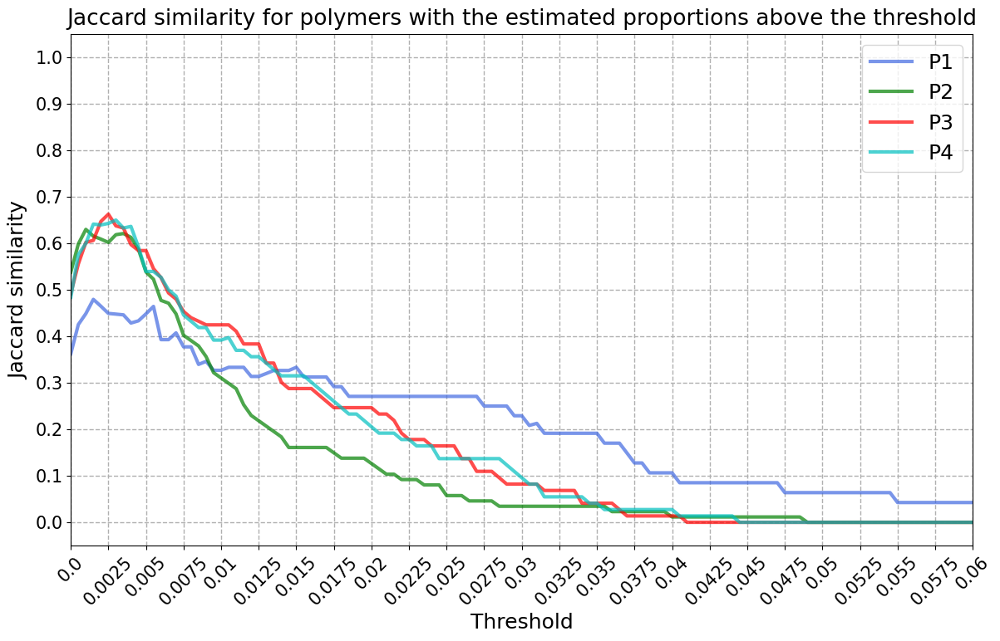

Spectrum: P1
Max: 47.95
Index: 3
Threshold: 0.0015
Min: 4.26
Index: 110
Threshold: 0.055
***********************************
Spectrum: P2
Max: 62.99
Index: 2
Threshold: 0.001
Min: 0.0
Index: 98
Threshold: 0.049
***********************************
Spectrum: P3
Max: 66.27
Index: 5
Threshold: 0.0025
Min: 0.0
Index: 82
Threshold: 0.041
***********************************
Spectrum: P4
Max: 65.0
Index: 6
Threshold: 0.003
Min: 0.0
Index: 89
Threshold: 0.0445
***********************************


In [61]:
# thresholds = [(i/10000) for i in range(1, 351)]
# xs = thresholds[:1] + [(i/1000) for i in range(1, 36)]

# thresholds = [(i/10000) for i in range(0, 351)]
# xs = [(i/1000) for i in range(0, 36)]
# ys = [i/10 for i in range(11)]

thresholds = [(i*5/10000) for i in range(0, 2*60+1)]
# xs = [(i*5/1000) for i in range(0, 12+1)]
xs = [(i*25/10000) for i in range(0, 24+1)]
ys = [i/10 for i in range(11)]

labels = ['P1', 'P2', 'P3', 'P4']
jaccard_similarity = {label:[] for label in labels}

colors = cycle(['royalblue']+list('grcmyk'))
fig, axes = plt.subplots(1, 1, figsize=(14,8))

for label in labels:
    df = df_5.T
    df =  df[df[label] > 0][label]
    for thr in thresholds:
        mass_annot = list(df[df > thr].index)
        score = jaccard(mass_annot, expert_annotations[label])
        jaccard_similarity[label].append(score)
    #plot    
    axes.plot(thresholds, jaccard_similarity[label], label = label, linewidth = 3, color=next(colors), alpha=0.7)

axes.tick_params(axis='x', labelsize=15)
axes.tick_params(axis='y', labelsize=15)
##############################################
axes.set_ylim(-0.05, 1.05) # change y-axis scale
plt.yticks(ys, ys)
##############################################
# axes.set_yscale('log')
plt.xlim(thresholds[0], thresholds[-1])
plt.legend(fontsize=18)
plt.ylabel("Jaccard similarity", fontsize=18, labelpad=6)
plt.xlabel('Threshold', fontsize=18, labelpad=4)
plt.xticks(xs, xs, rotation=45)
plt.title("Jaccard similarity for polymers with the estimated proportions above the threshold", fontsize=19, pad=8)
plt.grid(linestyle = '--', linewidth = 1)
plt.show()

for ind in jaccard_similarity:
    print(f"Spectrum: {ind}")
    scores = jaccard_similarity[ind]
    max_score = max(scores)
    min_score = min(scores)
    print(f"Max: {round(100*max_score, 2)}")
    index = scores.index(max_score)
    print(f"Index: {index}")
    print(f"Threshold: {thresholds[index]}")
    print(f"Min: {round(100*min_score, 2)}")
    index = scores.index(min_score)
    print(f"Index: {index}")
    print(f"Threshold: {thresholds[index]}")    
    print("***********************************")

## Sensitivity depending on `thr`

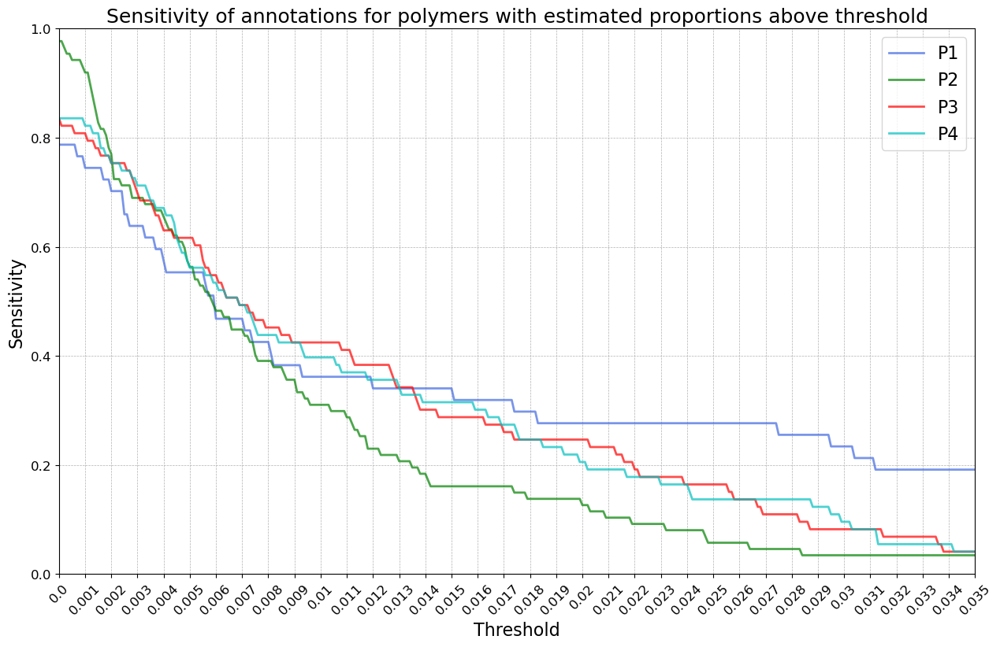

Spectrum: P1
Max: 78.72
Index: 0
Threshold: 0.0
***********************************
Spectrum: P2
Max: 97.7
Index: 0
Threshold: 0.0
***********************************
Spectrum: P3
Max: 83.56
Index: 0
Threshold: 0.0
***********************************
Spectrum: P4
Max: 83.56
Index: 0
Threshold: 0.0
***********************************


In [8]:
# thresholds = [(i/10000) for i in range(1, 351)]
# xs = thresholds[:1] + [(i/1000) for i in range(1, 36)]

thresholds = [(i/10000) for i in range(0, 351)]
xs = [(i/1000) for i in range(0, 36)]

labels = ['P1', 'P2', 'P3', 'P4']
jaccard_sensitivity = {label:[] for label in labels}

colors = cycle(['royalblue']+list('grcmyk'))
fig, axes = plt.subplots(1, 1, figsize=(15,9))

for label in labels:
    df = df_5.T
    df =  df[df[label] > 0][label]
    for thr in thresholds:
        mass_annot = list(df[df > thr].index)
        score = jaccard_normalized(mass_annot, expert_annotations[label])
        jaccard_sensitivity[label].append(score)
    #plot    
    axes.plot(thresholds, jaccard_sensitivity[label], label = label, linewidth = 2, color=next(colors), alpha=0.7)

axes.tick_params(axis='x', labelsize=12)
axes.tick_params(axis='y', labelsize=12)
##############################################
axes.set_ylim(0, 1) # change y-axis scale
##############################################
# axes.set_yscale('log')
plt.xlim(thresholds[0], thresholds[-1])
plt.legend(fontsize=16)
plt.ylabel("Sensitivity", fontsize=16)
plt.xlabel('Threshold', fontsize=16)
plt.xticks(xs, xs, rotation=45)
plt.title("Sensitivity of annotations for polymers with estimated proportions above threshold", fontsize=18)
plt.grid(linestyle = '--', linewidth = 0.5)
plt.show()

for ind in jaccard_sensitivity:
    print(f"Spectrum: {ind}")
    scores = jaccard_sensitivity[ind]
    max_score = max(scores)
    print(f"Max: {round(100*max_score, 2)}")
    index = scores.index(max_score)
    print(f"Index: {index}")
    print(f"Threshold: {thresholds[index]}")
    print("***********************************")

In [9]:
p_thr = 0.002
index = thresholds.index(p_thr)
print(f"Index: {index}")

for ind in jaccard_sensitivity:
    print(f"Spectrum: {ind}")
    scores = jaccard_sensitivity[ind]
    print(f"For thr = {p_thr}: {round(100*scores[index], 2)}")

Index: 20
Spectrum: P1
For thr = 0.002: 70.21
Spectrum: P2
For thr = 0.002: 77.01
Spectrum: P3
For thr = 0.002: 75.34
Spectrum: P4
For thr = 0.002: 75.34


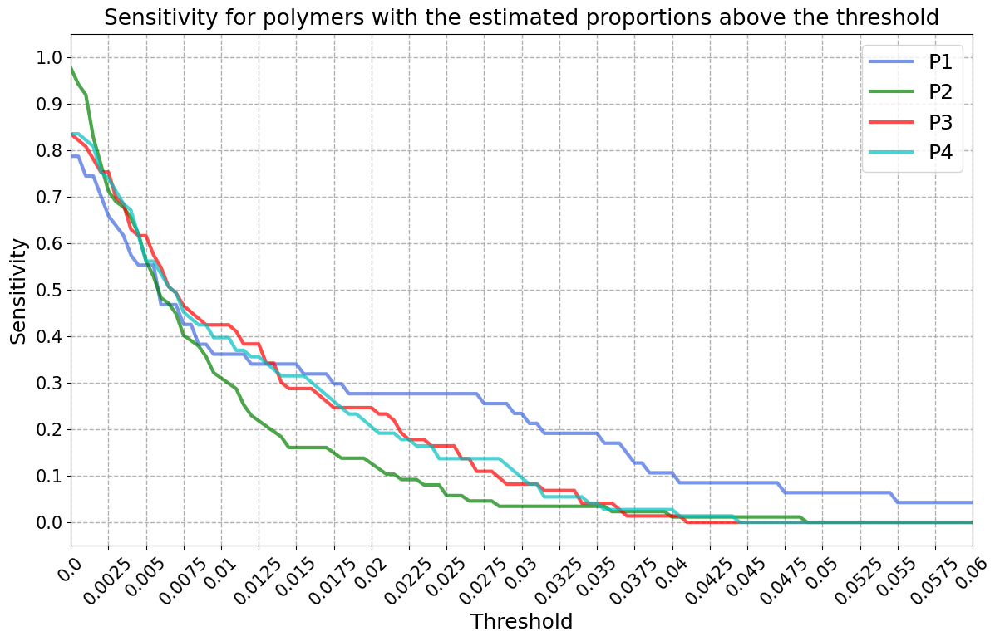

Spectrum: P1
Max: 78.72
Index: 0
Threshold: 0.0
***********************************
Spectrum: P2
Max: 97.7
Index: 0
Threshold: 0.0
***********************************
Spectrum: P3
Max: 83.56
Index: 0
Threshold: 0.0
***********************************
Spectrum: P4
Max: 83.56
Index: 0
Threshold: 0.0
***********************************


In [63]:
# thresholds = [(i/10000) for i in range(1, 351)]
# xs = thresholds[:1] + [(i/1000) for i in range(1, 36)]

# thresholds = [(i/10000) for i in range(0, 351)]
# xs = [(i/1000) for i in range(0, 36)]

thresholds = [(i*5/10000) for i in range(0, 2*60+1)]
# xs = [(i*5/1000) for i in range(0, 12+1)]
xs = [(i*25/10000) for i in range(0, 24+1)]
ys = [i/10 for i in range(11)]

labels = ['P1', 'P2', 'P3', 'P4']
jaccard_sensitivity = {label:[] for label in labels}

colors = cycle(['royalblue']+list('grcmyk'))
fig, axes = plt.subplots(1, 1, figsize=(14,8))

for label in labels:
    df = df_5.T
    df =  df[df[label] > 0][label]
    for thr in thresholds:
        mass_annot = list(df[df > thr].index)
        score = jaccard_normalized(mass_annot, expert_annotations[label])
        jaccard_sensitivity[label].append(score)
    #plot    
    axes.plot(thresholds, jaccard_sensitivity[label], label = label, linewidth = 3, color=next(colors), alpha=0.7)

axes.tick_params(axis='x', labelsize=15)
axes.tick_params(axis='y', labelsize=15)
##############################################
axes.set_ylim(-0.05, 1.05) # change y-axis scale
plt.yticks(ys, ys)
##############################################
# axes.set_yscale('log')
plt.xlim(thresholds[0], thresholds[-1])
plt.legend(fontsize=18)
plt.ylabel("Sensitivity", fontsize=18, labelpad=6)
plt.xlabel('Threshold', fontsize=18, labelpad=4)
plt.xticks(xs, xs, rotation=45)
plt.title("Sensitivity for polymers with the estimated proportions above the threshold", fontsize=19, pad=8)
plt.grid(linestyle = '--', linewidth = 1)
plt.show()

for ind in jaccard_sensitivity:
    print(f"Spectrum: {ind}")
    scores = jaccard_sensitivity[ind]
    max_score = max(scores)
    print(f"Max: {round(100*max_score, 2)}")
    index = scores.index(max_score)
    print(f"Index: {index}")
    print(f"Threshold: {thresholds[index]}")
    print("***********************************")

## HC measure depending on `thr`

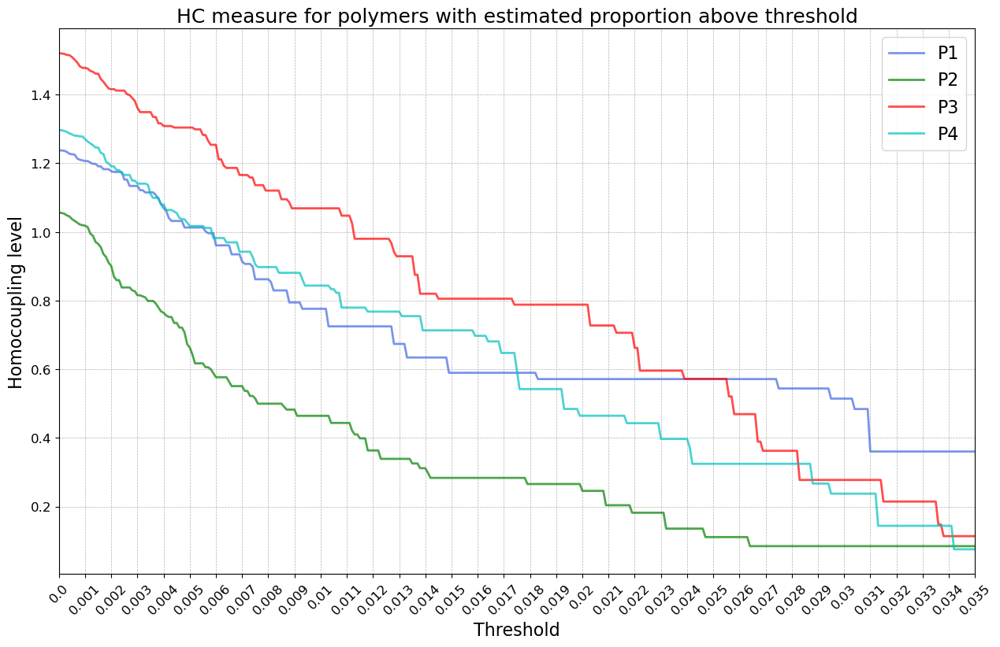

Spectrum: P1
Min: 0.36
Index: 310
Threshold: 0.031
***********************************
Spectrum: P2
Min: 0.085
Index: 264
Threshold: 0.0264
***********************************
Spectrum: P3
Min: 0.114
Index: 338
Threshold: 0.0338
***********************************
Spectrum: P4
Min: 0.075
Index: 342
Threshold: 0.0342
***********************************


In [65]:
thresholds = [(i/10000) for i in range(0, 351)]
xs = [(i/1000) for i in range(0, 36)]

labels = ['P1', 'P2', 'P3', 'P4']
hc_measure = {label:[] for label in labels}

colors = cycle(['royalblue']+list('grcmyk'))
fig, axes = plt.subplots(1, 1, figsize=(15,9))

for label in labels:
    df = df_5.T
    df =  df[df[label] > 0][[label]]
    for thr in thresholds:
        df_thr = df[df > thr].T
        homocoupling = polymers.estimate_homocoupling(df_thr) 
        hc_measure[label].append(homocoupling)
    #plot    
    axes.plot(thresholds, hc_measure[label], label = label, linewidth = 2, color=next(colors), alpha=0.7)
    

axes.tick_params(axis='x', labelsize=12)
axes.tick_params(axis='y', labelsize=12)
# axes.set_yscale('log')
plt.xlim(thresholds[0], thresholds[-1])
plt.legend(fontsize=16)
plt.ylabel("Homocoupling level", fontsize=16)
plt.xlabel('Threshold', fontsize=16)
plt.xticks(xs, xs, rotation=45)
plt.title("HC measure for polymers with estimated proportion above threshold", fontsize=18)
plt.grid(linestyle = '--', linewidth = 0.5)
plt.show()

for ind in hc_measure:
    print(f"Spectrum: {ind}")
    scores = hc_measure[ind]
    min_score = min(scores)
    print(f"Min: {round(min_score, 3)}")
    index = scores.index(min_score)
    print(f"Index: {index}")
    print(f"Threshold: {thresholds[index]}")
    print("***********************************")

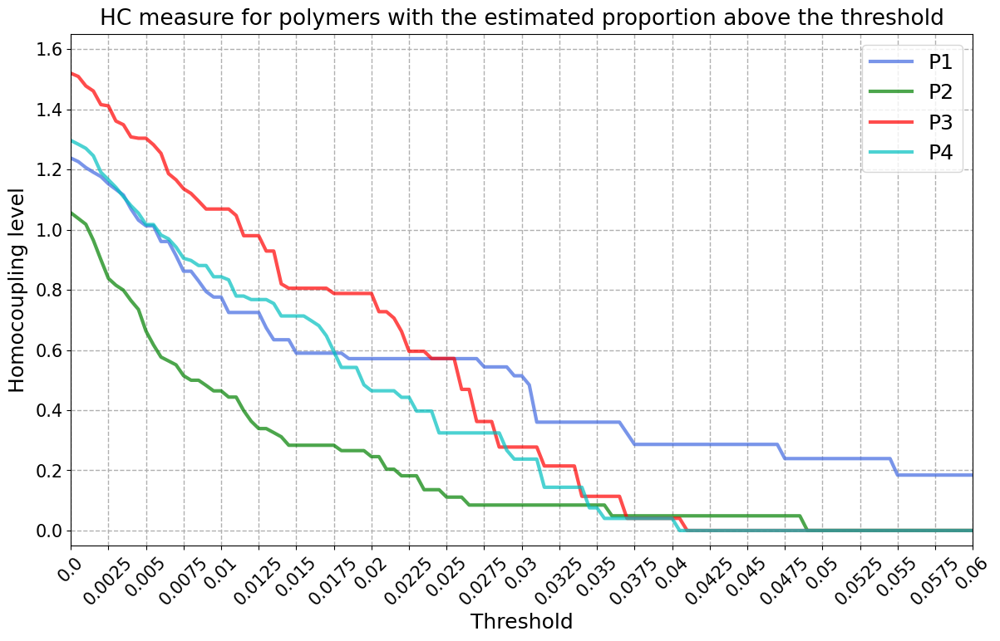

Spectrum: P1
Min: 0.184
Index: 110
Threshold: 0.055
***********************************
Spectrum: P2
Min: 0
Index: 98
Threshold: 0.049
***********************************
Spectrum: P3
Min: 0
Index: 82
Threshold: 0.041
***********************************
Spectrum: P4
Min: 0.0
Index: 81
Threshold: 0.0405
***********************************


In [70]:
# thresholds = [(i/10000) for i in range(0, 351)]
# xs = [(i/1000) for i in range(0, 36)]

thresholds = [(i*5/10000) for i in range(0, 2*60+1)]
# xs = [(i*5/1000) for i in range(0, 12+1)]
xs = [(i*25/10000) for i in range(0, 24+1)]
# ys = [i/10 for i in range(11)]

labels = ['P1', 'P2', 'P3', 'P4']
hc_measure = {label:[] for label in labels}

colors = cycle(['royalblue']+list('grcmyk'))
fig, axes = plt.subplots(1, 1, figsize=(14,8))

for label in labels:
    df = df_5.T
    df =  df[df[label] > 0][[label]]
    for thr in thresholds:
        df_thr = df[df > thr].T
        homocoupling = polymers.estimate_homocoupling(df_thr) 
        hc_measure[label].append(homocoupling)
    #plot    
    axes.plot(thresholds, hc_measure[label], label = label, linewidth = 3, color=next(colors), alpha=0.7)
    

axes.tick_params(axis='x', labelsize=15)
axes.tick_params(axis='y', labelsize=15)
##############################################
axes.set_ylim(-0.05, 1.65) # change y-axis scale
# plt.yticks(ys, ys)
##############################################
# axes.set_yscale('log')
plt.xlim(thresholds[0], thresholds[-1])
plt.legend(fontsize=18)
plt.ylabel("Homocoupling level", fontsize=18, labelpad=6)
plt.xlabel('Threshold', fontsize=18, labelpad=4)
plt.xticks(xs, xs, rotation=45)
plt.title("HC measure for polymers with the estimated proportion above the threshold", fontsize=19, pad=8)
plt.grid(linestyle = '--', linewidth = 1)
plt.show()

for ind in hc_measure:
    print(f"Spectrum: {ind}")
    scores = hc_measure[ind]
    min_score = min(scores)
    print(f"Min: {round(min_score, 3)}")
    index = scores.index(min_score)
    print(f"Index: {index}")
    print(f"Threshold: {thresholds[index]}")
    print("***********************************")

# Masserstein annotations vs expert annotation

Jakiemu procentowi intensywności widma eksperymentalnego odpowiadają te związki, które masserstein adnotował tak jak ekspert? Innymi słowy weź związki adnotowane tak samo przez eksperta i massersteina i wysumuj ich proporcje

## Built-in functions

In [6]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500
#########################################################
annotation_file_path = f"Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv"
df_annot = pd.read_csv(annotation_file_path, index_col=0)

for name in expert_annotations:
    p = df_annot.loc[name, expert_annotations[name]].sum()/df_annot.loc[name].sum()
    print(f"{name}: {round(p, 2)}")

P1: 0.8
P2: 0.87
P3: 0.91
P4: 0.91


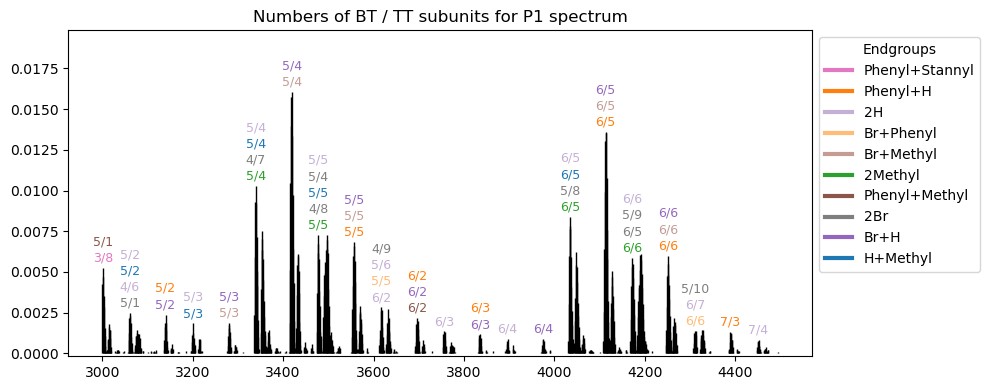

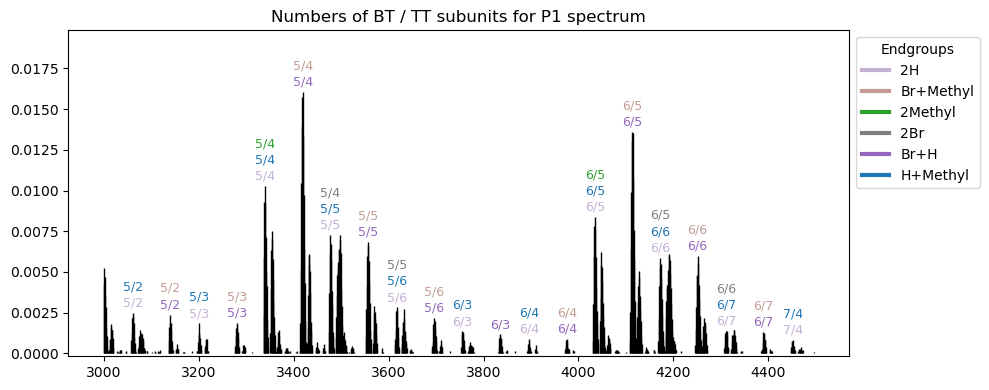

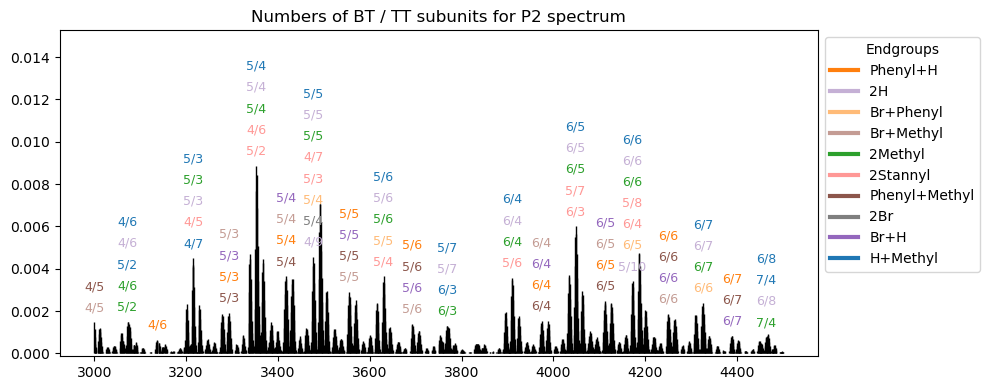

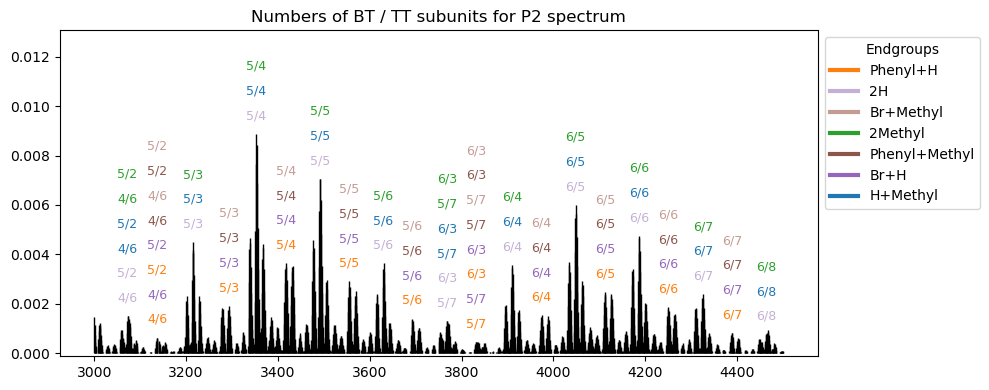

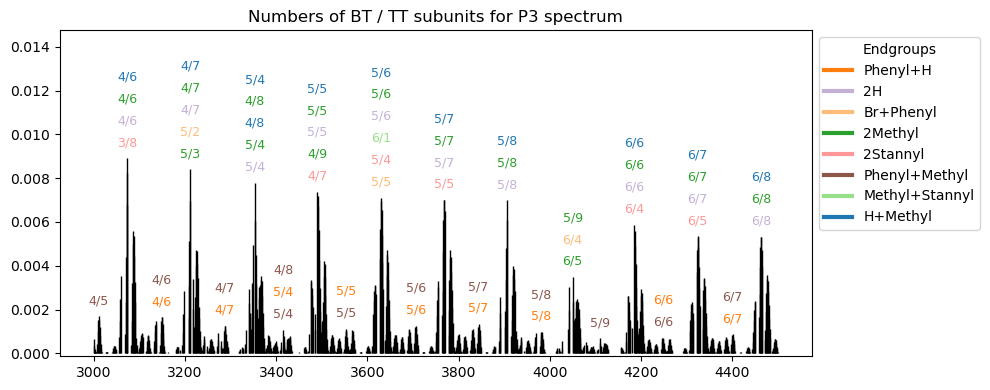

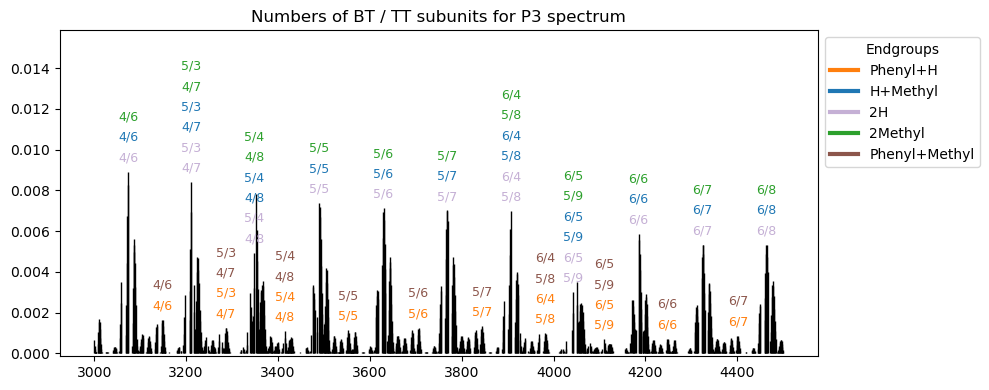

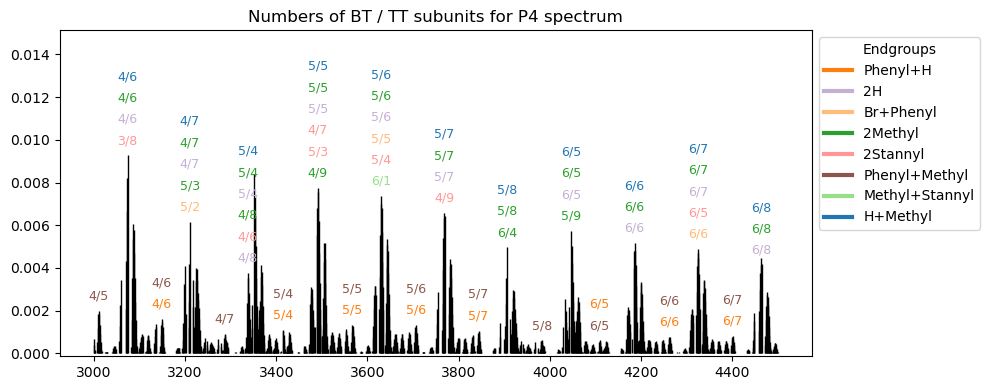

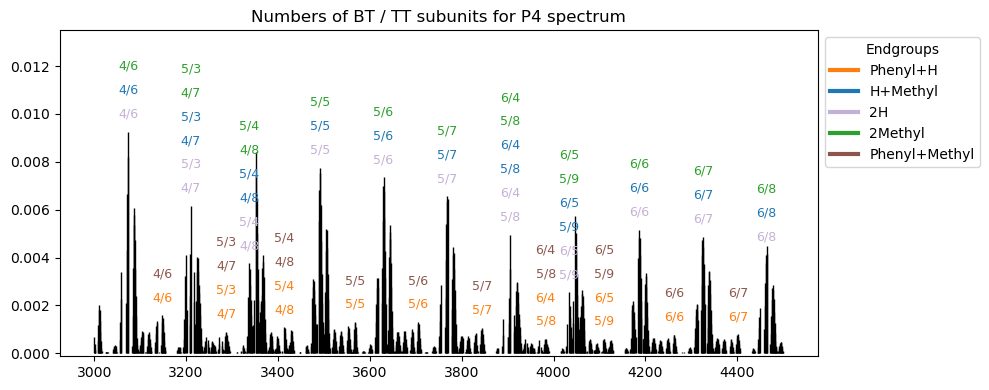

In [73]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500
#########################################################

paths = ['Data/P1_centroided.csv', 
         'Data/P2_centroided.csv', 
         'Data/P3_centroided.csv', 
         'Data/P4_centroided.csv',
                           ]
labels = ['P1', 'P2', 'P3', 'P4']
p_thr = 0.002 

output = polymers.parse_annotation_results(annotation_file_path = f"Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv", 
                                           polymer_info_path = f"Data/reference_spectra_max_diff_{bt_tt_max_count_difference}.csv", 
                                           centroided_spectra_paths = paths, 
                                           centroided_spectra_labels = labels,
                                           expert_annotations=expert_annotations,
                                          )

proportions_all, polymer_spectra, endgroup_integer_coding, all_different_endgroups_parsed, bt_count, tt_count, masses, hc_types, expert_proportions = output

for label in labels:
    proportions = proportions_all[label]
    polymer_spectrum = polymer_spectra[label]
    polymers.plot_annotations(proportions, 
                     polymer_spectrum, 
                     endgroup_integer_coding, 
                     all_different_endgroups_parsed, 
                     bt_count, 
                     tt_count, 
                     masses,
                     proportion_threshold = p_thr,
                     group_width = 20,
                     vertical_separation = 0.001,
                     )
    polymers.plot_annotations(expert_proportions[label], 
                     polymer_spectrum, 
                     endgroup_integer_coding, 
                     all_different_endgroups_parsed, 
                     bt_count, 
                     tt_count, 
                     masses,
                     proportion_threshold = p_thr,
                     group_width = 20,
                     vertical_separation = 0.001,
                     )

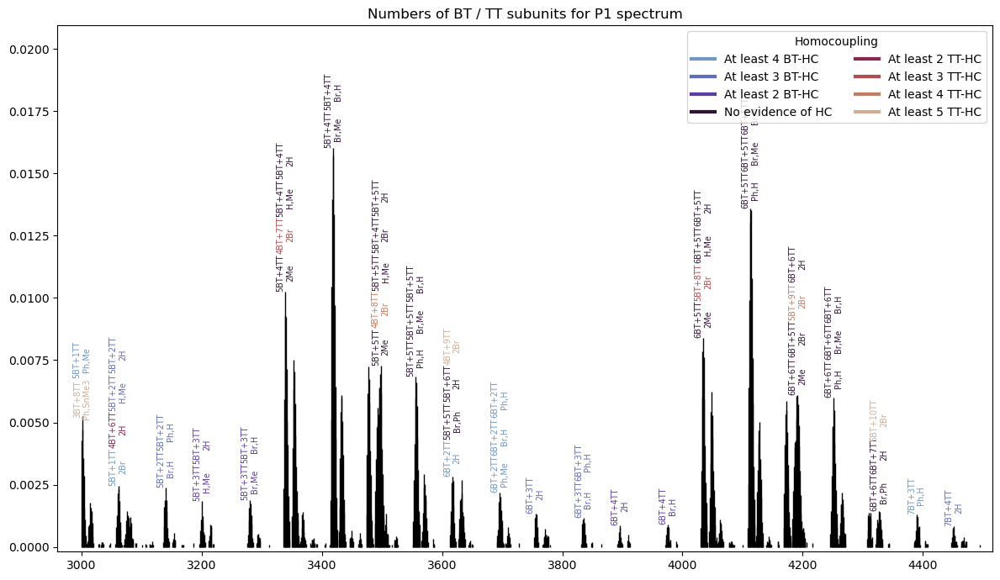

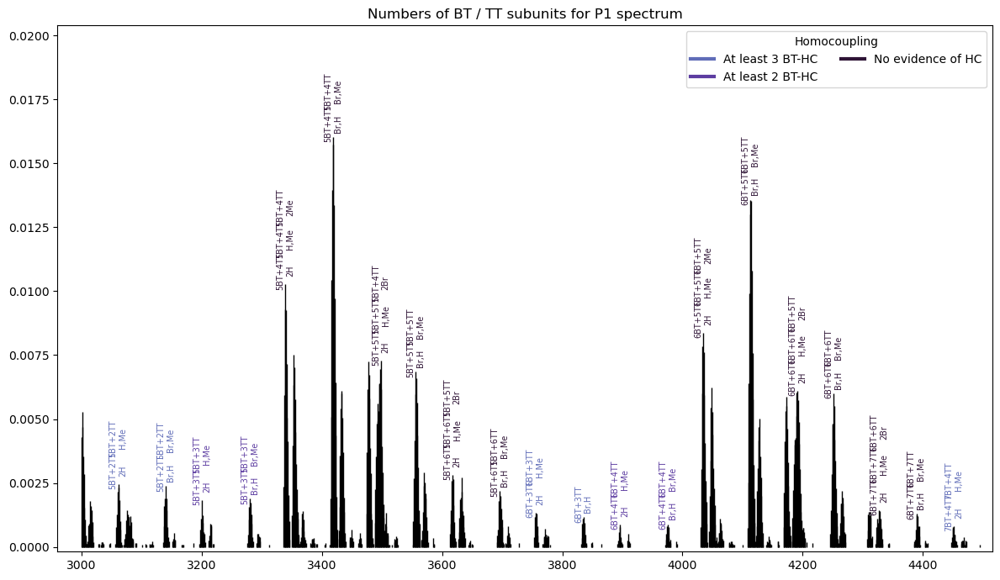

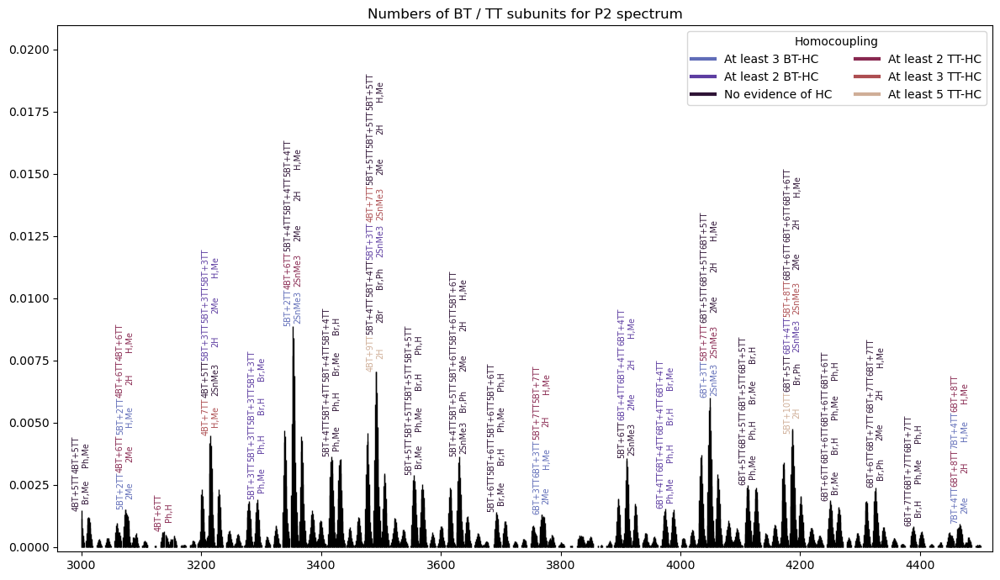

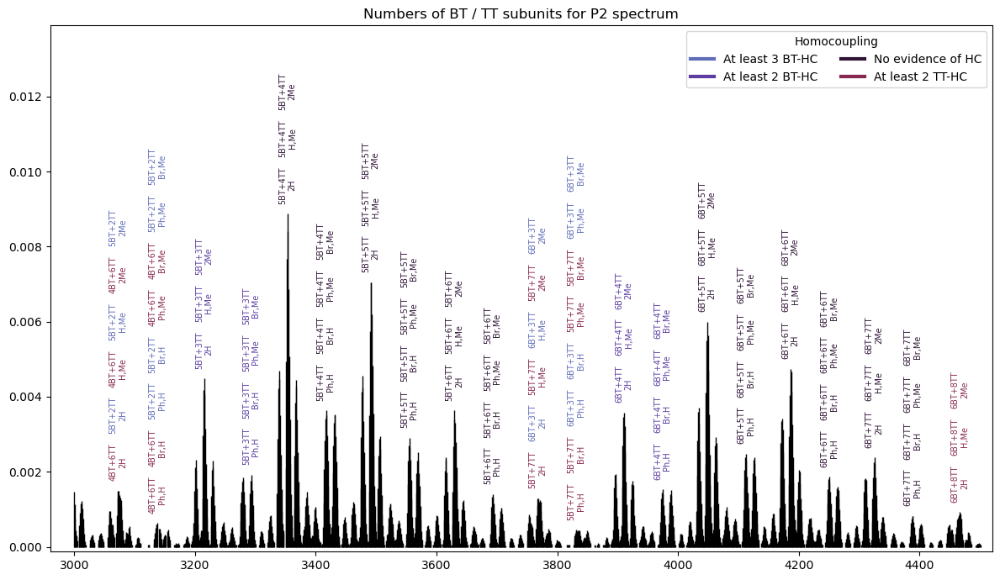

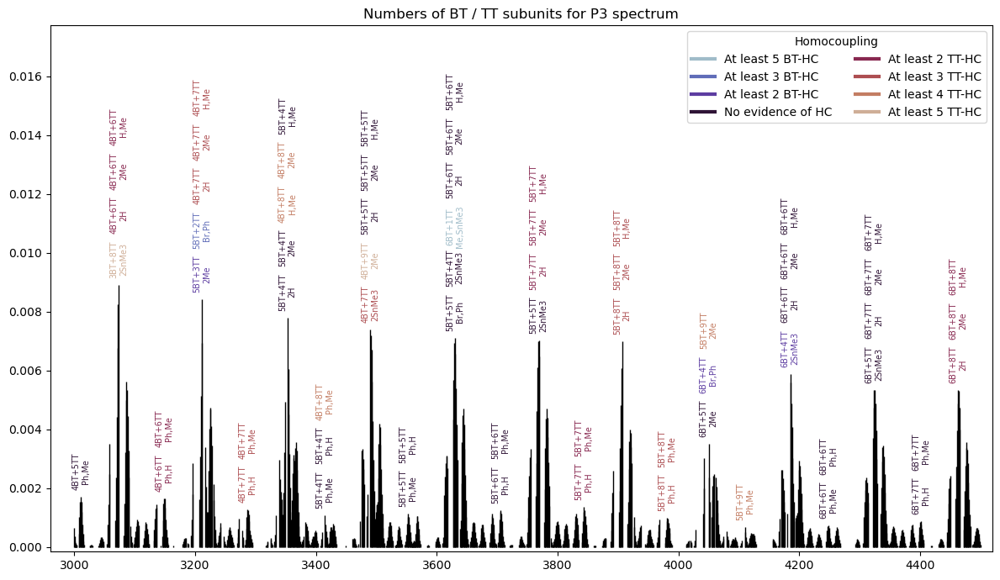

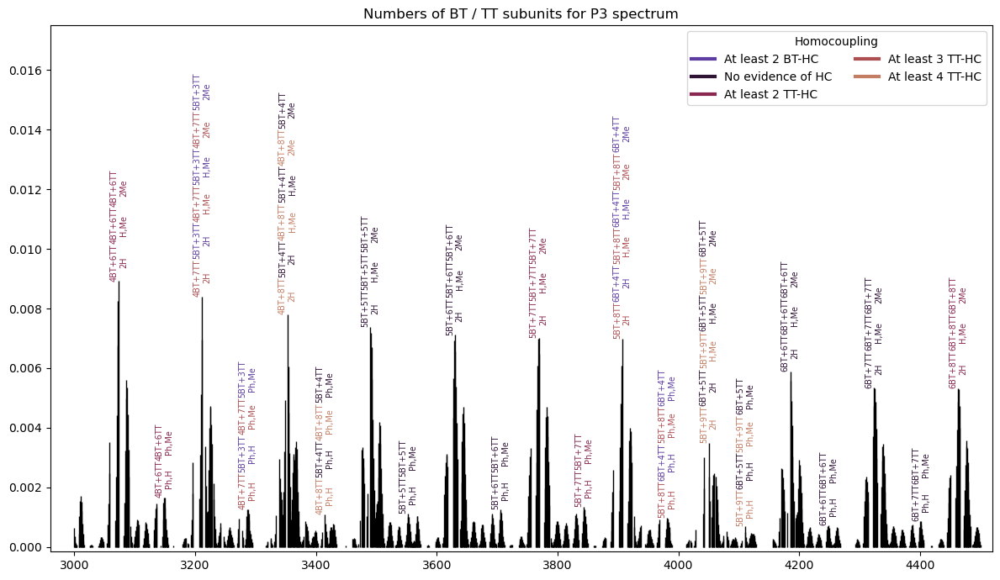

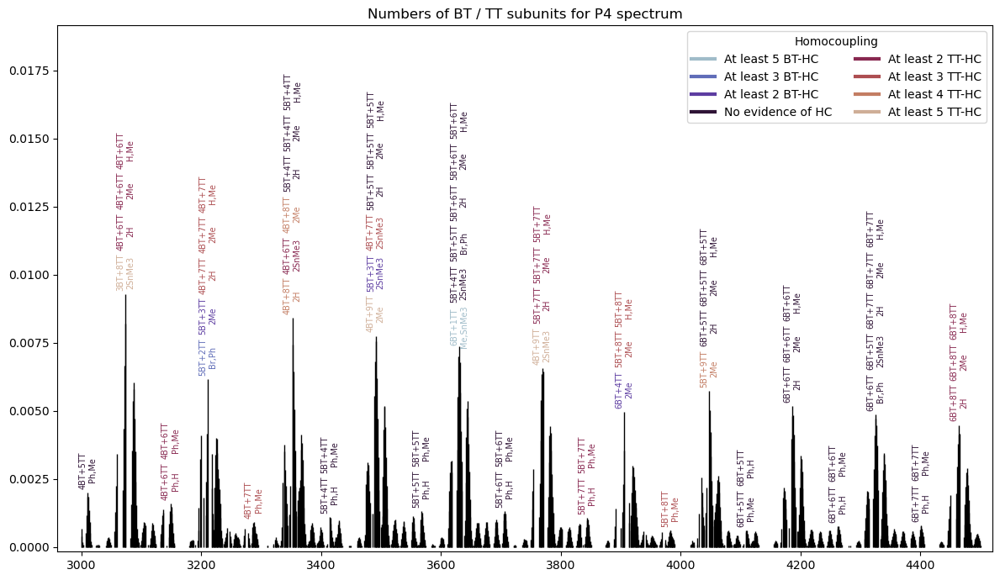

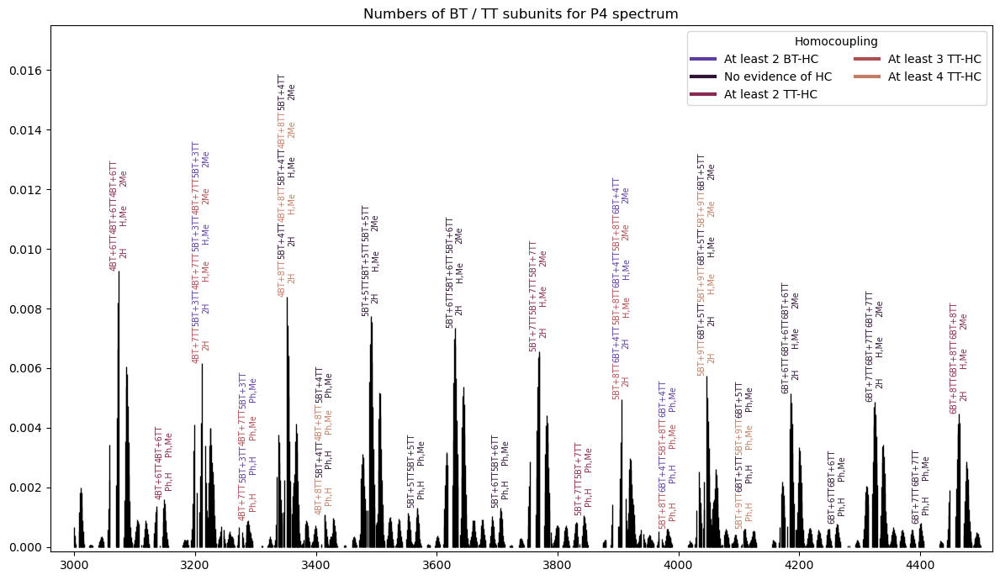

In [74]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500
#########################################################

paths = ['Data/P1_centroided.csv', 
         'Data/P2_centroided.csv', 
         'Data/P3_centroided.csv', 
         'Data/P4_centroided.csv',
                           ]
labels = ['P1', 'P2', 'P3', 'P4']
p_thr = 0.002 

output = polymers.parse_annotation_results(annotation_file_path = f"Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv", 
                                           polymer_info_path = f"Data/reference_spectra_max_diff_{bt_tt_max_count_difference}.csv", 
                                           centroided_spectra_paths = paths, 
                                           centroided_spectra_labels = labels,
                                           expert_annotations=expert_annotations,
                                          )

proportions_all, polymer_spectra, endgroup_integer_coding, all_different_endgroups_parsed, bt_count, tt_count, masses, hc_types, expert_proportions = output

for label in labels:
    proportions = proportions_all[label]
    polymer_spectrum = polymer_spectra[label]
    polymers.plot_annotations_hc(proportions, 
                     polymer_spectrum, 
                     endgroup_integer_coding, 
                     all_different_endgroups_parsed, 
                     bt_count, 
                     tt_count, 
                     masses,
                     hc_types, 
                     cmap="twilight",
                     proportion_threshold = p_thr,
                     group_width = 25,
                     vertical_separation = 0.0015,
                     endgroup_alt_names = endgroup_alt_names
                     )
    polymers.plot_annotations_hc(expert_proportions[label], 
                     polymer_spectrum, 
                     endgroup_integer_coding, 
                     all_different_endgroups_parsed, 
                     bt_count, 
                     tt_count, 
                     masses,
                     hc_types, 
                     cmap="twilight",
                     proportion_threshold = p_thr,
                     group_width = 25,
                     vertical_separation = 0.0015,
                     endgroup_alt_names = endgroup_alt_names
                     )

## Custom functions

In [252]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500
#########################################################

paths = ['Data/P1_centroided.csv', 
         'Data/P2_centroided.csv', 
         'Data/P3_centroided.csv', 
         'Data/P4_centroided.csv',
                           ]
labels = ['P1', 'P2', 'P3', 'P4']
p_thr = 0.002 

output = polymers.parse_annotation_results(annotation_file_path = f"Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv", 
                                           polymer_info_path = f"Data/reference_spectra_max_diff_{bt_tt_max_count_difference}.csv", 
                                           centroided_spectra_paths = paths, 
                                           centroided_spectra_labels = labels,
                                           expert_annotations=expert_annotations,
                                          )
proportions_all, polymer_spectra, endgroup_integer_coding, all_different_endgroups_parsed, bt_count, tt_count, masses, hc_types, expert_proportions = output

def hc_types_map(x):
    if x <= -2:
        return f"At least {abs(x)} BT-HC"
    elif x >= 2:
        return f"At least {abs(x)} TT-HC"
    else:
        return f"No evidence of HC"


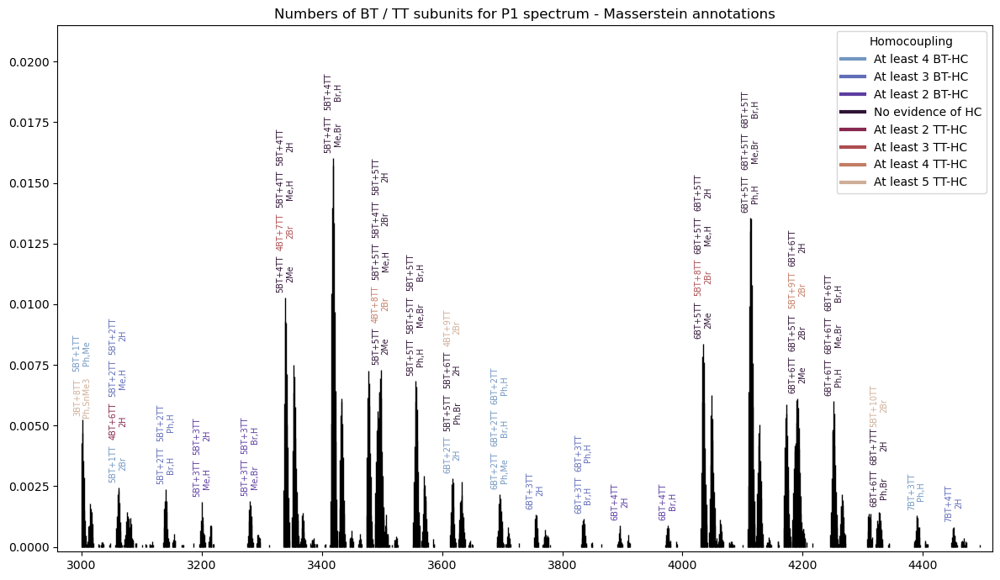

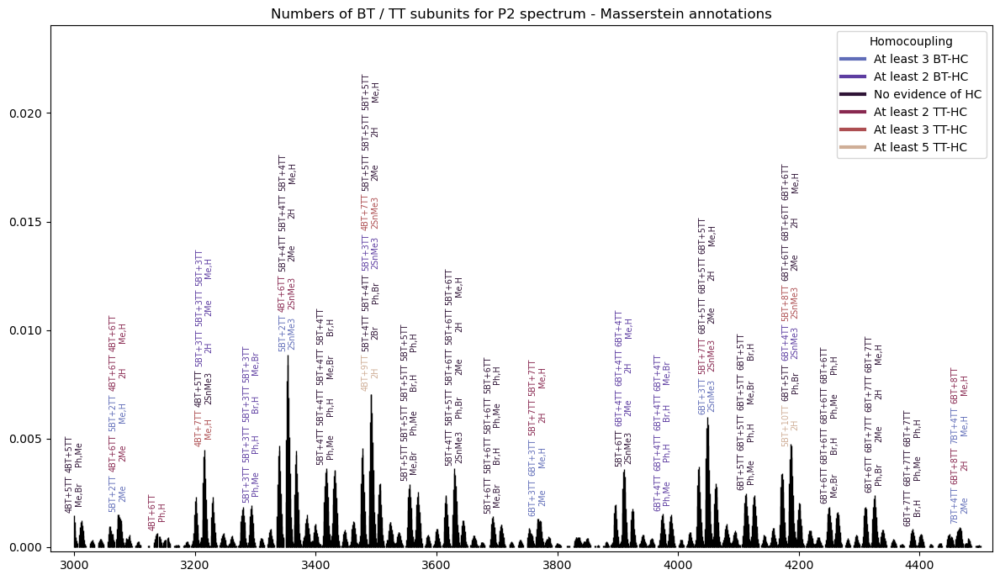

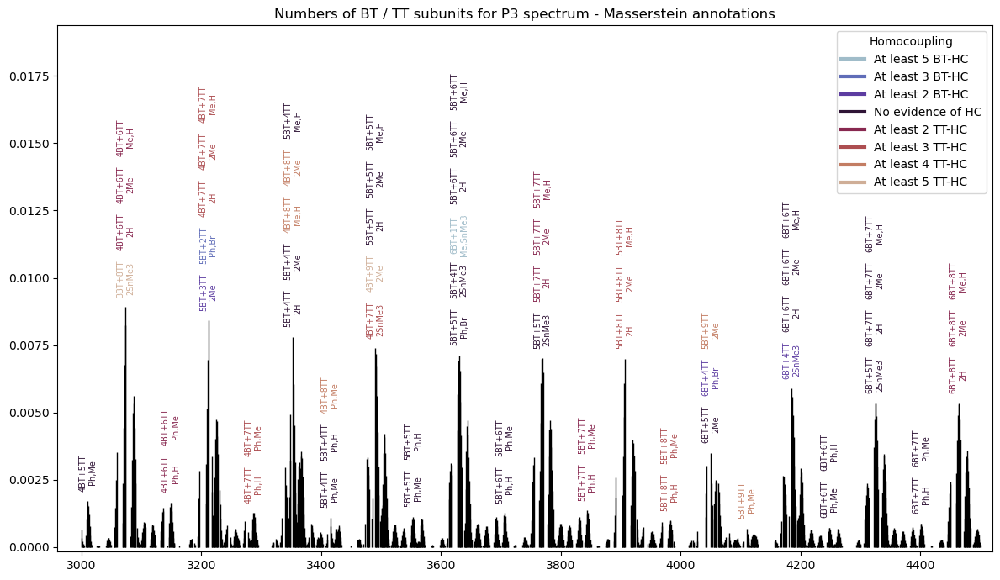

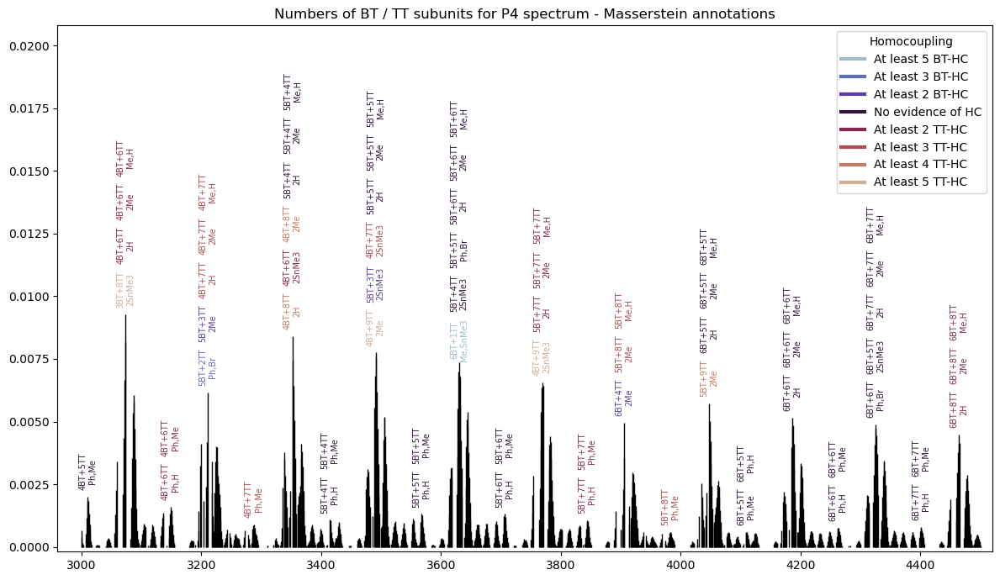

In [287]:
for name in ['P1', 'P2', 'P3', 'P4']:
    polymer_spectrum = polymer_spectra[name]
    proportions = proportions_all[name]
    # proportions = expert_proportions[name]
    
    group_width = 25
    if name == 'P2': vertical_separation=0.00185
    else: vertical_separation = 0.00175
    proportion_threshold = p_thr
    cmap = "twilight"

    # group_width = 25
    # if name == 'P2': vertical_separation=0.00125
    # else: vertical_separation = 0.00175

    # encoding type for cm.tab10/cm.tab20, cm.twilight, cm.coolwarm
    if cmap == "twilight":
        cmap = cm.get_cmap(cmap)
        hc_types_coding = np.array(hc_types)*40 + 255
    elif cmap == "coolwarm":
        cmap = cm.get_cmap(cmap)
        arr = np.array(hc_types)
        hc_types_coding = ((arr - arr.min()) * (1/(arr.max() - arr.min()) * 255)).astype('uint8')
    elif cmap == "tab20":
        cmap == cm.get_cmap(cmap)
        all_different_hc_types = list(set(hc_types))
        all_different_hc_types.sort() # bt-hc, no-hc, tt-hc
        hc_types_coding = [all_different_hc_types.index(hc) for hc in hc_types] 
    else:
        print(f"Unrecognized cmap: {cmap}. Available cmaps: twilight, coolwarm, tab20. Selecting default tab20.")
        cmap == cm.get_cmap(cmap)
        all_different_hc_types = list(set(hc_types))
        all_different_hc_types.sort() # bt-hc, no-hc, tt-hc
        hc_types_coding = [all_different_hc_types.index(hc) for hc in hc_types] 

    # Select the information about the polymers to show on the spectrum:
    is_over_threshold = [p > proportion_threshold for p in proportions]
    props_to_plot = [p for p, t in zip(proportions, is_over_threshold) if t]
    endgroup_coding_to_plot = [p for p, t in zip(endgroup_integer_coding, is_over_threshold) if t]
    endgroups_to_plot = [all_different_endgroups_parsed[egr] for egr in endgroup_coding_to_plot]
    endgroups_to_plot = [egr.split('+') for egr in endgroups_to_plot]
    if endgroup_alt_names:
          endgroups_to_plot = [f"2{endgroup_alt_names[egr[0][1:]]}" if len(egr)==1 else f"{endgroup_alt_names[egr[0]]},{endgroup_alt_names[egr[1]]}" for egr in endgroups_to_plot]
    else:
          endgroups_to_plot = [f"2{egr[0][1:]},{egr[0][1:]}" if len(egr)==1 else f"{egr[0]},{egr[1]}" for egr in endgroups_to_plot]
    bt_count_to_plot = [p for p, t in zip(bt_count, is_over_threshold) if t]
    tt_count_to_plot = [p for p, t in zip(tt_count, is_over_threshold) if t]
    masses_to_plot = [p for p, t in zip(masses, is_over_threshold) if t]
    hc_types_to_plot = [p for p, t in zip(hc_types, is_over_threshold) if t]
    hc_types_encoding_to_plot = [p for p, t in zip(hc_types_coding, is_over_threshold) if t]

    # Group polymers with similar masses, and calculate the horizontal and vertical positions of the visualization of bt/tt counts on the spectrum.
    vertical_positions = []
    horizontal_positions = []
    group_index = [0]
    for ms, prev_ms in zip(masses_to_plot, [0]+masses_to_plot[:-1]):
        experimental_nbh = [cf for cf in polymer_spectrum.confs if abs(ms-cf[0]) < group_width]
        top_peak = max(experimental_nbh, key=lambda x: x[1])
        if abs(ms - prev_ms) < group_width:
            vertical_positions.append(vertical_positions[-1] + vertical_separation)
            horizontal_positions.append(horizontal_positions[-1])
            group_index.append(group_index[-1])
        else:
            vertical_positions.append(top_peak[1] + vertical_separation)
            horizontal_positions.append(top_peak[0])
            group_index.append(group_index[-1] + 1)
    group_index = group_index[1:]

    # We'll sort polymers in groups with respect to their estimated proportions.
    all_groups = set(group_index)
    for group in all_groups:
        group_coords = [i for i, g in enumerate(group_index) if g == group]
        assert group_coords[-1] - group_coords[0] == len(group_coords) - 1, 'non-consecutive group'
        props_in_group = [(i, props_to_plot[i]) for i in group_coords]
        sorted_props = sorted(props_in_group, key = lambda x : x[1])
        sorted_positions = sorted(vertical_positions[g] for g in group_coords)
        for (g, p), vp in zip(sorted_props, sorted_positions): 
            vertical_positions[g] = vp

    fig, ax = plt.subplots(figsize=(12,7))
    polymer_spectrum.plot(show=False, color='k')
    legend_handles = []
    for bt, tt, h, v, e, p, hc in zip(bt_count_to_plot, 
                                    tt_count_to_plot, 
                                    horizontal_positions, 
                                    vertical_positions,
                                    endgroups_to_plot, 
                                    props_to_plot,
                                    hc_types_encoding_to_plot):
        ax.text(h, v, 
                  s=f"{bt}BT+{tt}TT\n{e}",
                  c=cmap(hc), 
                  rotation=90,
                  horizontalalignment='center',
                  verticalalignment='top',
                  fontsize=7)  # adjust the fonts size as needed

    hc_types_colors = list(set((hc_type, cmap(hc_code)) for hc_type, hc_code in zip(hc_types_to_plot, hc_types_encoding_to_plot)))
    hc_types_colors.sort()
    hc_types_colors = list(map(lambda x: (hc_types_map(x[0]), x[1]), hc_types_colors))

    legend_handles = [Line2D([0],
                              [0], 
                              linewidth=3, 
                              c=hc_color, 
                              label=hc_label) for hc_label, hc_color in hc_types_colors]
    legend1 = ax.legend(handles = legend_handles, 
                          title = 'Homocoupling', 
                          bbox_to_anchor=(1., 1.), 
                          loc='upper right',
                          ncol=1)

    plt.title(f'Numbers of BT / TT subunits for {polymer_spectrum.label} spectrum - Masserstein annotations')

    max_prop = max(vertical_positions)
    ax.set_ylim(0 - 0.01*max_prop, 1.1*max_prop)
    ax.set_xlim(round(polymer_spectrum.confs[0][0])-40, round(polymer_spectrum.confs[-1][0])+20)
    plt.tight_layout()

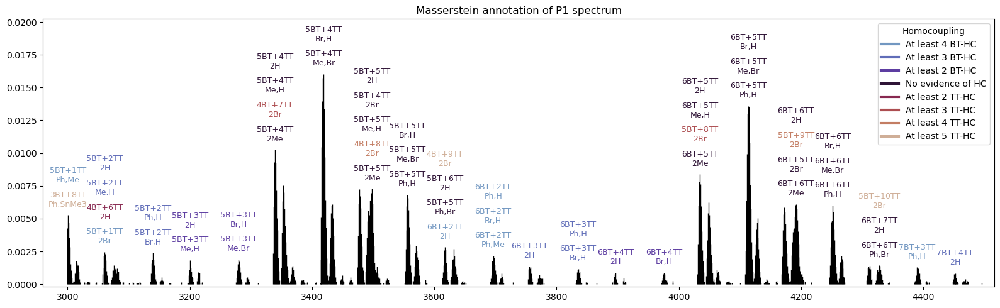

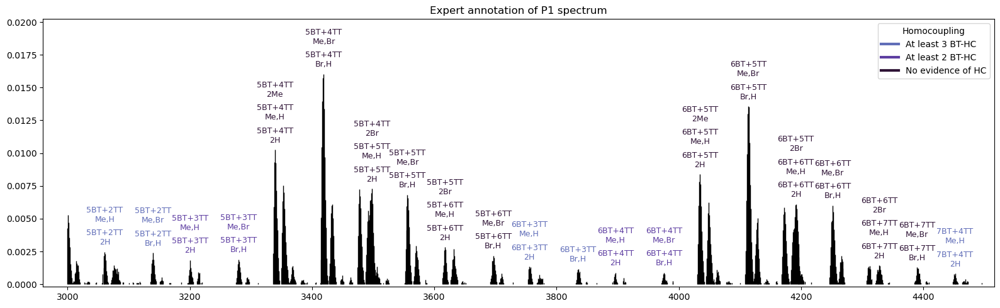

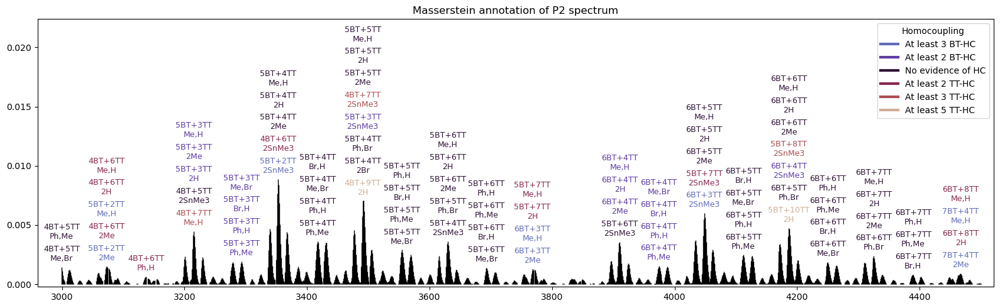

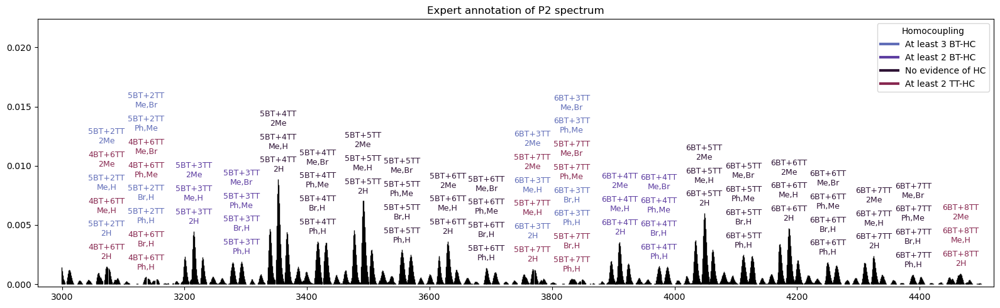

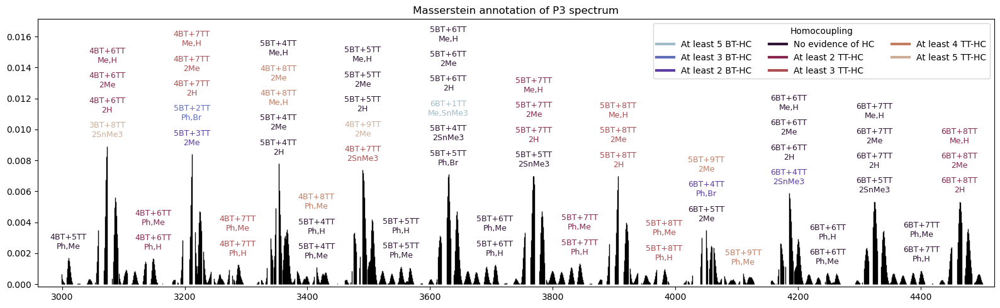

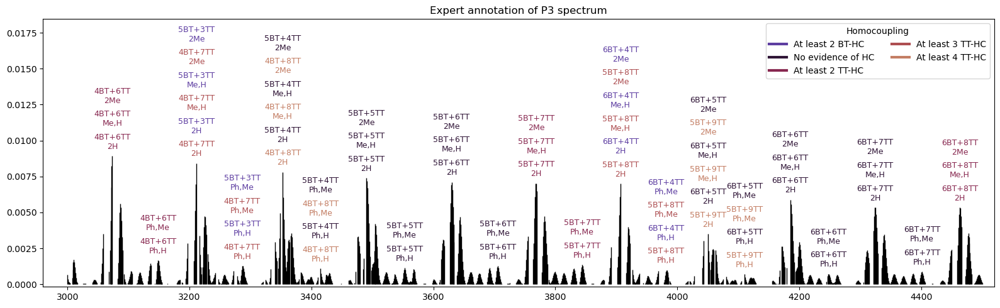

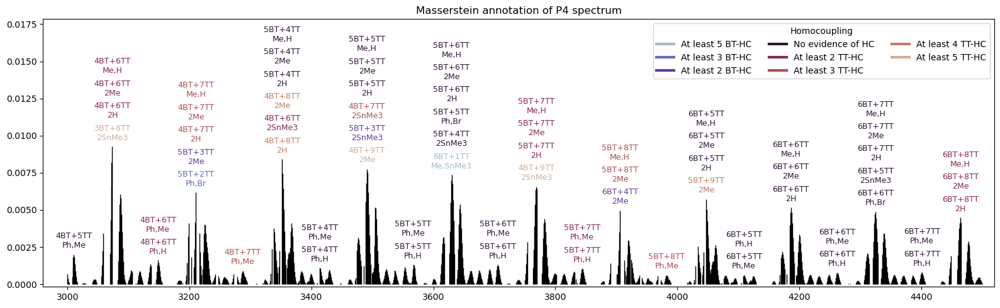

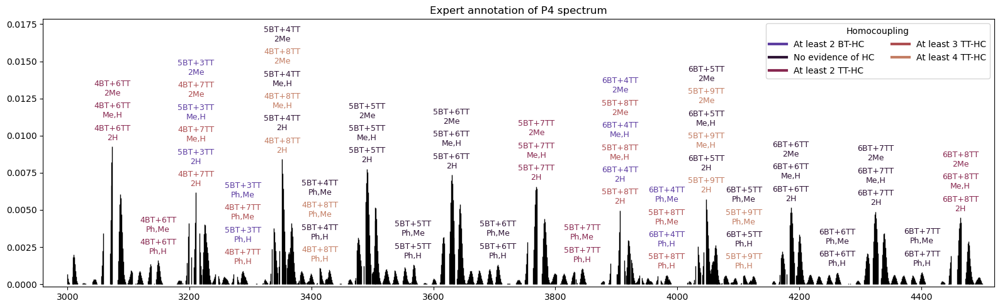

In [286]:
for name in ['P1', 'P2', 'P3', 'P4']:
    max_prop = 0
    for proportions, expert in zip([proportions_all[name], expert_proportions[name]], [False, True]):
        polymer_spectrum = polymer_spectra[name]
        #############################################
        group_width_for_top_peak = 25
        group_width = 20
        #############################################
        if name == 'P1':
            ncol=1
            if expert: vertical_separation = 0.00175
            else: vertical_separation = 0.00185
        elif name == 'P2':
            ncol=1
            if expert: vertical_separation = 0.00195
            else: vertical_separation = 0.00185
        elif name == 'P3':
            vertical_separation = 0.0016
            if expert: ncol=2
            else: ncol=3
        else: #P4
            vertical_separation = 0.0015
            if expert: ncol=2
            else: ncol=3

        proportion_threshold = p_thr
        cmap = "twilight"

        # encoding type for cm.tab10/cm.tab20, cm.twilight, cm.coolwarm
        if cmap == "twilight":
            cmap = cm.get_cmap(cmap)
            hc_types_coding = np.array(hc_types)*40 + 255
        elif cmap == "coolwarm":
            cmap = cm.get_cmap(cmap)
            arr = np.array(hc_types)
            hc_types_coding = ((arr - arr.min()) * (1/(arr.max() - arr.min()) * 255)).astype('uint8')
        elif cmap == "tab20":
            cmap == cm.get_cmap(cmap)
            all_different_hc_types = list(set(hc_types))
            all_different_hc_types.sort() # bt-hc, no-hc, tt-hc
            hc_types_coding = [all_different_hc_types.index(hc) for hc in hc_types] 
        else:
            print(f"Unrecognized cmap: {cmap}. Available cmaps: twilight, coolwarm, tab20. Selecting default tab20.")
            cmap == cm.get_cmap(cmap)
            all_different_hc_types = list(set(hc_types))
            all_different_hc_types.sort() # bt-hc, no-hc, tt-hc
            hc_types_coding = [all_different_hc_types.index(hc) for hc in hc_types] 

        # Select the information about the polymers to show on the spectrum:
        is_over_threshold = [p > proportion_threshold for p in proportions]
        props_to_plot = [p for p, t in zip(proportions, is_over_threshold) if t]
        endgroup_coding_to_plot = [p for p, t in zip(endgroup_integer_coding, is_over_threshold) if t]
        endgroups_to_plot = [all_different_endgroups_parsed[egr] for egr in endgroup_coding_to_plot]
        endgroups_to_plot = [egr.split('+') for egr in endgroups_to_plot]
        if endgroup_alt_names:
              endgroups_to_plot = [f"2{endgroup_alt_names[egr[0][1:]]}" if len(egr)==1 else f"{endgroup_alt_names[egr[0]]},{endgroup_alt_names[egr[1]]}" for egr in endgroups_to_plot]
        else:
              endgroups_to_plot = [f"2{egr[0][1:]},{egr[0][1:]}" if len(egr)==1 else f"{egr[0]},{egr[1]}" for egr in endgroups_to_plot]
        bt_count_to_plot = [p for p, t in zip(bt_count, is_over_threshold) if t]
        tt_count_to_plot = [p for p, t in zip(tt_count, is_over_threshold) if t]
        masses_to_plot = [p for p, t in zip(masses, is_over_threshold) if t]
        hc_types_to_plot = [p for p, t in zip(hc_types, is_over_threshold) if t]
        hc_types_encoding_to_plot = [p for p, t in zip(hc_types_coding, is_over_threshold) if t]

        # Group polymers with similar masses, and calculate the horizontal and vertical positions of the visualization of bt/tt counts on the spectrum.
        vertical_positions = []
        horizontal_positions = []
        group_index = [-1]
        top_peak_mz = [0]
        for ms, prev_ms in zip(masses_to_plot, [0] + masses_to_plot[:-1]):
            experimental_nbh = [cf for cf in polymer_spectrum.confs if abs(ms-cf[0]) <= group_width_for_top_peak] 
            top_peak = max(experimental_nbh, key=lambda x: x[1]) # finding hifhest peak in the group
            if abs(top_peak_mz[-1] - top_peak[0]) <= group_width:
                vertical_positions.append(vertical_positions[-1] + vertical_separation)
                horizontal_positions.append(horizontal_positions[-1])
                group_index.append(group_index[-1])
                top_peak_mz.append(top_peak_mz[-1])
            else:
                vertical_positions.append(top_peak[1] + vertical_separation)
                horizontal_positions.append(top_peak[0])
                group_index.append(group_index[-1] + 1)
                top_peak_mz.append(top_peak[0])
        group_index = group_index[1:]
        top_peak_mz = top_peak_mz[1:]

        # We'll sort polymers in groups with respect to their estimated proportions.
        all_groups = set(group_index)
        for group in all_groups:
            group_coords = [i for i, g in enumerate(group_index) if g == group]
            assert group_coords[-1] - group_coords[0] == len(group_coords) - 1, 'non-consecutive group'
            props_in_group = [(i, props_to_plot[i]) for i in group_coords]
            sorted_props = sorted(props_in_group, key = lambda x : x[1])
            sorted_positions = sorted(vertical_positions[g] for g in group_coords)
            for (g, p), vp in zip(sorted_props, sorted_positions): 
                vertical_positions[g] = vp

        ############################################
        fig, ax = plt.subplots(figsize=(16,5))
        ############################################
        polymer_spectrum.plot(show=False, color='k')
        legend_handles = []
        for bt, tt, h, v, e, p, hc in zip(bt_count_to_plot, 
                                        tt_count_to_plot, 
                                        horizontal_positions, 
                                        vertical_positions,
                                        endgroups_to_plot, 
                                        props_to_plot,
                                        hc_types_encoding_to_plot):
            ax.text(h, v, 
                      s=f"{bt}BT+{tt}TT\n{e}",
                      c=cmap(hc), 
                      rotation=0,
                      horizontalalignment='center',
                      verticalalignment='top',
                      fontsize=9)  # adjust the fonts size as needed

        hc_types_colors = list(set((hc_type, cmap(hc_code)) for hc_type, hc_code in zip(hc_types_to_plot, hc_types_encoding_to_plot)))
        hc_types_colors.sort()
        hc_types_colors = list(map(lambda x: (hc_types_map(x[0]), x[1]), hc_types_colors))

        legend_handles = [Line2D([0],
                                  [0], 
                                  linewidth=3, 
                                  c=hc_color, 
                                  label=hc_label) for hc_label, hc_color in hc_types_colors]
        # legend1 = ax.legend(handles = legend_handles, 
        #                       title = 'Homocoupling', 
        #                       bbox_to_anchor=(1., 1.025), 
        #                       loc='upper left',
        #                       # fontsize=10,
        #                       ncol=ncol)
        legend1 = ax.legend(handles = legend_handles, 
                              title = 'Homocoupling', 
                              bbox_to_anchor=(1., 1.), 
                              loc='upper right',
                              ncol=ncol)

        # if expert: plt.title(f'Numbers of BT / TT subunits for {polymer_spectrum.label} spectrum - expert annotations')
        # else: plt.title(f'Numbers of BT / TT subunits for {polymer_spectrum.label} spectrum - Masserstein annotations')
        if expert: plt.title(f'Expert annotation of {polymer_spectrum.label} spectrum')
        else: plt.title(f'Masserstein annotation of {polymer_spectrum.label} spectrum')

        if max(vertical_positions) > max_prop:
            max_prop = max(vertical_positions)
        ax.set_ylim(0 - 0.01*max_prop, 1.025*max_prop)
        # ax.set_ylim(-0.000, 0.02)
        ax.set_xlim(round(polymer_spectrum.confs[0][0])-40, round(polymer_spectrum.confs[-1][0])+20)
        plt.tight_layout()
        

## Plots - smaller interval


### P3

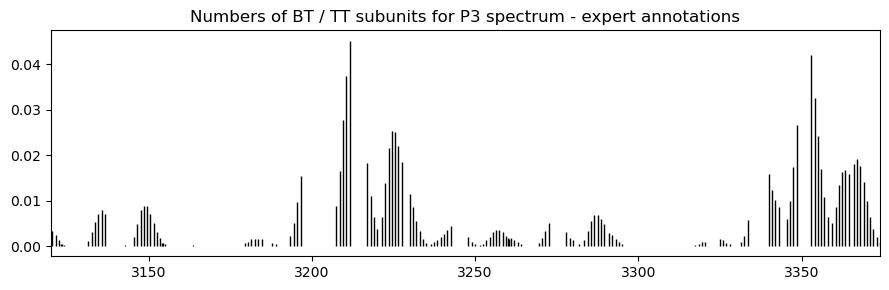

In [22]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500

interval_min = 3120
interval_max = 3375
#########################################################
path = 'Data/P3_centroided.csv'
label = 'P3'

df = pd.read_csv(path)
cols = np.array(df.columns)
cols = cols.astype('float64')
cols = cols[np.where((cols > interval_min) & (cols < interval_max))]
cols = cols.astype('str')
df = df[cols]
spectrum_mz = df.columns
spectrum_intsy = df.iloc[0, ]
spectrum_confs = list(zip(map(float, spectrum_mz), map(float, spectrum_intsy)))
spectrum_label = label
polymer_spectrum = Spectrum(confs=spectrum_confs, label=spectrum_label)
polymer_spectrum.normalize()

############################################
fig, ax = plt.subplots(figsize=(9, 3))
############################################
polymer_spectrum.plot(show=False, color='k')

plt.title(f'Numbers of BT / TT subunits for {polymer_spectrum.label} spectrum - expert annotations')

ax.set_xlim(round(polymer_spectrum.confs[0][0]), round(polymer_spectrum.confs[-1][0]))
plt.tight_layout()

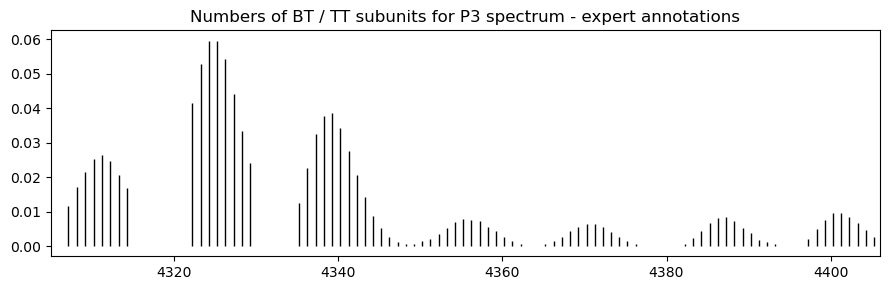

In [40]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500

# interval_min = 4180
# interval_max = 4280
interval_min = 4302
interval_max = 4418
#########################################################
label = 'P3'
path = f'Data/{label}_centroided.csv'

df = pd.read_csv(path)
cols = np.array(df.columns)
cols = cols.astype('float64')
cols = cols[np.where((cols > interval_min) & (cols < interval_max))]
cols = cols.astype('str')
df = df[cols]
spectrum_mz = df.columns
spectrum_intsy = df.iloc[0, ]
spectrum_confs = list(zip(map(float, spectrum_mz), map(float, spectrum_intsy)))
spectrum_label = label
polymer_spectrum = Spectrum(confs=spectrum_confs, label=spectrum_label)
polymer_spectrum.normalize()

############################################
fig, ax = plt.subplots(figsize=(9, 3))
############################################
polymer_spectrum.plot(show=False, color='k')

plt.title(f'Numbers of BT / TT subunits for {polymer_spectrum.label} spectrum - expert annotations')

ax.set_xlim(round(polymer_spectrum.confs[0][0]), round(polymer_spectrum.confs[-1][0]))
plt.tight_layout()

### P1

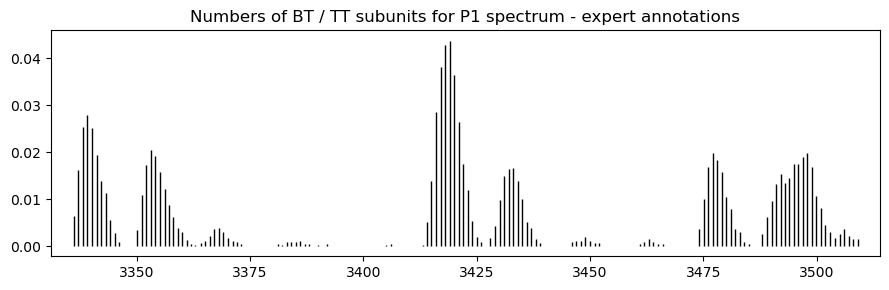

In [60]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500

interval_min = 3327
interval_max = 3510
#########################################################
label = 'P1'
path = f'Data/{label}_centroided.csv'

df = pd.read_csv(path)
cols = np.array(df.columns)
cols = cols.astype('float64')
cols = cols[np.where((cols > interval_min) & (cols < interval_max))]
cols = cols.astype('str')
df = df[cols]
spectrum_mz = df.columns
spectrum_intsy = df.iloc[0, ]
spectrum_confs = list(zip(map(float, spectrum_mz), map(float, spectrum_intsy)))
spectrum_label = label
polymer_spectrum = Spectrum(confs=spectrum_confs, label=spectrum_label)
polymer_spectrum.normalize()

############################################
fig, ax = plt.subplots(figsize=(9, 3))
############################################
polymer_spectrum.plot(show=False, color='k')

plt.title(f'Numbers of BT / TT subunits for {polymer_spectrum.label} spectrum - expert annotations')

ax.set_xlim(round(polymer_spectrum.confs[0][0])-5, round(polymer_spectrum.confs[-1][0])+5)
plt.tight_layout()

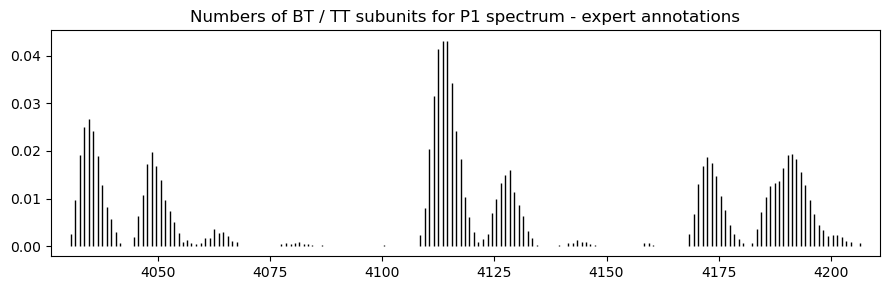

In [58]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500

interval_min = 4005
interval_max = 4215
#########################################################
label = 'P1'
path = f'Data/{label}_centroided.csv'

df = pd.read_csv(path)
cols = np.array(df.columns)
cols = cols.astype('float64')
cols = cols[np.where((cols > interval_min) & (cols < interval_max))]
cols = cols.astype('str')
df = df[cols]
spectrum_mz = df.columns
spectrum_intsy = df.iloc[0, ]
spectrum_confs = list(zip(map(float, spectrum_mz), map(float, spectrum_intsy)))
spectrum_label = label
polymer_spectrum = Spectrum(confs=spectrum_confs, label=spectrum_label)
polymer_spectrum.normalize()

############################################
fig, ax = plt.subplots(figsize=(9, 3))
############################################
polymer_spectrum.plot(show=False, color='k')

plt.title(f'Numbers of BT / TT subunits for {polymer_spectrum.label} spectrum - expert annotations')

ax.set_xlim(round(polymer_spectrum.confs[0][0])-5, round(polymer_spectrum.confs[-1][0])+5)
plt.tight_layout()

### P2

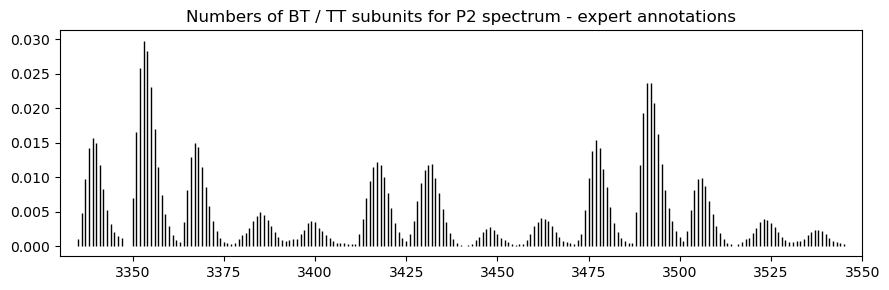

In [69]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500

interval_min = 3335
interval_max = 3545
#########################################################
label = 'P2'
path = f'Data/{label}_centroided.csv'

df = pd.read_csv(path)
cols = np.array(df.columns)
cols = cols.astype('float64')
cols = cols[np.where((cols > interval_min) & (cols < interval_max))]
cols = cols.astype('str')
df = df[cols]
spectrum_mz = df.columns
spectrum_intsy = df.iloc[0, ]
spectrum_confs = list(zip(map(float, spectrum_mz), map(float, spectrum_intsy)))
spectrum_label = label
polymer_spectrum = Spectrum(confs=spectrum_confs, label=spectrum_label)
polymer_spectrum.normalize()

############################################
fig, ax = plt.subplots(figsize=(9, 3))
############################################
polymer_spectrum.plot(show=False, color='k')

plt.title(f'Numbers of BT / TT subunits for {polymer_spectrum.label} spectrum - expert annotations')

ax.set_xlim(round(polymer_spectrum.confs[0][0])-5, round(polymer_spectrum.confs[-1][0])+5)
plt.tight_layout()

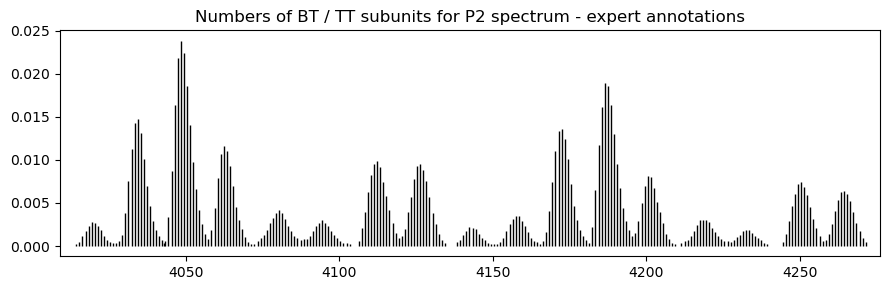

In [76]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500

interval_min = 4010
interval_max = 4276
#########################################################
label = 'P2'
path = f'Data/{label}_centroided.csv'

df = pd.read_csv(path)
cols = np.array(df.columns)
cols = cols.astype('float64')
cols = cols[np.where((cols > interval_min) & (cols < interval_max))]
cols = cols.astype('str')
df = df[cols]
spectrum_mz = df.columns
spectrum_intsy = df.iloc[0, ]
spectrum_confs = list(zip(map(float, spectrum_mz), map(float, spectrum_intsy)))
spectrum_label = label
polymer_spectrum = Spectrum(confs=spectrum_confs, label=spectrum_label)
polymer_spectrum.normalize()

############################################
fig, ax = plt.subplots(figsize=(9, 3))
############################################
polymer_spectrum.plot(show=False, color='k')

plt.title(f'Numbers of BT / TT subunits for {polymer_spectrum.label} spectrum - expert annotations')

ax.set_xlim(round(polymer_spectrum.confs[0][0])-5, round(polymer_spectrum.confs[-1][0])+5)
plt.tight_layout()

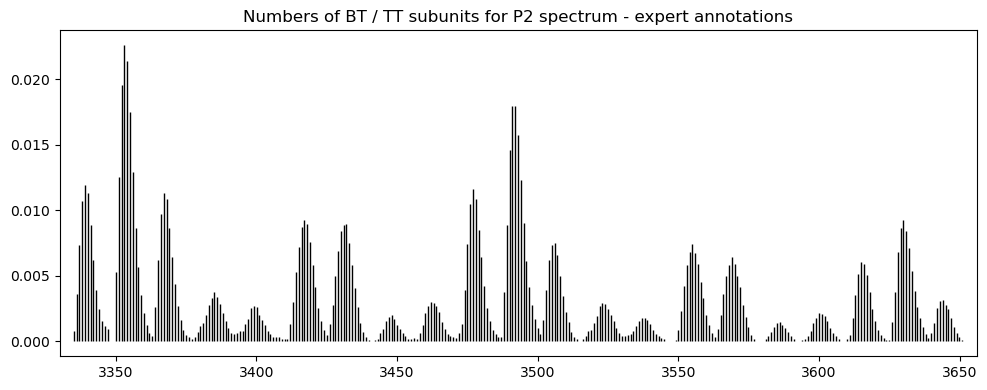

In [152]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500

interval_min = 3335
interval_max = 3655
#########################################################
label = 'P2'
path = f'Data/{label}_centroided.csv'

df = pd.read_csv(path)
cols = np.array(df.columns)
cols = cols.astype('float64')
cols = cols[np.where((cols > interval_min) & (cols < interval_max))]
cols = cols.astype('str')
df = df[cols]
spectrum_mz = df.columns
spectrum_intsy = df.iloc[0, ]
spectrum_confs = list(zip(map(float, spectrum_mz), map(float, spectrum_intsy)))
spectrum_label = label
polymer_spectrum = Spectrum(confs=spectrum_confs, label=spectrum_label)
polymer_spectrum.normalize()

############################################
fig, ax = plt.subplots(figsize=(10, 4))
############################################
polymer_spectrum.plot(show=False, color='k')

plt.title(f'Numbers of BT / TT subunits for {polymer_spectrum.label} spectrum - expert annotations')

ax.set_xlim(round(polymer_spectrum.confs[0][0])-5, round(polymer_spectrum.confs[-1][0])+5)
plt.tight_layout()

In [153]:
polymer_spectrum.get_modal_peak()

(3353.0424705949426, 0.022610469441370712)

### Final plot

In [239]:
#########################################################
bt_tt_max_count_difference = 5
pbttt_min_mz=3000
pbttt_max_mz=4500

# interval_min = 3335
# interval_max = 3515
# interval_min = 3335
# interval_max = 3580
interval_min = 3335
interval_max = 3655
#########################################################

path = f"Data/reference_spectra_max_diff_{bt_tt_max_count_difference}.csv"
df = pd.read_csv(path)
cols = np.array(df.columns)
print(len(cols))
cols = cols[np.where((df.iloc[0] >= interval_min) & (df.iloc[0] < interval_max))]
print(len(cols))
df[cols].to_csv(f"Data/reference_spectra_max_diff_{bt_tt_max_count_difference}_smaller.csv", index=None)
# df = pd.read_csv(f"Data/reference_spectra_max_diff_{bt_tt_max_count_difference}_smaller.csv")

path = f"Results/max_diff_{bt_tt_max_count_difference}/all_c14_spectras_{pbttt_min_mz}_{pbttt_max_mz}_{bt_tt_max_count_difference}_full_results.csv"
df = pd.read_csv(path, index_col=0)
df[cols].to_csv(f"Data/all_c14_spectras_{bt_tt_max_count_difference}_full_results_smaller.csv")
# df = pd.read_csv(f"Data/all_c14_spectras_{bt_tt_max_count_difference}_full_results_smaller.csv", index_col=0)

paths = ['Data/P1_centroided.csv', 
         'Data/P2_centroided.csv', 
         'Data/P3_centroided.csv', 
         'Data/P4_centroided.csv',
        ]
labels = ['P1', 'P2', 'P3', 'P4']
for path, label in zip(paths, labels):
    df = pd.read_csv(path)
    cols = np.array(df.columns)
    cols = cols.astype('float64')
    cols = cols[np.where((cols > interval_min) & (cols < interval_max))]
    cols = cols.astype('str')
    df[cols].to_csv(f'Data/{label}_centroided_smaller.csv', index=None)
    # df = pd.read_csv(f'Data/{label}_centroided_smaller.csv')

359
89


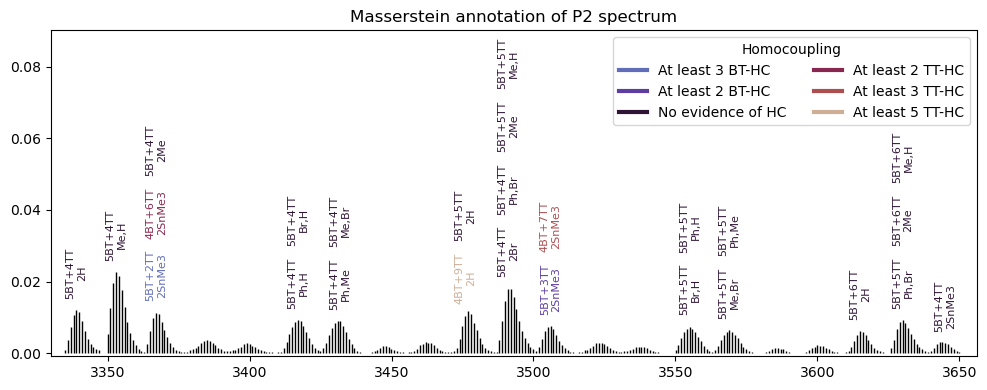

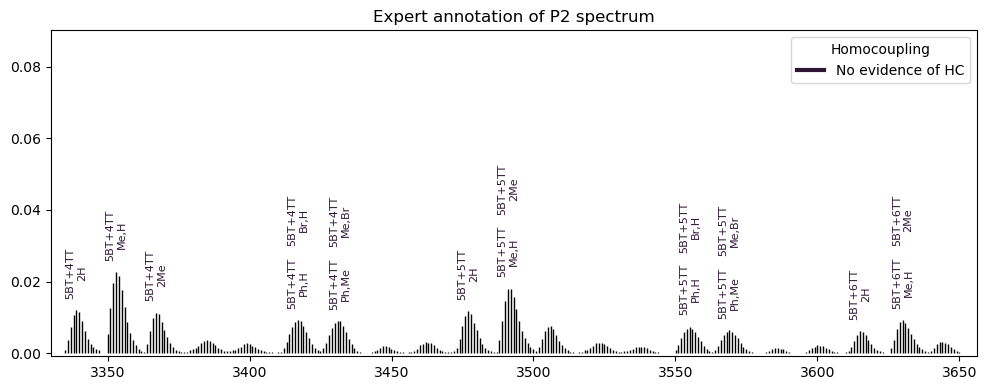

In [226]:
#########################################################
bt_tt_max_count_difference = 5
#########################################################
paths = ['Data/P1_centroided_smaller.csv', 'Data/P2_centroided_smaller.csv', 'Data/P3_centroided_smaller.csv', 'Data/P4_centroided_smaller.csv']
labels = ['P1', 'P2', 'P3', 'P4']
p_thr = 0.002 

output = polymers.parse_annotation_results(annotation_file_path = f"Data/all_c14_spectras_{bt_tt_max_count_difference}_full_results_smaller.csv", 
                                           polymer_info_path = f"Data/reference_spectra_max_diff_{bt_tt_max_count_difference}_smaller.csv", 
                                           centroided_spectra_paths = paths, 
                                           centroided_spectra_labels = labels,
                                           expert_annotations=expert_annotations,
                                          )

proportions_all, polymer_spectra, endgroup_integer_coding, all_different_endgroups_parsed, bt_count, tt_count, masses, hc_types, expert_proportions = output

def hc_types_map(x):
    if x <= -2:
        return f"At least {abs(x)} BT-HC"
    elif x >= 2:
        return f"At least {abs(x)} TT-HC"
    else:
        return f"No evidence of HC"

for name in ['P2']:
    max_prop = 0
    for proportions, expert in zip([proportions_all[name], expert_proportions[name]], [False, True]):
        polymer_spectrum = polymer_spectra[name]
        #############################################
        group_width_for_top_peak = 7
        group_width = 7
        #############################################
        if expert: vertical_separation = 0.0175
        else: vertical_separation = 0.0175
        
        proportion_threshold = p_thr
        cmap = "twilight"

        # encoding type for cm.tab10/cm.tab20, cm.twilight, cm.coolwarm
        cmap = cm.get_cmap(cmap)
        hc_types_coding = np.array(hc_types)*40 + 255

        # Select the information about the polymers to show on the spectrum:
        is_over_threshold = [p > proportion_threshold for p in proportions]
        props_to_plot = [p for p, t in zip(proportions, is_over_threshold) if t]
        endgroup_coding_to_plot = [p for p, t in zip(endgroup_integer_coding, is_over_threshold) if t]
        endgroups_to_plot = [all_different_endgroups_parsed[egr] for egr in endgroup_coding_to_plot]
        endgroups_to_plot = [egr.split('+') for egr in endgroups_to_plot]
        if endgroup_alt_names:
              endgroups_to_plot = [f"2{endgroup_alt_names[egr[0][1:]]}" if len(egr)==1 else f"{endgroup_alt_names[egr[0]]},{endgroup_alt_names[egr[1]]}" for egr in endgroups_to_plot]
        else:
              endgroups_to_plot = [f"2{egr[0][1:]},{egr[0][1:]}" if len(egr)==1 else f"{egr[0]},{egr[1]}" for egr in endgroups_to_plot]
        bt_count_to_plot = [p for p, t in zip(bt_count, is_over_threshold) if t]
        tt_count_to_plot = [p for p, t in zip(tt_count, is_over_threshold) if t]
        masses_to_plot = [p for p, t in zip(masses, is_over_threshold) if t]
        hc_types_to_plot = [p for p, t in zip(hc_types, is_over_threshold) if t]
        hc_types_encoding_to_plot = [p for p, t in zip(hc_types_coding, is_over_threshold) if t]

        # Group polymers with similar masses, and calculate the horizontal and vertical positions of the visualization of bt/tt counts on the spectrum.
        vertical_positions = []
        horizontal_positions = []
        group_index = [-1]
        top_peak_mz = [0]
        for ms, prev_ms in zip(masses_to_plot, [0] + masses_to_plot[:-1]):
            experimental_nbh = [cf for cf in polymer_spectrum.confs if abs(ms-cf[0]) <= group_width_for_top_peak] 
            top_peak = max(experimental_nbh, key=lambda x: x[1]) # finding hifhest peak in the group
            if abs(top_peak_mz[-1] - top_peak[0]) <= group_width:
                vertical_positions.append(vertical_positions[-1] + vertical_separation)
                horizontal_positions.append(horizontal_positions[-1])
                group_index.append(group_index[-1])
                top_peak_mz.append(top_peak_mz[-1])
            else:
                vertical_positions.append(top_peak[1] + vertical_separation)
                horizontal_positions.append(top_peak[0])
                group_index.append(group_index[-1] + 1)
                top_peak_mz.append(top_peak[0])
        group_index = group_index[1:]
        top_peak_mz = top_peak_mz[1:]

        # print("group index")
        # print(group_index)
        # print("horizontal positions")
        # print(horizontal_positions)
        # # print("vertical positions")
        # # print(vertical_positions)
        # print("top_peak_mz")
        # print(top_peak_mz)

        # We'll sort polymers in groups with respect to their estimated proportions.
        all_groups = set(group_index)
        for group in all_groups:
            group_coords = [i for i, g in enumerate(group_index) if g == group]
            assert group_coords[-1] - group_coords[0] == len(group_coords) - 1, 'non-consecutive group'
            props_in_group = [(i, props_to_plot[i]) for i in group_coords]
            sorted_props = sorted(props_in_group, key = lambda x : x[1])
            sorted_positions = sorted(vertical_positions[g] for g in group_coords)
            for (g, p), vp in zip(sorted_props, sorted_positions): 
                vertical_positions[g] = vp
        ############################################
        fig, ax = plt.subplots(figsize=(10, 4))
        ############################################
        polymer_spectrum.plot(show=False, color='k')
        legend_handles = []
        for bt, tt, h, v, e, p, hc in zip(bt_count_to_plot, 
                                        tt_count_to_plot, 
                                        horizontal_positions, 
                                        vertical_positions,
                                        endgroups_to_plot, 
                                        props_to_plot,
                                        hc_types_encoding_to_plot):
            ax.text(h, v, 
                      s=f"{bt}BT+{tt}TT\n{e}",
                      c=cmap(hc), 
                      rotation=90,
                      horizontalalignment='center',
                      verticalalignment='top',
                      fontsize=8)  # adjust the fonts size as needed

        hc_types_colors = list(set((hc_type, cmap(hc_code)) for hc_type, hc_code in zip(hc_types_to_plot, hc_types_encoding_to_plot)))
        hc_types_colors.sort()
        hc_types_colors = list(map(lambda x: (hc_types_map(x[0]), x[1]), hc_types_colors))

        legend_handles = [Line2D([0],
                                  [0], 
                                  linewidth=3, 
                                  c=hc_color, 
                                  label=hc_label) for hc_label, hc_color in hc_types_colors]
        # legend1 = ax.legend(handles = legend_handles, 
        #                       title = 'Homocoupling', 
        #                       bbox_to_anchor=(1., 1.025), 
        #                       loc='upper left',
        #                       # fontsize=10,
        #                       ncol=1)
        legend1 = ax.legend(handles = legend_handles, 
                              title = 'Homocoupling', 
                              bbox_to_anchor=(1., 1), 
                              loc='upper right',
                              fontsize=10,
                              ncol=2)

        if expert: plt.title(f'Expert annotation of {polymer_spectrum.label} spectrum')
        else: plt.title(f'Masserstein annotation of {polymer_spectrum.label} spectrum')

        if max(vertical_positions) > max_prop:
            max_prop = max(vertical_positions)
        ax.set_ylim(0 - 0.01*max_prop, 1.025*max_prop)
        # ax.set_ylim(-0.000, 0.04)
        ax.set_xlim(round(polymer_spectrum.confs[0][0])-5, round(polymer_spectrum.confs[-1][0])+5)
        plt.tight_layout()


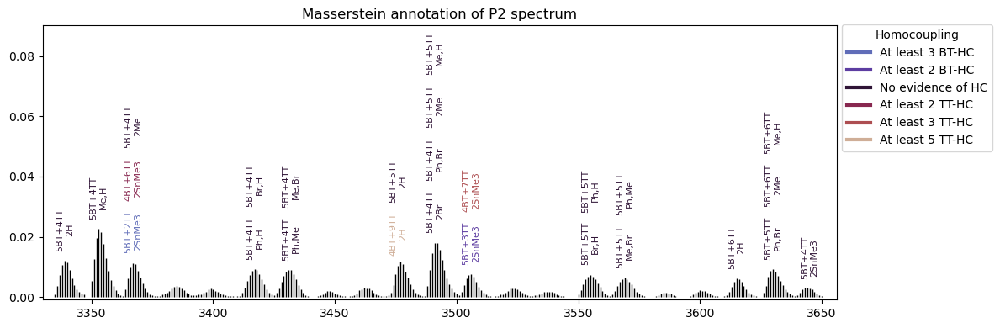

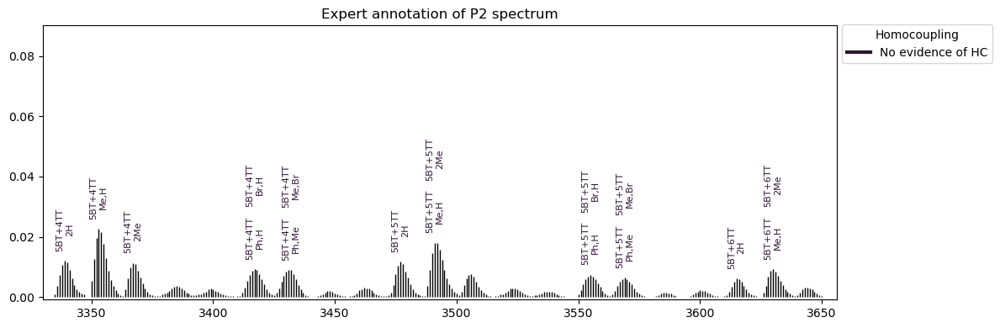

In [234]:
#########################################################
bt_tt_max_count_difference = 5
#########################################################
paths = ['Data/P1_centroided_smaller.csv', 'Data/P2_centroided_smaller.csv', 'Data/P3_centroided_smaller.csv', 'Data/P4_centroided_smaller.csv']
labels = ['P1', 'P2', 'P3', 'P4']
p_thr = 0.002 

output = polymers.parse_annotation_results(annotation_file_path = f"Data/all_c14_spectras_{bt_tt_max_count_difference}_full_results_smaller.csv", 
                                           polymer_info_path = f"Data/reference_spectra_max_diff_{bt_tt_max_count_difference}_smaller.csv", 
                                           centroided_spectra_paths = paths, 
                                           centroided_spectra_labels = labels,
                                           expert_annotations=expert_annotations,
                                          )

proportions_all, polymer_spectra, endgroup_integer_coding, all_different_endgroups_parsed, bt_count, tt_count, masses, hc_types, expert_proportions = output

def hc_types_map(x):
    if x <= -2:
        return f"At least {abs(x)} BT-HC"
    elif x >= 2:
        return f"At least {abs(x)} TT-HC"
    else:
        return f"No evidence of HC"

for name in ['P2']:
    max_prop = 0
    for proportions, expert in zip([proportions_all[name], expert_proportions[name]], [False, True]):
        polymer_spectrum = polymer_spectra[name]
        #############################################
        group_width_for_top_peak = 7
        group_width = 7
        #############################################
        if expert: vertical_separation = 0.0175
        else: vertical_separation = 0.0175
        
        proportion_threshold = p_thr
        cmap = "twilight"

        # encoding type for cm.tab10/cm.tab20, cm.twilight, cm.coolwarm
        cmap = cm.get_cmap(cmap)
        hc_types_coding = np.array(hc_types)*40 + 255

        # Select the information about the polymers to show on the spectrum:
        is_over_threshold = [p > proportion_threshold for p in proportions]
        props_to_plot = [p for p, t in zip(proportions, is_over_threshold) if t]
        endgroup_coding_to_plot = [p for p, t in zip(endgroup_integer_coding, is_over_threshold) if t]
        endgroups_to_plot = [all_different_endgroups_parsed[egr] for egr in endgroup_coding_to_plot]
        endgroups_to_plot = [egr.split('+') for egr in endgroups_to_plot]
        if endgroup_alt_names:
              endgroups_to_plot = [f"2{endgroup_alt_names[egr[0][1:]]}" if len(egr)==1 else f"{endgroup_alt_names[egr[0]]},{endgroup_alt_names[egr[1]]}" for egr in endgroups_to_plot]
        else:
              endgroups_to_plot = [f"2{egr[0][1:]},{egr[0][1:]}" if len(egr)==1 else f"{egr[0]},{egr[1]}" for egr in endgroups_to_plot]
        bt_count_to_plot = [p for p, t in zip(bt_count, is_over_threshold) if t]
        tt_count_to_plot = [p for p, t in zip(tt_count, is_over_threshold) if t]
        masses_to_plot = [p for p, t in zip(masses, is_over_threshold) if t]
        hc_types_to_plot = [p for p, t in zip(hc_types, is_over_threshold) if t]
        hc_types_encoding_to_plot = [p for p, t in zip(hc_types_coding, is_over_threshold) if t]

        # Group polymers with similar masses, and calculate the horizontal and vertical positions of the visualization of bt/tt counts on the spectrum.
        vertical_positions = []
        horizontal_positions = []
        group_index = [-1]
        top_peak_mz = [0]
        for ms, prev_ms in zip(masses_to_plot, [0] + masses_to_plot[:-1]):
            experimental_nbh = [cf for cf in polymer_spectrum.confs if abs(ms-cf[0]) <= group_width_for_top_peak] 
            top_peak = max(experimental_nbh, key=lambda x: x[1]) # finding hifhest peak in the group
            if abs(top_peak_mz[-1] - top_peak[0]) <= group_width:
                vertical_positions.append(vertical_positions[-1] + vertical_separation)
                horizontal_positions.append(horizontal_positions[-1])
                group_index.append(group_index[-1])
                top_peak_mz.append(top_peak_mz[-1])
            else:
                vertical_positions.append(top_peak[1] + vertical_separation)
                horizontal_positions.append(top_peak[0])
                group_index.append(group_index[-1] + 1)
                top_peak_mz.append(top_peak[0])
        group_index = group_index[1:]
        top_peak_mz = top_peak_mz[1:]

        # print("group index")
        # print(group_index)
        # print("horizontal positions")
        # print(horizontal_positions)
        # # print("vertical positions")
        # # print(vertical_positions)
        # print("top_peak_mz")
        # print(top_peak_mz)

        # We'll sort polymers in groups with respect to their estimated proportions.
        all_groups = set(group_index)
        for group in all_groups:
            group_coords = [i for i, g in enumerate(group_index) if g == group]
            assert group_coords[-1] - group_coords[0] == len(group_coords) - 1, 'non-consecutive group'
            props_in_group = [(i, props_to_plot[i]) for i in group_coords]
            sorted_props = sorted(props_in_group, key = lambda x : x[1])
            sorted_positions = sorted(vertical_positions[g] for g in group_coords)
            for (g, p), vp in zip(sorted_props, sorted_positions): 
                vertical_positions[g] = vp
        ############################################
        fig, ax = plt.subplots(figsize=(12, 4))
        ############################################
        polymer_spectrum.plot(show=False, color='k')
        legend_handles = []
        for bt, tt, h, v, e, p, hc in zip(bt_count_to_plot, 
                                        tt_count_to_plot, 
                                        horizontal_positions, 
                                        vertical_positions,
                                        endgroups_to_plot, 
                                        props_to_plot,
                                        hc_types_encoding_to_plot):
            ax.text(h, v, 
                      s=f"{bt}BT+{tt}TT\n{e}",
                      c=cmap(hc), 
                      rotation=90,
                      horizontalalignment='center',
                      verticalalignment='top',
                      fontsize=8)  # adjust the fonts size as needed

        hc_types_colors = list(set((hc_type, cmap(hc_code)) for hc_type, hc_code in zip(hc_types_to_plot, hc_types_encoding_to_plot)))
        hc_types_colors.sort()
        hc_types_colors = list(map(lambda x: (hc_types_map(x[0]), x[1]), hc_types_colors))

        legend_handles = [Line2D([0],
                                  [0], 
                                  linewidth=3, 
                                  c=hc_color, 
                                  label=hc_label) for hc_label, hc_color in hc_types_colors]
        legend1 = ax.legend(handles = legend_handles, 
                              title = 'Homocoupling', 
                              bbox_to_anchor=(1., 1.025), 
                              loc='upper left',
                              # fontsize=10,
                              ncol=1)
        # legend1 = ax.legend(handles = legend_handles, 
        #                       title = 'Homocoupling', 
        #                       bbox_to_anchor=(1., 1), 
        #                       loc='upper right',
        #                       fontsize=10,
        #                       ncol=2)

        if expert: plt.title(f'Expert annotation of {polymer_spectrum.label} spectrum')
        else: plt.title(f'Masserstein annotation of {polymer_spectrum.label} spectrum')

        if max(vertical_positions) > max_prop:
            max_prop = max(vertical_positions)
        ax.set_ylim(0 - 0.01*max_prop, 1.025*max_prop)
        # ax.set_ylim(-0.000, 0.04)
        ax.set_xlim(round(polymer_spectrum.confs[0][0])-5, round(polymer_spectrum.confs[-1][0])+5)
        plt.tight_layout()


### Smaller interval - all spectra

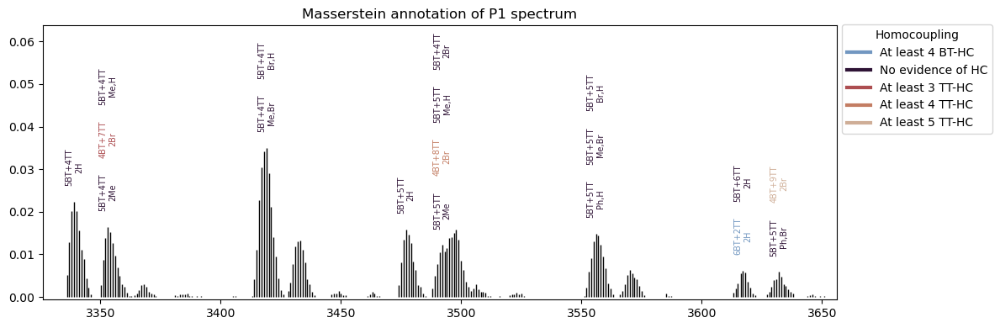

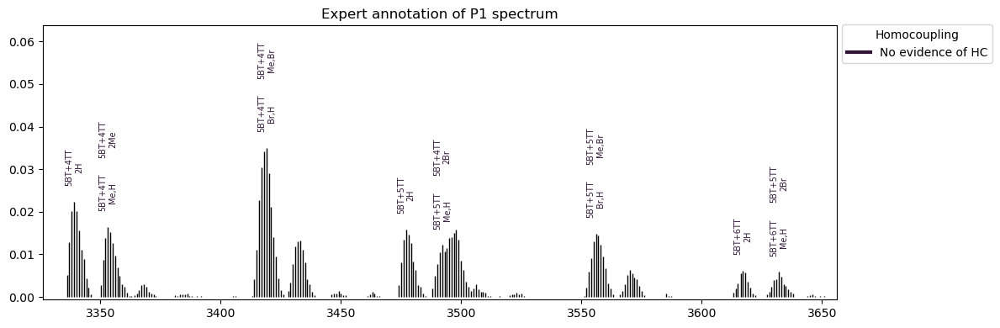

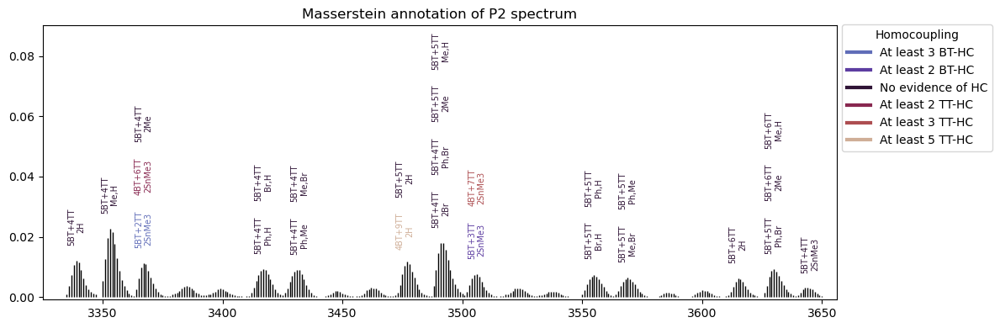

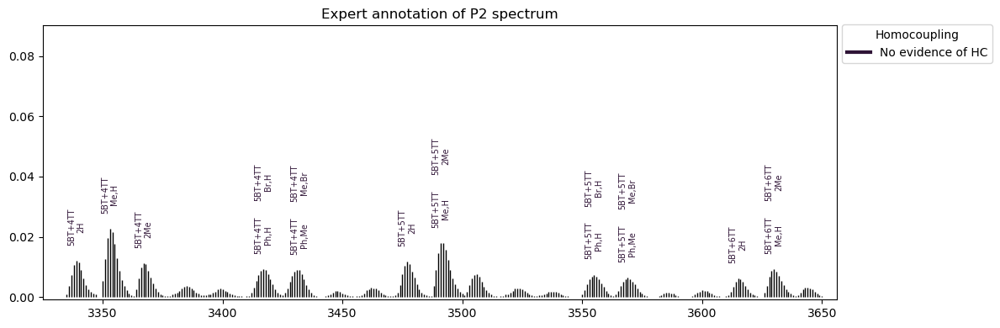

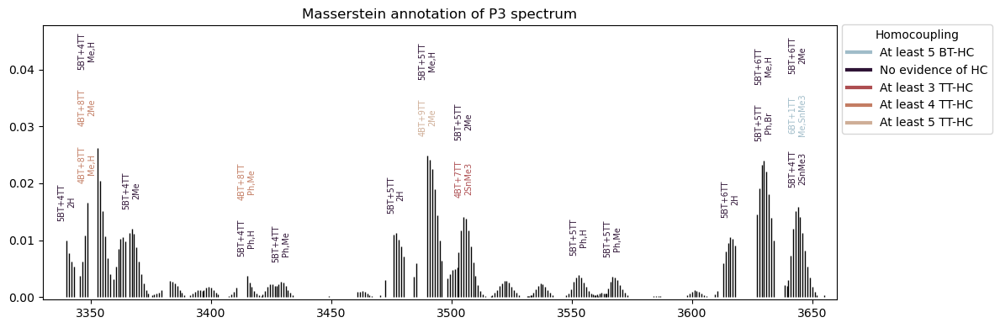

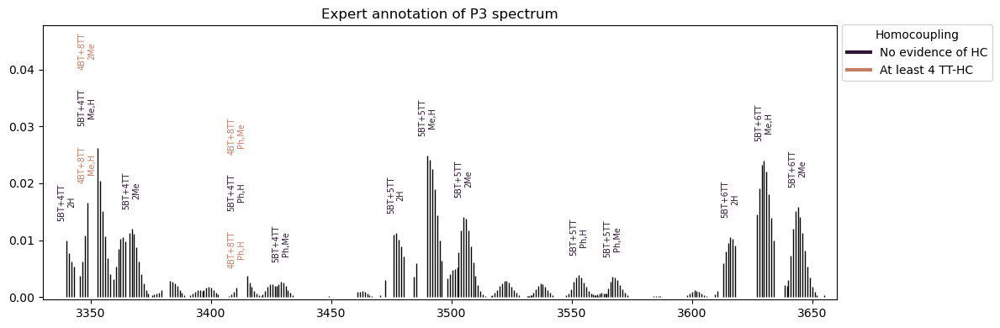

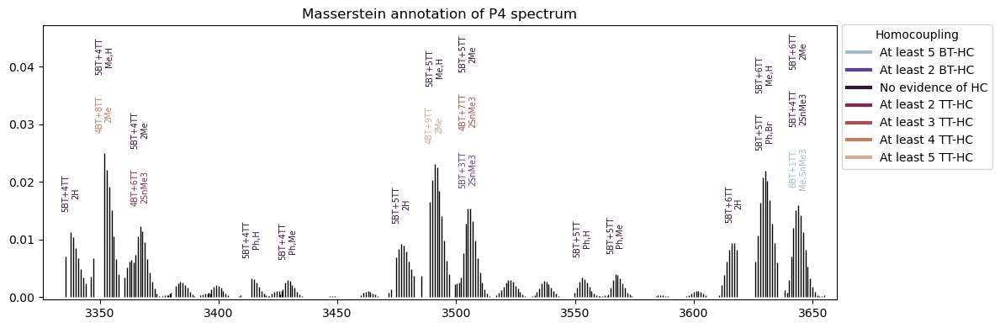

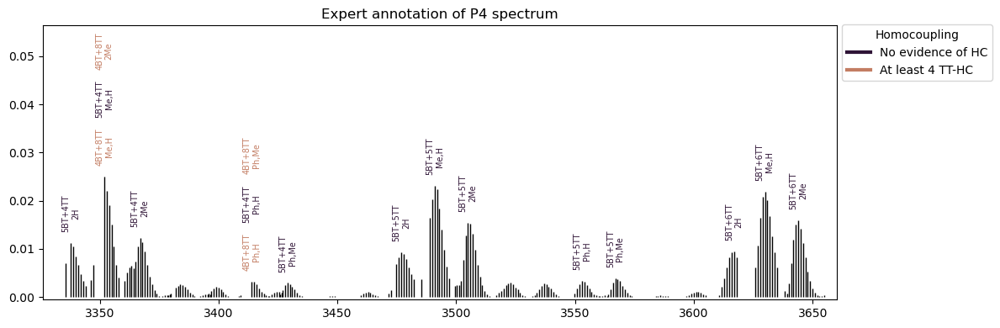

In [243]:
#########################################################
bt_tt_max_count_difference = 5
#########################################################
paths = ['Data/P1_centroided_smaller.csv', 'Data/P2_centroided_smaller.csv', 'Data/P3_centroided_smaller.csv', 'Data/P4_centroided_smaller.csv']
labels = ['P1', 'P2', 'P3', 'P4']
p_thr = 0.002 

output = polymers.parse_annotation_results(annotation_file_path = f"Data/all_c14_spectras_{bt_tt_max_count_difference}_full_results_smaller.csv", 
                                           polymer_info_path = f"Data/reference_spectra_max_diff_{bt_tt_max_count_difference}_smaller.csv", 
                                           centroided_spectra_paths = paths, 
                                           centroided_spectra_labels = labels,
                                           expert_annotations=expert_annotations,
                                          )

proportions_all, polymer_spectra, endgroup_integer_coding, all_different_endgroups_parsed, bt_count, tt_count, masses, hc_types, expert_proportions = output

def hc_types_map(x):
    if x <= -2:
        return f"At least {abs(x)} BT-HC"
    elif x >= 2:
        return f"At least {abs(x)} TT-HC"
    else:
        return f"No evidence of HC"

for name in ['P1', 'P2', 'P3', 'P4']:
# for name in ['P3']:
    max_prop = 0
    for proportions, expert in zip([proportions_all[name], expert_proportions[name]], [False, True]):
        polymer_spectrum = polymer_spectra[name]

        #############################################
        group_width_for_top_peak = 7
        group_width = 7
        #############################################
        if name == 'P2':
            if expert: vertical_separation=0.0175
            else: vertical_separation = 0.0175
        elif name == 'P1':
           vertical_separation = 0.0125 
        else: vertical_separation = 0.01

        proportion_threshold = p_thr
        cmap = "twilight"

        # encoding type for cm.tab10/cm.tab20, cm.twilight, cm.coolwarm
        if cmap == "twilight":
            cmap = cm.get_cmap(cmap)
            hc_types_coding = np.array(hc_types)*40 + 255
        elif cmap == "coolwarm":
            cmap = cm.get_cmap(cmap)
            arr = np.array(hc_types)
            hc_types_coding = ((arr - arr.min()) * (1/(arr.max() - arr.min()) * 255)).astype('uint8')
        elif cmap == "tab20":
            cmap == cm.get_cmap(cmap)
            all_different_hc_types = list(set(hc_types))
            all_different_hc_types.sort() # bt-hc, no-hc, tt-hc
            hc_types_coding = [all_different_hc_types.index(hc) for hc in hc_types] 
        else:
            print(f"Unrecognized cmap: {cmap}. Available cmaps: twilight, coolwarm, tab20. Selecting default tab20.")
            cmap == cm.get_cmap(cmap)
            all_different_hc_types = list(set(hc_types))
            all_different_hc_types.sort() # bt-hc, no-hc, tt-hc
            hc_types_coding = [all_different_hc_types.index(hc) for hc in hc_types] 

        # Select the information about the polymers to show on the spectrum:
        is_over_threshold = [p > proportion_threshold for p in proportions]
        props_to_plot = [p for p, t in zip(proportions, is_over_threshold) if t]
        endgroup_coding_to_plot = [p for p, t in zip(endgroup_integer_coding, is_over_threshold) if t]
        endgroups_to_plot = [all_different_endgroups_parsed[egr] for egr in endgroup_coding_to_plot]
        endgroups_to_plot = [egr.split('+') for egr in endgroups_to_plot]
        if endgroup_alt_names:
              endgroups_to_plot = [f"2{endgroup_alt_names[egr[0][1:]]}" if len(egr)==1 else f"{endgroup_alt_names[egr[0]]},{endgroup_alt_names[egr[1]]}" for egr in endgroups_to_plot]
        else:
              endgroups_to_plot = [f"2{egr[0][1:]},{egr[0][1:]}" if len(egr)==1 else f"{egr[0]},{egr[1]}" for egr in endgroups_to_plot]
        bt_count_to_plot = [p for p, t in zip(bt_count, is_over_threshold) if t]
        tt_count_to_plot = [p for p, t in zip(tt_count, is_over_threshold) if t]
        masses_to_plot = [p for p, t in zip(masses, is_over_threshold) if t]
        hc_types_to_plot = [p for p, t in zip(hc_types, is_over_threshold) if t]
        hc_types_encoding_to_plot = [p for p, t in zip(hc_types_coding, is_over_threshold) if t]

        # Group polymers with similar masses, and calculate the horizontal and vertical positions of the visualization of bt/tt counts on the spectrum.
        vertical_positions = []
        horizontal_positions = []
        group_index = [-1]
        top_peak_mz = [0]
        for ms, prev_ms in zip(masses_to_plot, [0] + masses_to_plot[:-1]):
            experimental_nbh = [cf for cf in polymer_spectrum.confs if abs(ms-cf[0]) <= group_width_for_top_peak] 
            top_peak = max(experimental_nbh, key=lambda x: x[1]) # finding hifhest peak in the group
            if abs(top_peak_mz[-1] - top_peak[0]) <= group_width:
                vertical_positions.append(vertical_positions[-1] + vertical_separation)
                horizontal_positions.append(horizontal_positions[-1])
                group_index.append(group_index[-1])
                top_peak_mz.append(top_peak_mz[-1])
            else:
                vertical_positions.append(top_peak[1] + vertical_separation)
                horizontal_positions.append(top_peak[0])
                group_index.append(group_index[-1] + 1)
                top_peak_mz.append(top_peak[0])
        group_index = group_index[1:]
        top_peak_mz = top_peak_mz[1:]

        # We'll sort polymers in groups with respect to their estimated proportions.
        all_groups = set(group_index)
        for group in all_groups:
            group_coords = [i for i, g in enumerate(group_index) if g == group]
            assert group_coords[-1] - group_coords[0] == len(group_coords) - 1, 'non-consecutive group'
            props_in_group = [(i, props_to_plot[i]) for i in group_coords]
            sorted_props = sorted(props_in_group, key = lambda x : x[1])
            sorted_positions = sorted(vertical_positions[g] for g in group_coords)
            for (g, p), vp in zip(sorted_props, sorted_positions): 
                vertical_positions[g] = vp
        
        ############################################
        fig, ax = plt.subplots(figsize=(12,4))
        ############################################
        polymer_spectrum.plot(show=False, color='k')
        legend_handles = []
        for bt, tt, h, v, e, p, hc in zip(bt_count_to_plot, 
                                        tt_count_to_plot, 
                                        horizontal_positions, 
                                        vertical_positions,
                                        endgroups_to_plot, 
                                        props_to_plot,
                                        hc_types_encoding_to_plot):
            ax.text(h, v, 
                      s=f"{bt}BT+{tt}TT\n{e}",
                      c=cmap(hc), 
                      rotation=90,
                      horizontalalignment='center',
                      verticalalignment='top',
                      fontsize=7)  # adjust the fonts size as needed

        hc_types_colors = list(set((hc_type, cmap(hc_code)) for hc_type, hc_code in zip(hc_types_to_plot, hc_types_encoding_to_plot)))
        hc_types_colors.sort()
        hc_types_colors = list(map(lambda x: (hc_types_map(x[0]), x[1]), hc_types_colors))

        legend_handles = [Line2D([0],
                                  [0], 
                                  linewidth=3, 
                                  c=hc_color, 
                                  label=hc_label) for hc_label, hc_color in hc_types_colors]
        legend1 = ax.legend(handles = legend_handles, 
                              title = 'Homocoupling', 
                              bbox_to_anchor=(1., 1.025), 
                              loc='upper left',
                              # fontsize=10,
                              ncol=1)
        # legend1 = ax.legend(handles = legend_handles, 
        #                       title = 'Homocoupling', 
        #                       bbox_to_anchor=(1., 1.), 
        #                       loc='upper right',
        #                       ncol=1)

        # if expert: plt.title(f'Numbers of BT / TT subunits for {polymer_spectrum.label} spectrum - expert annotations')
        # else: plt.title(f'Numbers of BT / TT subunits for {polymer_spectrum.label} spectrum - Masserstein annotations')
        if expert: plt.title(f'Expert annotation of {polymer_spectrum.label} spectrum')
        else: plt.title(f'Masserstein annotation of {polymer_spectrum.label} spectrum')

        if max(vertical_positions) > max_prop:
            max_prop = max(vertical_positions)
        ax.set_ylim(0 - 0.01*max_prop, 1.025*max_prop)
        # ax.set_ylim(-0.000, 0.034)
        ax.set_xlim(round(polymer_spectrum.confs[0][0])-10, round(polymer_spectrum.confs[-1][0])+5)
        plt.tight_layout()